# Project Overview

#### Term deposits are cash investments kept at financial institutions and serve as a significant revenue stream for banks, making their promotion crucial for financial institutions. Telemarketing continues to be a favored marketing strategy due to the potential effectiveness of direct human interaction over the phone, which often contrasts sharply with the impersonal and automated nature of many social and digital media marketing messages. Nonetheless, carrying out this direct marketing  approach typically demands substantial business investment, as it necessitates contracting large call centers to directly reach clients.

# Libraries

In [1]:
import numpy as np
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report,roc_curve,confusion_matrix,accuracy_score,recall_score,precision_score,f1_score, roc_auc_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

In [2]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier

In [3]:
from warnings import filterwarnings
filterwarnings('ignore')

pd.options.display.max_columns = None
pd.options.display.float_format = '{:6f}'.format

In [4]:
# set the plot size using 'rcParams'
# once the plot size is set using 'rcParams', it sets the size of all the forthcoming plots in the file
# pass width and height in inches to 'figure.figsize'
plt.rcParams['figure.figsize'] = [15,8]

# Reading the dataset

In [5]:
data = pd.read_csv('bank-direct-marketing-campaigns-Copy1.csv')

df = data

df.head() # target variable is 'y' which is categorical

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,1,999,0,nonexistent,1.100000,93.994000,-36.400000,4.857000,5191.000000,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,1,999,0,nonexistent,1.100000,93.994000,-36.400000,4.857000,5191.000000,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,1,999,0,nonexistent,1.100000,93.994000,-36.400000,4.857000,5191.000000,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,1,999,0,nonexistent,1.100000,93.994000,-36.400000,4.857000,5191.000000,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,1,999,0,nonexistent,1.100000,93.994000,-36.400000,4.857000,5191.000000,no


# Descriptive Statistics

In [6]:
df.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 20 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  campaign        41188 non-null  int64  
 11  pdays           41188 non-null  int64  
 12  previous        41188 non-null  int64  
 13  poutcome        41188 non-null  object 
 14  emp.var.rate    41188 non-null  float64
 15  cons.price.idx  41188 non-null  float64
 16  cons.conf.idx   41188 non-null  float64
 17  euribor3m       41188 non-null 

>* Our dataset concludes of  11 categorical variables and 9 numerical variables (5 continuous-numeric and 4 discrete-numeric)

In [7]:
print('We have ',df.shape[0],'number of rows and ',df.shape[1],'columns :',df.shape)

We have  41188 number of rows and  20 columns : (41188, 20)


In [8]:
df.describe()

,age,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
count,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000
mean,40.024060,2.567593,962.475454,0.172963,0.081886,93.575664,-40.502600,3.621291,5167.035911
std,10.421250,2.770014,186.910907,0.494901,1.570960,0.578840,4.628198,1.734447,72.251528
min,17.000000,1.000000,0.000000,0.000000,-3.400000,92.201000,-50.800000,0.634000,4963.600000
25%,32.000000,1.000000,999.000000,0.000000,-1.800000,93.075000,-42.700000,1.344000,5099.100000
50%,38.000000,2.000000,999.000000,0.000000,1.100000,93.749000,-41.800000,4.857000,5191.000000
75%,47.000000,3.000000,999.000000,0.000000,1.400000,93.994000,-36.400000,4.961000,5228.100000
max,98.000000,56.000000,999.000000,7.000000,1.400000,94.767000,-26.900000,5.045000,5228.100000


>* Here, we can see that for some variables mean<>median<>mode which indicates skewness in the variables and hence would require transformation to be performed before fitting into the model

# STEP 1: EDA - which included univariate of every feature, bivariate which is a combination of every numeric with numeric, every categorical with categorical, every combination of numeric with categorical and every variable with target, multivariate

# Univariate Analysis (numerical)

In [9]:
numerical_variables = df.select_dtypes(include=np.number)

In [10]:
categorical_variables = df.select_dtypes(['object','category'])

Skewness of each column is as follows :  
 age               0.784697
campaign          4.762507
pdays            -4.922190
previous          3.832042
emp.var.rate     -0.724096
cons.price.idx   -0.230888
cons.conf.idx     0.303180
euribor3m        -0.709188
nr.employed      -1.044262
dtype: float64


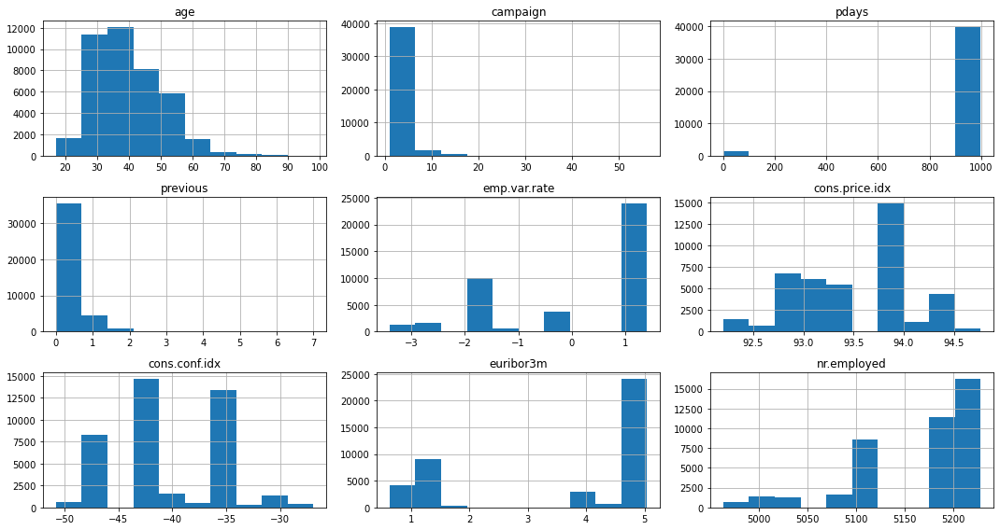

In [11]:
print('Skewness of each column is as follows : ','\n', numerical_variables.skew())
numerical_variables.hist()
plt.tight_layout()

### Inferences:

>* Age:
The age distribution is right-skewed, with a majority of younger clients. Marketing strategies should focus on younger demographics, who make up the bulk of the customer base.

>* Campaign Contacts:
Most clients were contacted only a few times, suggesting initial contacts are crucial. Enhancing the quality of first few contacts could improve campaign effectiveness.

>* Pdays:
A majority of clients had no previous contact, indicating a large segment of new customers. Initial engagement strategies are key to converting these first-time contacts.

>* Previous Contacts:
Most clients had very few previous contacts, which implies that repeated attempts are rare. Businesses might consider increasing follow-up contacts to improve conversion rates.

>* Economic Indicators:
The variability in economic indicators reflects general economic trends. Aligning campaigns with favorable economic conditions can enhance response rates.

### These insights provide a focused approach to targeting and engaging customers based on their demographics and interaction history, ultimately improving campaign effectiveness.

# Univariate Analysis( Categorical)

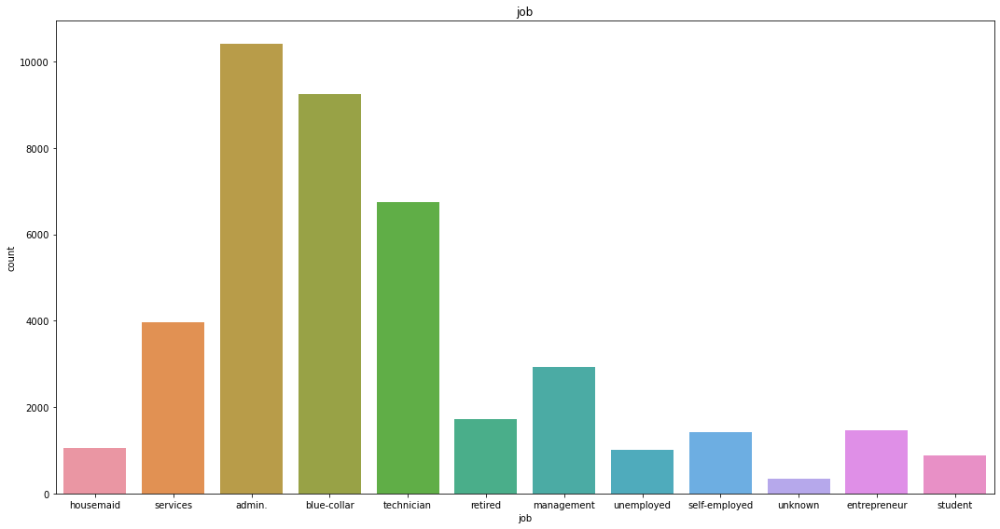

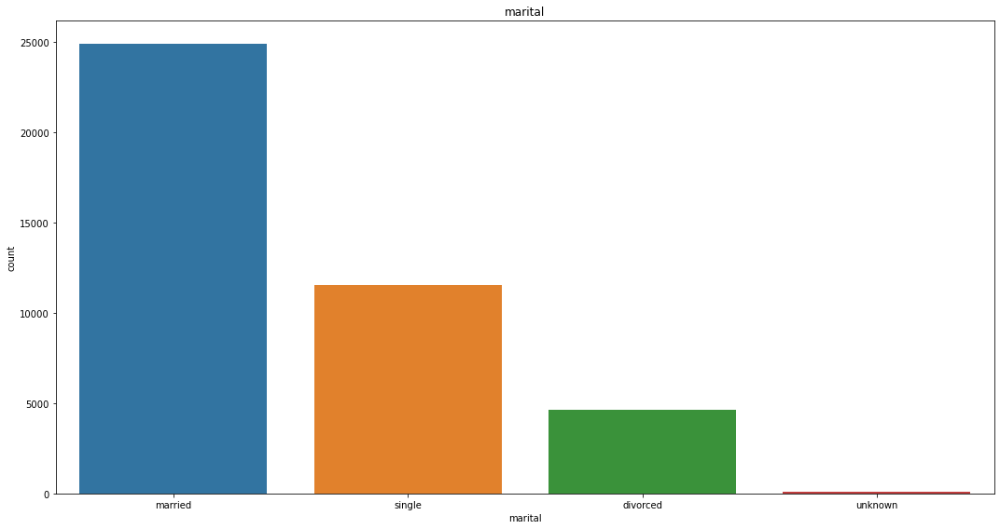

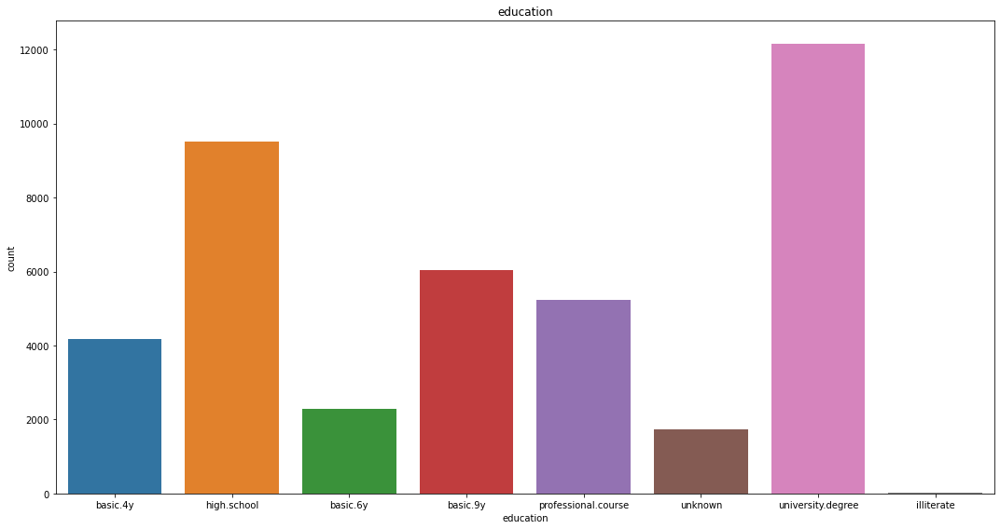

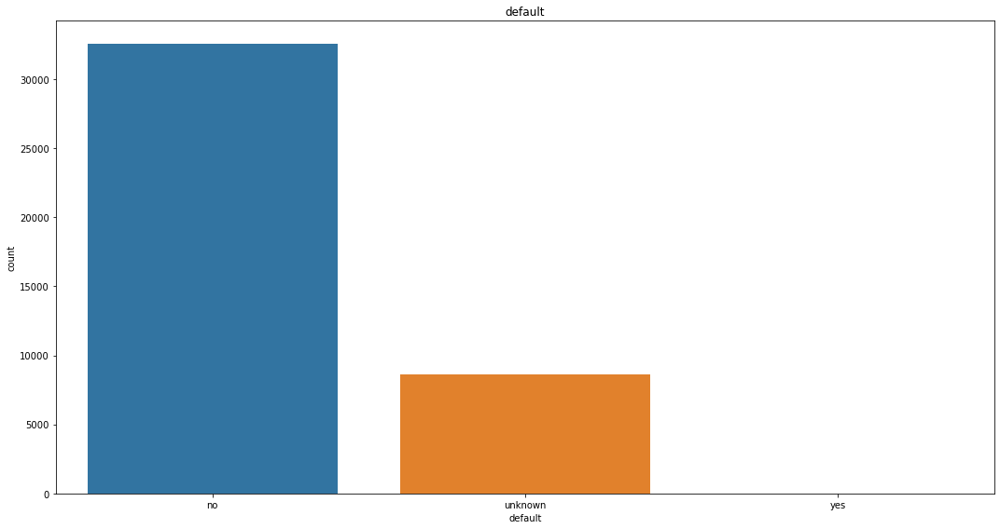

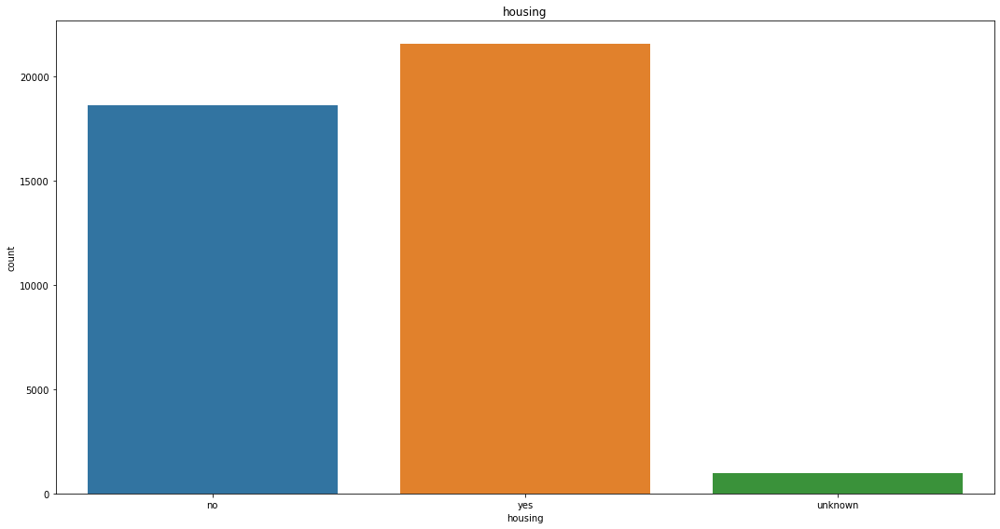

...

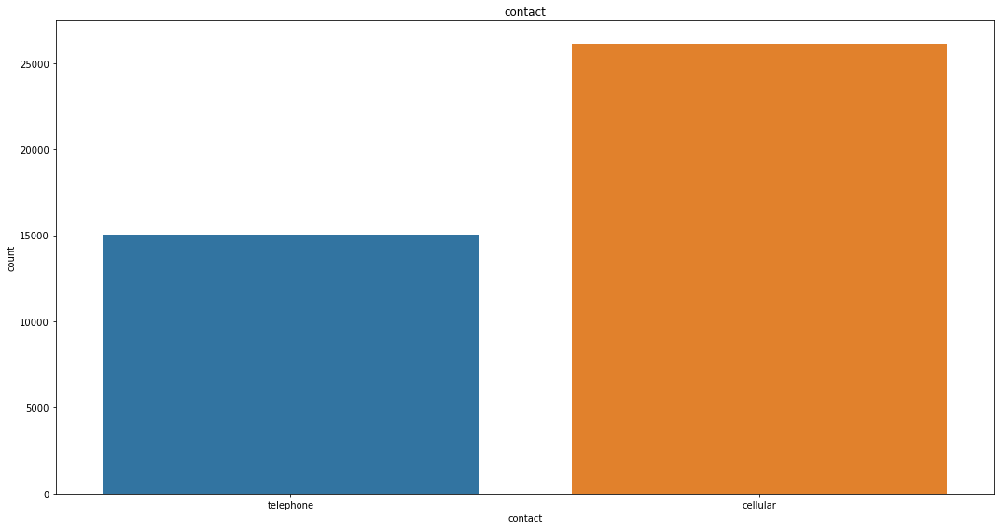

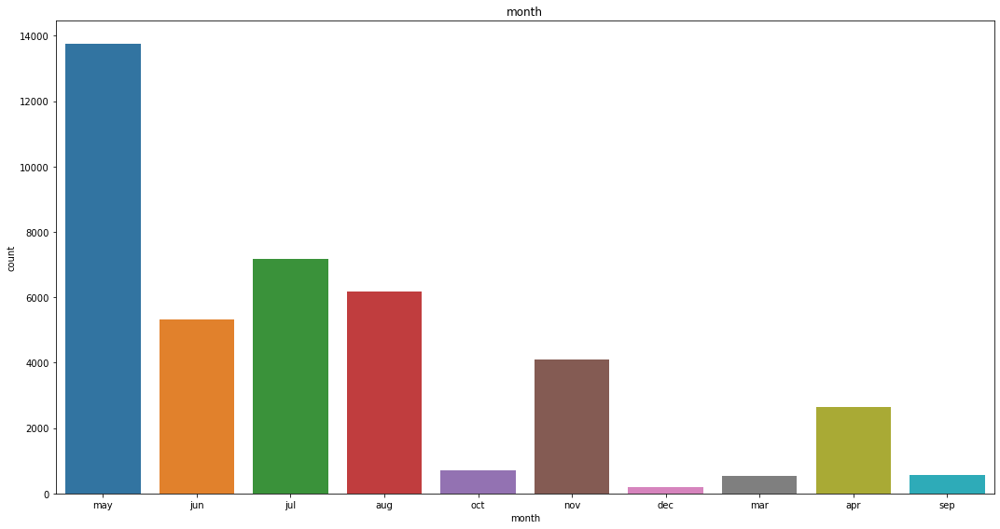

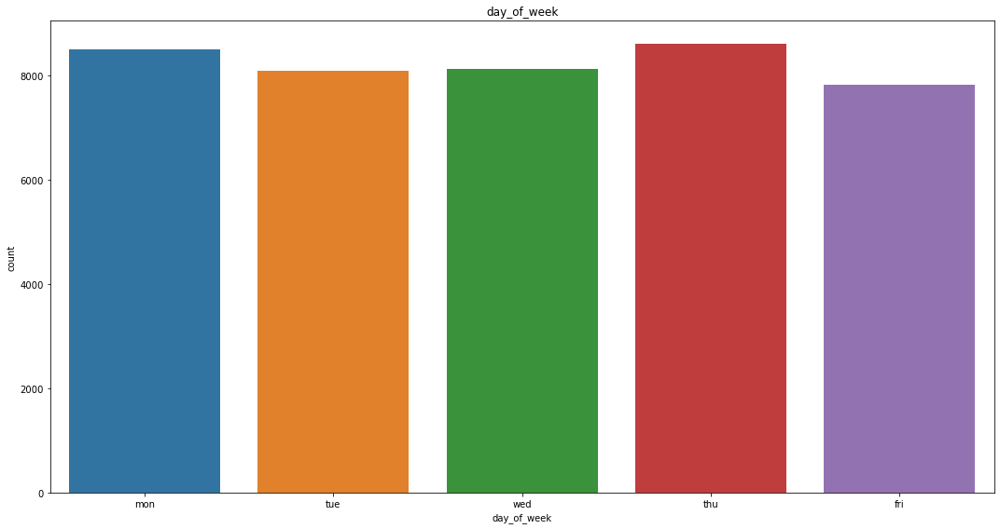

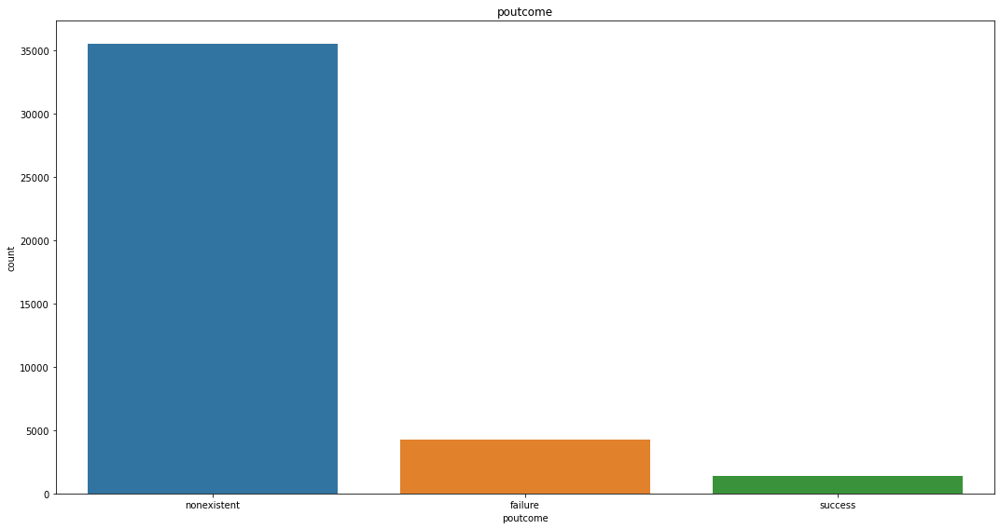

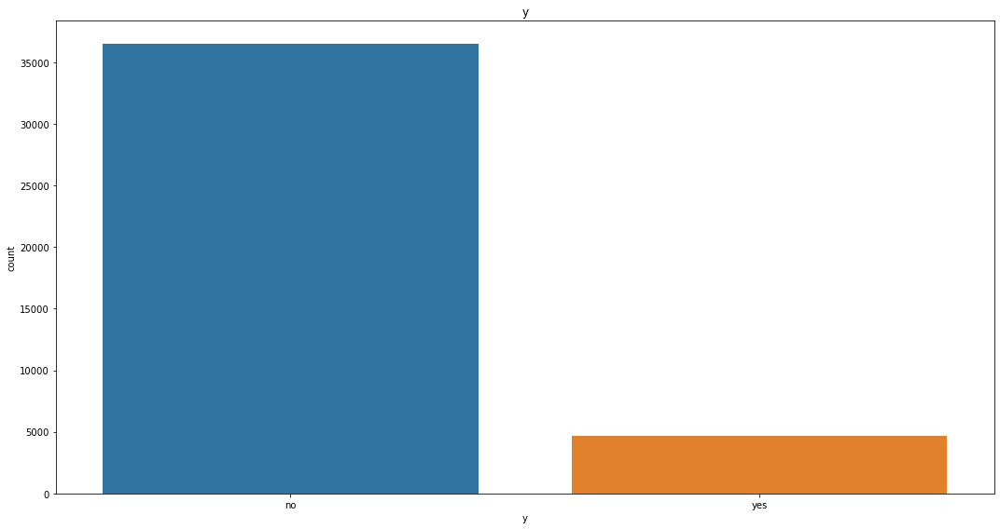

In [12]:
for i in categorical_variables:
    plt.title(i)
    sns.countplot(x=categorical_variables[i], data = categorical_variables)
    plt.tight_layout()
    plt.show()

### Inferences

>* Job Types:
'Blue-collar' and 'management' professions are the most common among clients. Tailoring campaigns to the needs and interests of these job types can increase engagement and response rates.

>* Marital Status:
Married clients dominate the dataset. Designing campaigns that cater to married individuals, such as family-oriented products or services, could enhance effectiveness and appeal.

>* Education Levels:
Most clients have a 'university.degree' or 'high.school' education. Incorporating educational content and emphasizing product benefits aligned with their background can resonate well with these clients.

>* Credit Stability:
The vast majority of clients do not have credit defaults, indicating financial stability. Marketing strategies should focus on investment opportunities or premium offerings appealing to financially stable individuals.

>* Preferred Contact Method:
The 'cellular' contact method is more prevalent and effective than 'telephone' contact. Prioritizing mobile outreach can enhance engagement and conversion rates.

>* Peak Contact Month:
May has the highest number of contacts, making it strategic for campaign launches. Concentrating marketing efforts in May can capitalize on increased customer responsiveness.

>* Day of the Week Effect:
Thursday sees the highest number of contacts, making it an optimal day for reaching out to clients. Scheduling key campaign activities on Thursdays can improve interaction and response rates.

>* New Client Engagement:
Most previous marketing outcomes are 'nonexistent', indicating many contacts are new clients. Developing strong initial engagement strategies is crucial for converting these first-time contacts into customers.

### These insights provide actionable strategies for improving marketing campaigns, targeting the right demographics, and optimizing engagement with clients.

# Bivariate Analysis

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 20 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  campaign        41188 non-null  int64  
 11  pdays           41188 non-null  int64  
 12  previous        41188 non-null  int64  
 13  poutcome        41188 non-null  object 
 14  emp.var.rate    41188 non-null  float64
 15  cons.price.idx  41188 non-null  float64
 16  cons.conf.idx   41188 non-null  float64
 17  euribor3m       41188 non-null 

In [14]:
df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,1,999,0,nonexistent,1.100000,93.994000,-36.400000,4.857000,5191.000000,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,1,999,0,nonexistent,1.100000,93.994000,-36.400000,4.857000,5191.000000,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,1,999,0,nonexistent,1.100000,93.994000,-36.400000,4.857000,5191.000000,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,1,999,0,nonexistent,1.100000,93.994000,-36.400000,4.857000,5191.000000,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,1,999,0,nonexistent,1.100000,93.994000,-36.400000,4.857000,5191.000000,no


# Categorical vs Categorical 

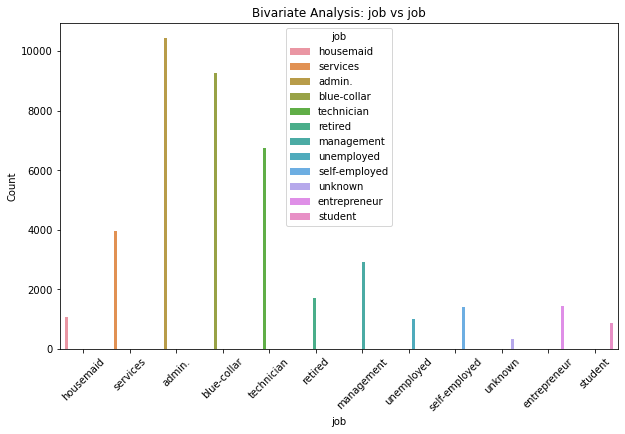

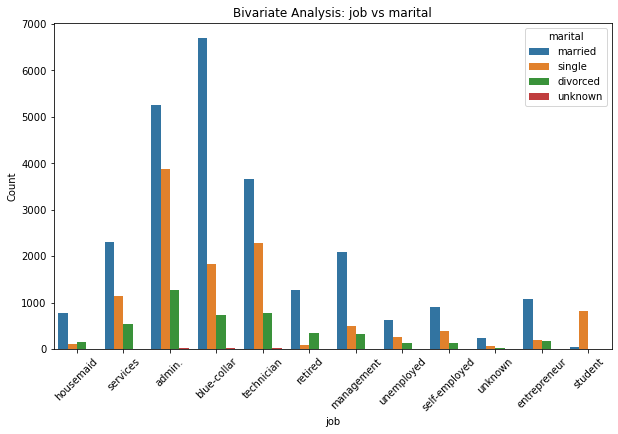

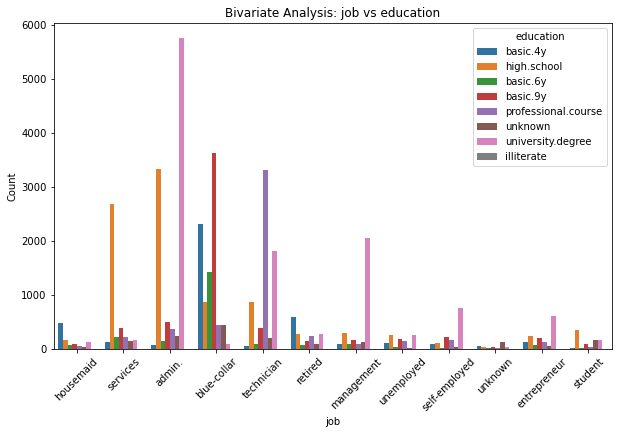

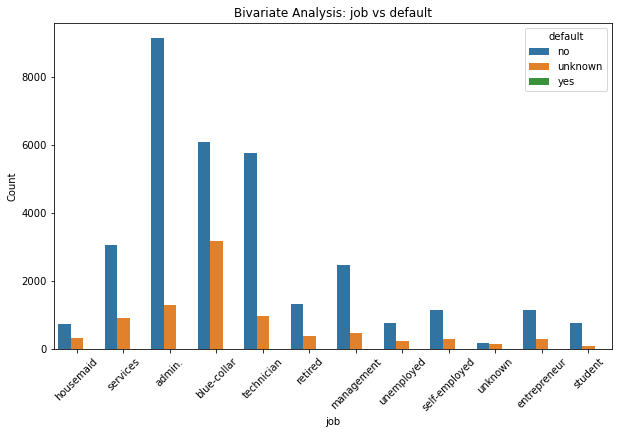

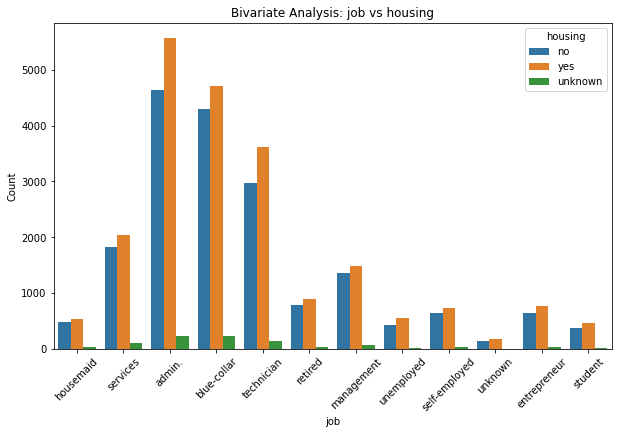

...

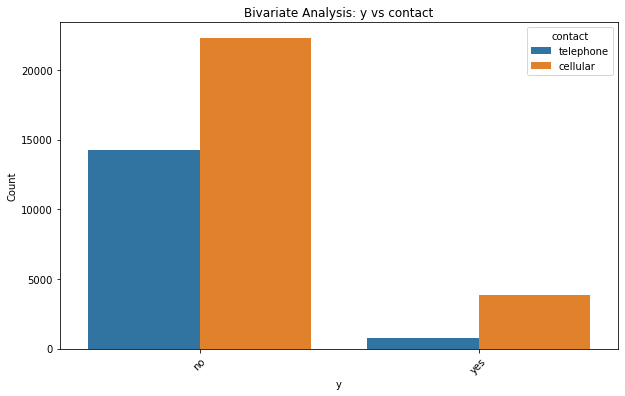

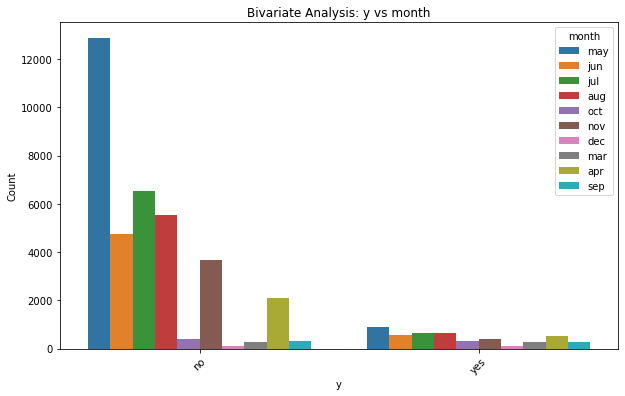

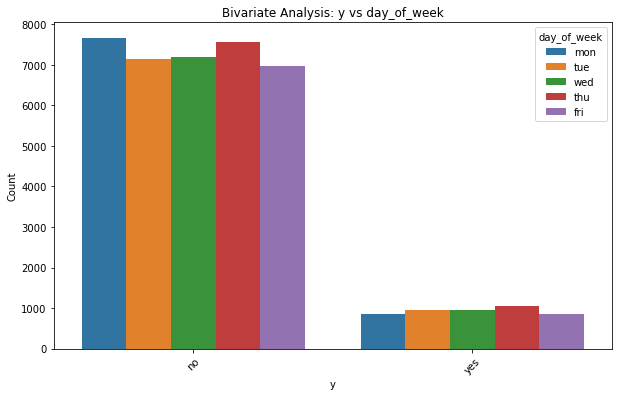

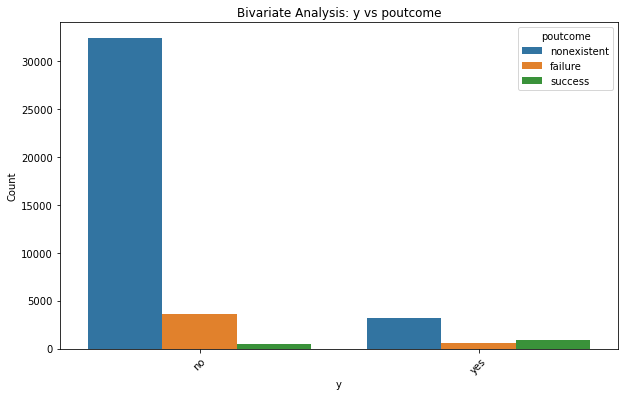

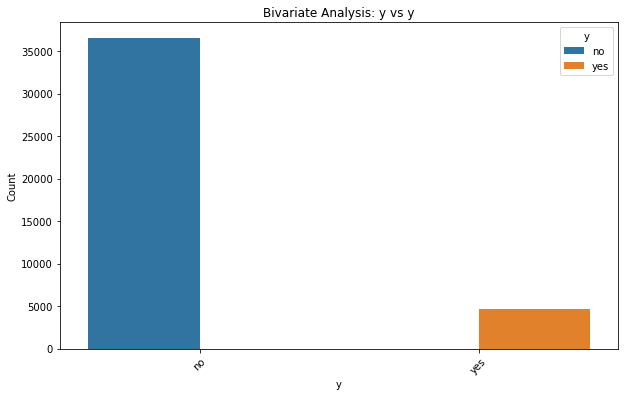

In [15]:
for i, col1 in enumerate(categorical_variables):
    for col2 in categorical_variables[i+1:]:
        plt.figure(figsize=(10, 6))
        sns.countplot(x=col1, hue=col2, data=df)
        plt.title(f'Bivariate Analysis: {col1} vs {col2}')
        plt.xlabel(col1)
        plt.ylabel('Count')
        plt.xticks(rotation=45)
        plt.legend(title=col2)
        plt.show()

# Job vs marital (cat vs cat)

Text(0, 0.5, 'Total')

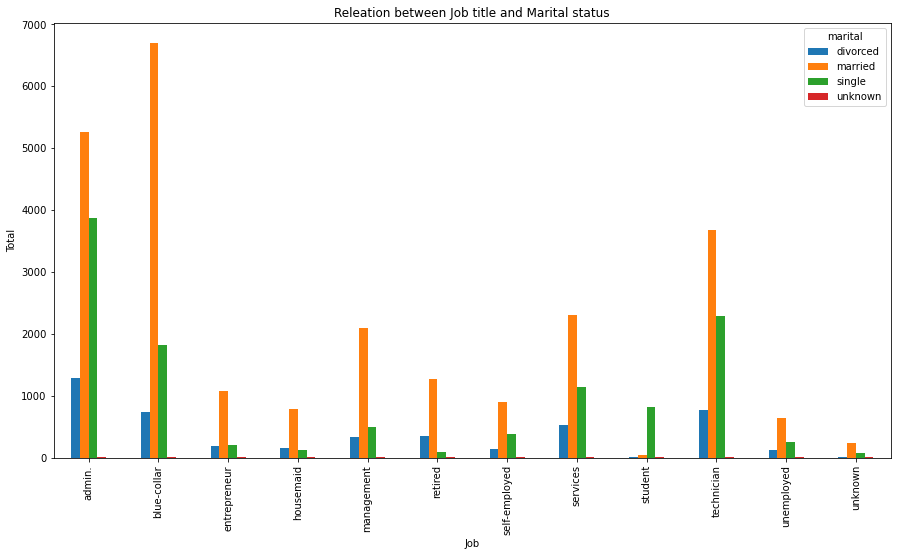

In [16]:
pd.crosstab(df['job'], df['marital']).plot(kind='bar')
plt.title('Releation between Job title and Marital status')
plt.xlabel('Job')
plt.ylabel('Total')

>* Married clients are prevalent across most job categories, especially 'blue-collar' and 'management'. 
>* Marketing strategies should consider the dual-income and family-oriented needs of married clients.


# Education vs loan(cat vs cat)

Text(0, 0.5, 'Total')

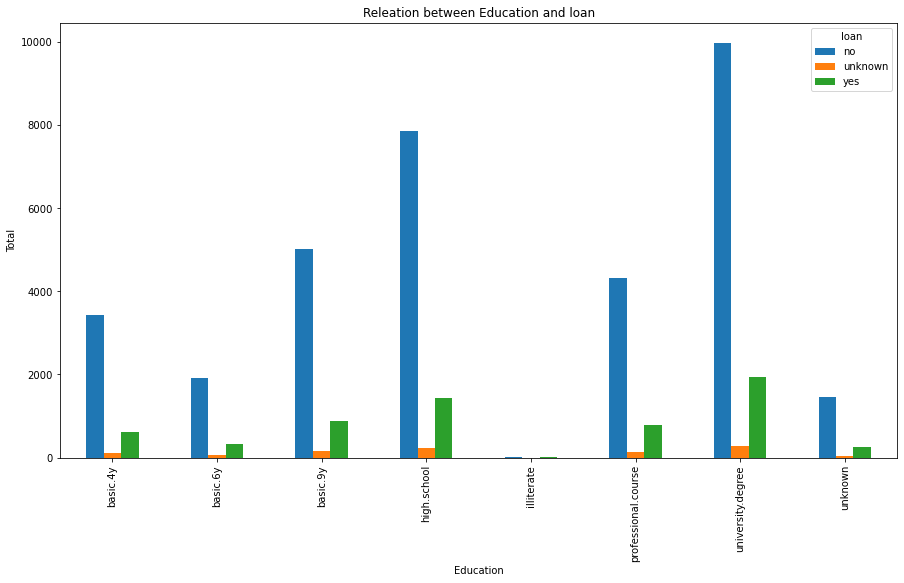

In [17]:
pd.crosstab(df['education'], df['loan']).plot(kind='bar')
plt.title('Releation between Education and loan')
plt.xlabel('Education')
plt.ylabel('Total')

>* Higher education levels correlate with fewer personal loans, suggesting financially prudent behaviors.
>* Financial products emphasizing savings and investments might appeal to educated clients.

# Month vs contact(cat vs cat)

Text(0, 0.5, 'Total')

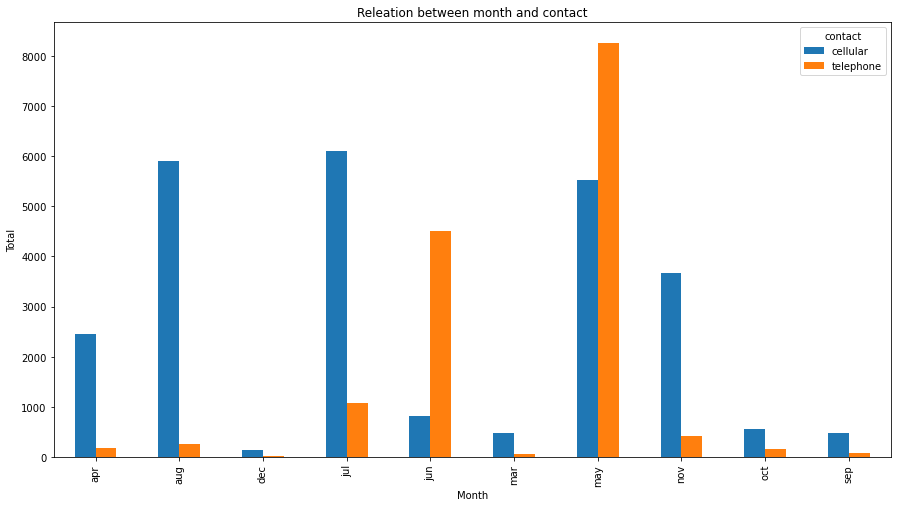

In [18]:
pd.crosstab(df['month'], df['contact']).plot(kind='bar')
plt.title('Releation between month and contact')
plt.xlabel('Month')
plt.ylabel('Total')

>* 'Cellular' contact is more effective than 'telephone' across all months. 
>* Prioritizing mobile outreach can improve campaign reach and effectiveness.

# Default vs housing(cat vs cat)

Text(0, 0.5, 'Total')

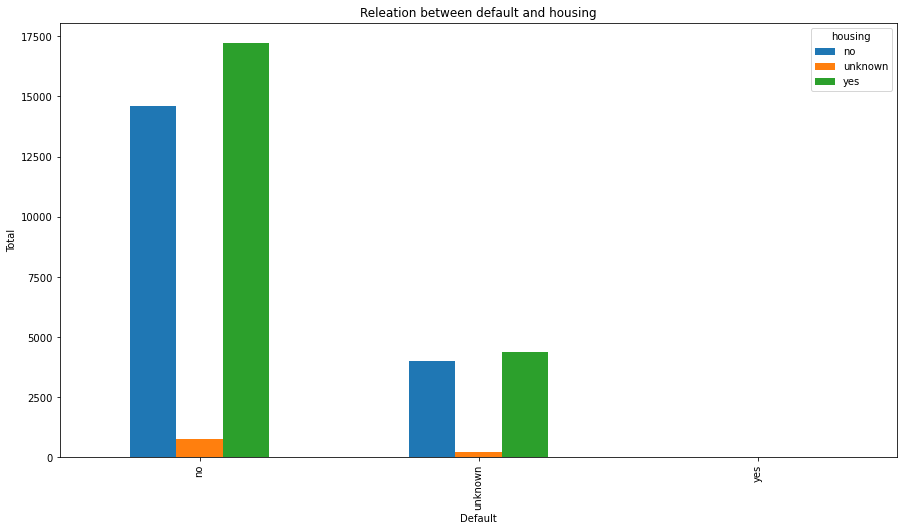

In [19]:
pd.crosstab(df['default'], df['housing']).plot(kind='bar')
plt.title('Releation between default and housing')
plt.xlabel('Default')
plt.ylabel('Total')

>* Clients without credit defaults are more likely to have housing loans, indicating financial stability. 
>* Targeting financially stable clients with mortgage products could be successful.


# poutcome vs month(cat vs cat)

Text(0, 0.5, 'Total')

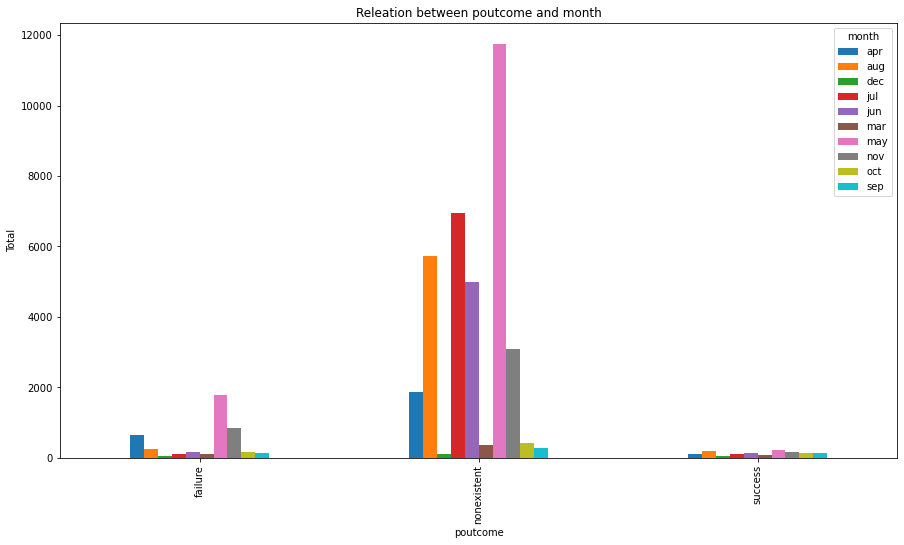

In [20]:
pd.crosstab(df['poutcome'], df['month']).plot(kind='bar')
plt.title('Releation between poutcome and month')
plt.xlabel('poutcome')
plt.ylabel('Total')

 >* Successful previous outcomes ('success') are rare, but targeting clients with a history of positive responses can improve current campaign results.

# Numerical vs categorical

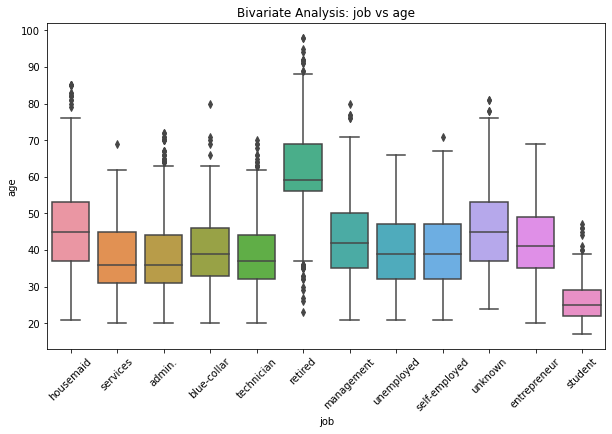

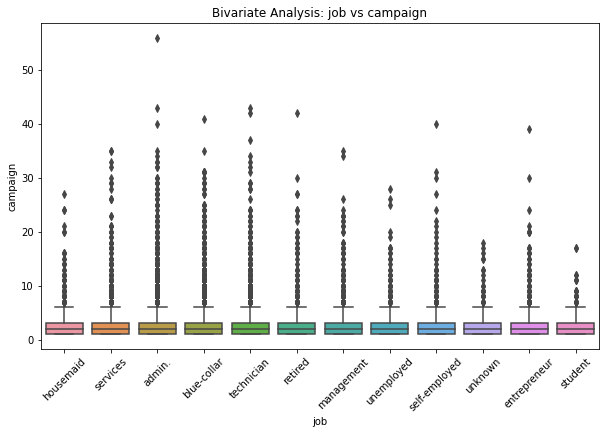

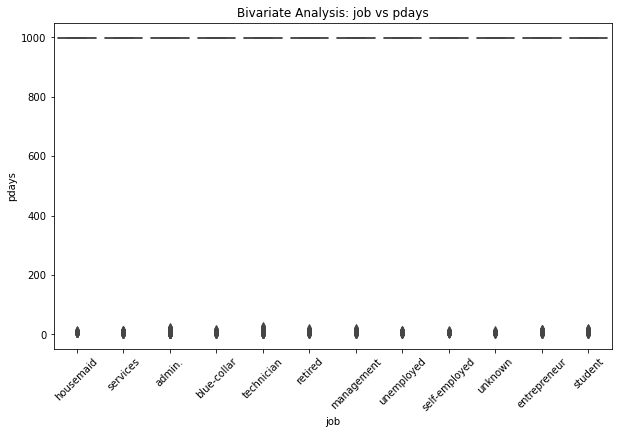

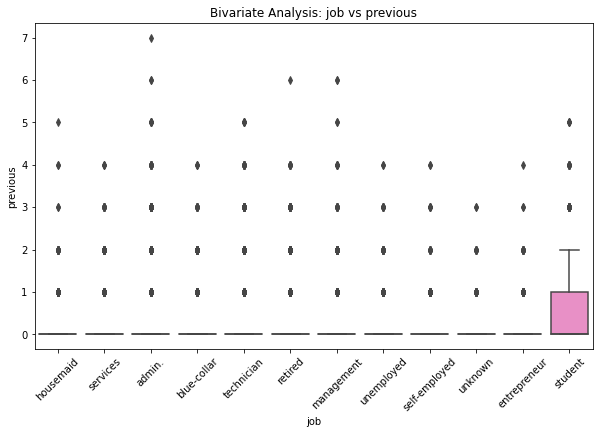

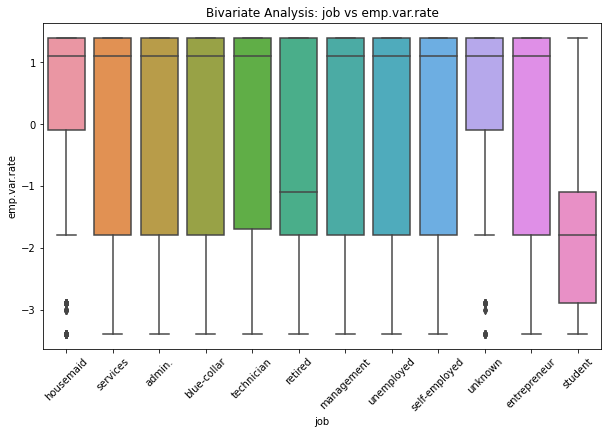

...

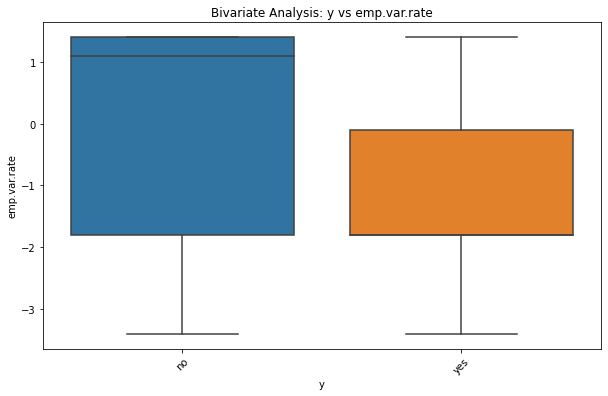

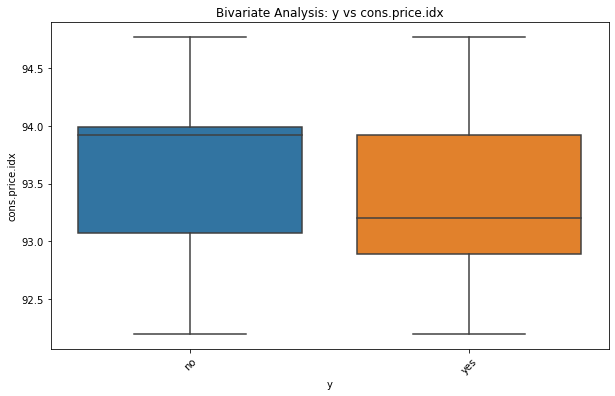

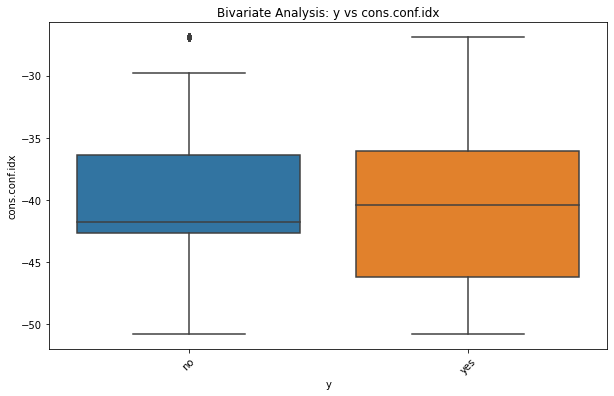

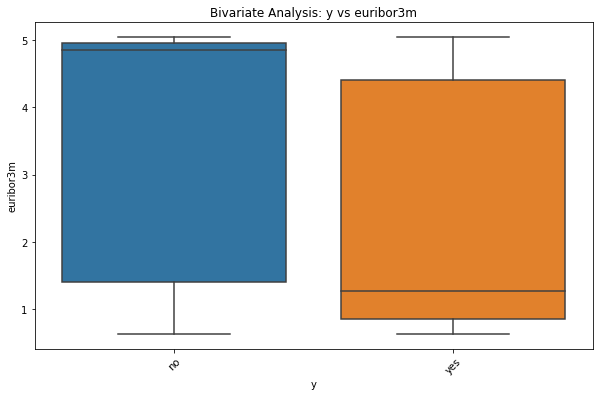

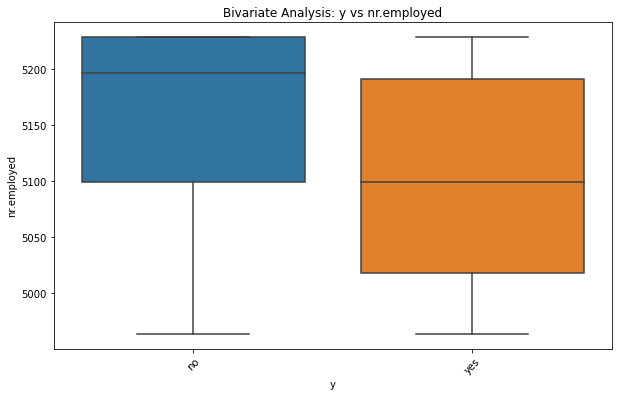

In [21]:
for cat_col in categorical_variables:
    for num_col in numerical_variables:
        plt.figure(figsize=(10, 6))
        sns.boxplot(x=cat_col, y=num_col, data=df)
        plt.title(f'Bivariate Analysis: {cat_col} vs {num_col}')
        plt.xlabel(cat_col)
        plt.ylabel(num_col)
        plt.xticks(rotation=45)
        plt.show()

# Age vs Job(num vs cat)

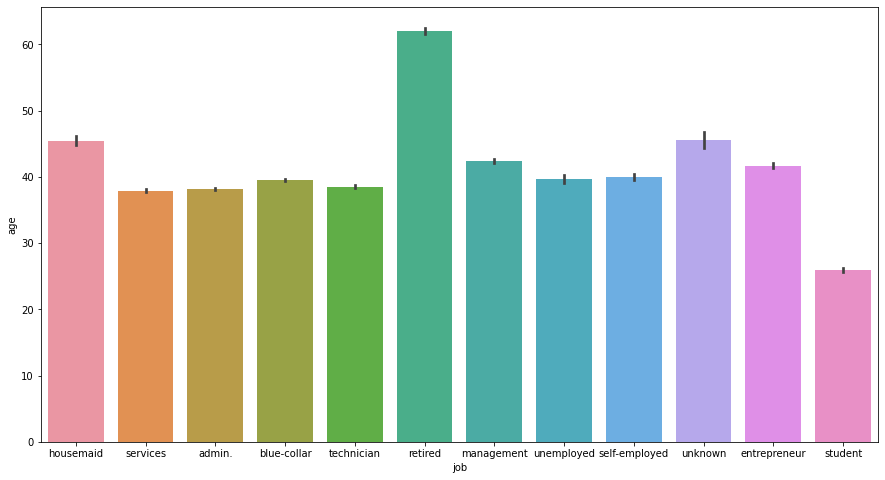

In [22]:
sns.barplot(x='job', y='age', data=df)
plt.show()

>* Older clients are often in 'management' or 'self-employed' roles, while younger clients are in 'student' or 'blue-collar' jobs. 
>* Tailoring messages to career stages can increase engagement.


# Campaign vs education( num vs cat)

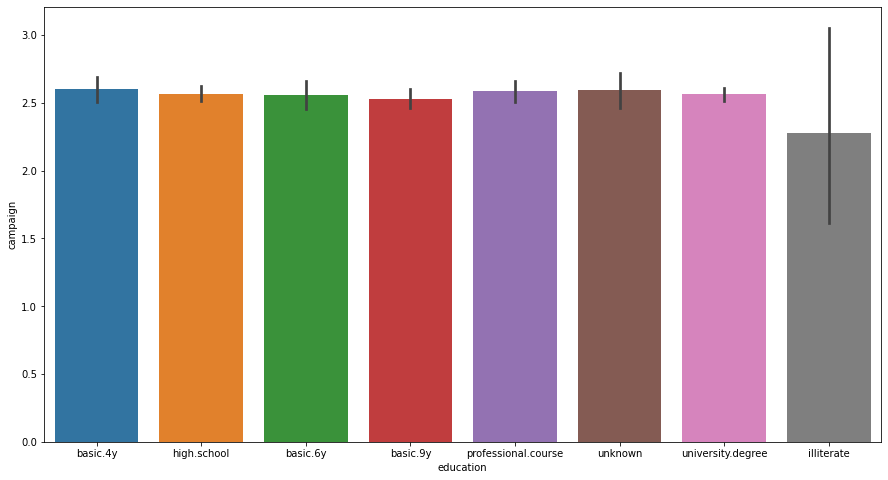

In [23]:
sns.barplot(x='education', y='campaign', data=df)
plt.show()

>* Higher education levels correspond to fewer required contacts for a positive response, indicating educated clients respond faster. 
>* Efficient communication strategies should be employed for educated clients.

# pdays vs housing(num vs cat)

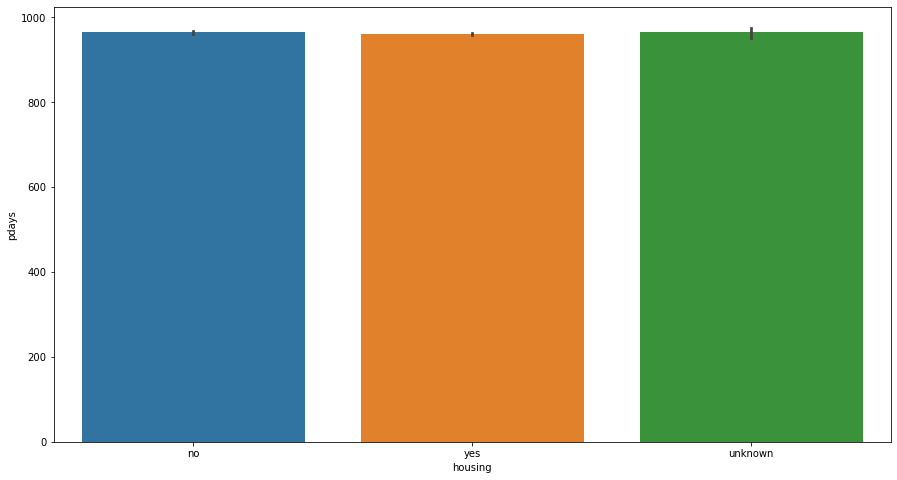

In [24]:
sns.barplot(x='housing', y='pdays', data=df)
plt.show()

>* Clients with housing loans have varying pdays values, indicating different recency of previous contacts.
>* Customizing follow-up frequency based on loan status can enhance engagement.

# Previous vs Contact(num vs cat)

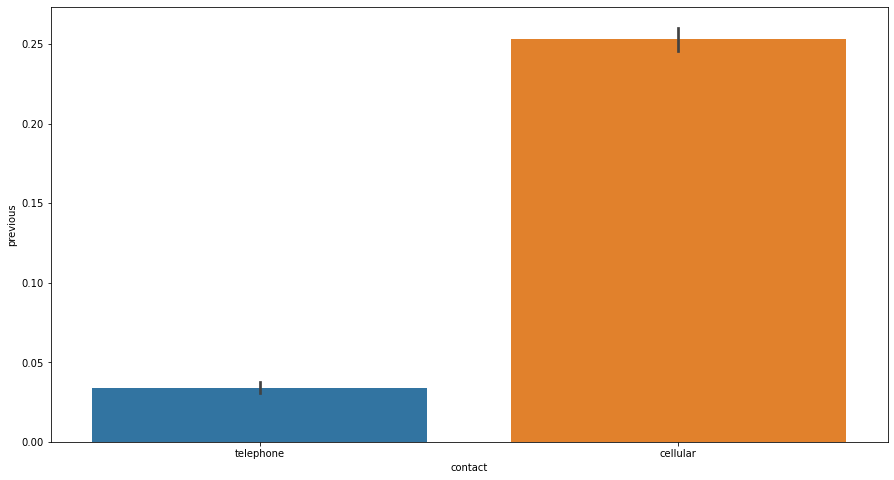

In [25]:
sns.barplot(x='contact', y='previous', data=df)
plt.show()

>* Clients contacted via 'cellular' show a wider range of previous contacts. 
>* Leveraging mobile contacts can expand reach and effectiveness.

# Numerical vs Numerical 

In [26]:
# Correlation Matrix to see all the correlation coefficient

df.select_dtypes(np.number).corr()

,age,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
age,1.000000,0.004594,-0.034369,0.024365,-0.000371,0.000857,0.129372,0.010767,-0.017725
campaign,0.004594,1.000000,0.052584,-0.079141,0.150754,0.127836,-0.013733,0.135133,0.144095
pdays,-0.034369,0.052584,1.000000,-0.587514,0.271004,0.078889,-0.091342,0.296899,0.372605
previous,0.024365,-0.079141,-0.587514,1.000000,-0.420489,-0.203130,-0.050936,-0.454494,-0.501333
emp.var.rate,-0.000371,0.150754,0.271004,-0.420489,1.000000,0.775334,0.196041,0.972245,0.906970
cons.price.idx,0.000857,0.127836,0.078889,-0.203130,0.775334,1.000000,0.058986,0.688230,0.522034
cons.conf.idx,0.129372,-0.013733,-0.091342,-0.050936,0.196041,0.058986,1.000000,0.277686,0.100513
euribor3m,0.010767,0.135133,0.296899,-0.454494,0.972245,0.688230,0.277686,1.000000,0.945154
nr.employed,-0.017725,0.144095,0.372605,-0.501333,0.906970,0.522034,0.100513,0.945154,1.000000


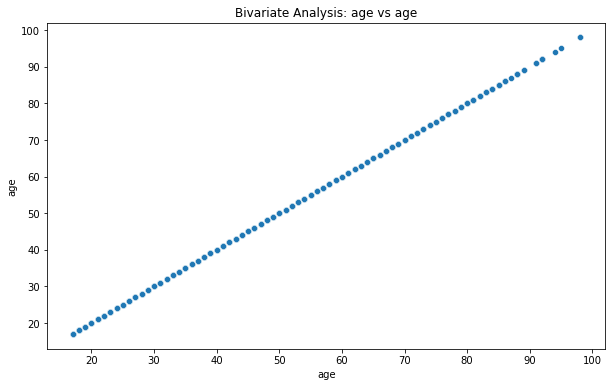

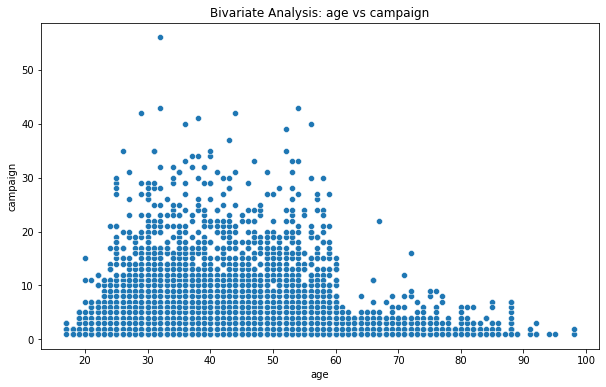

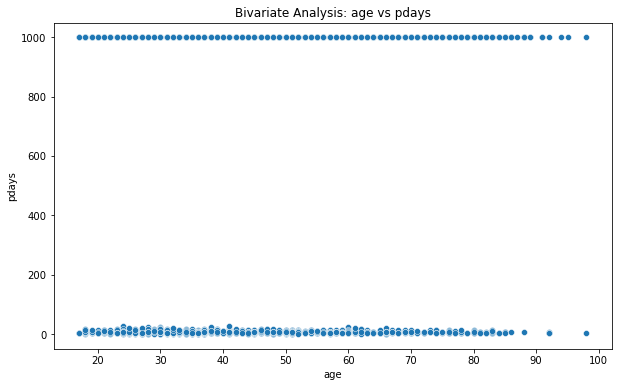

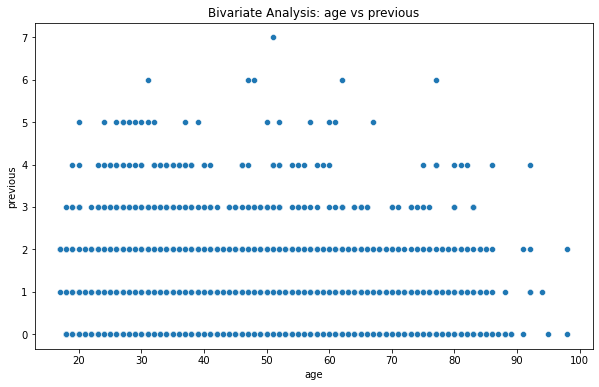

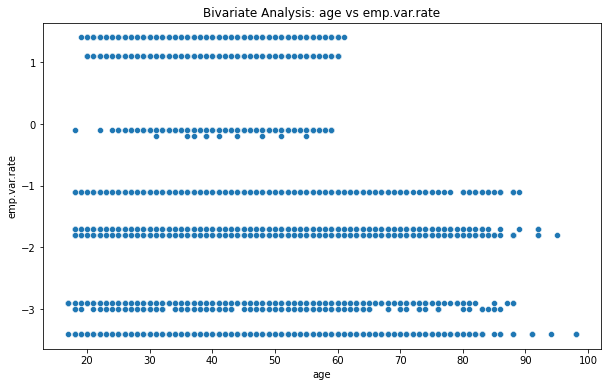

...

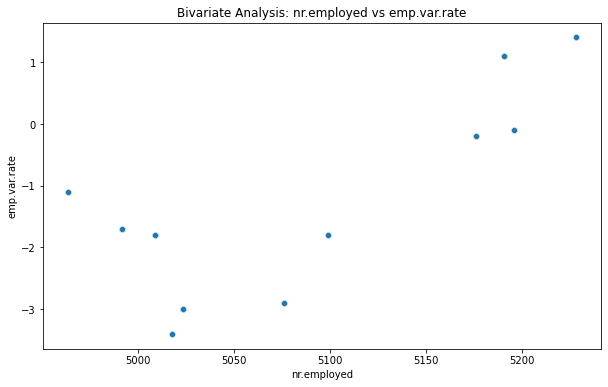

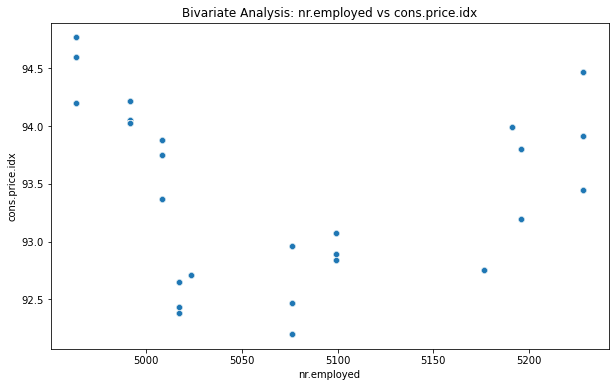

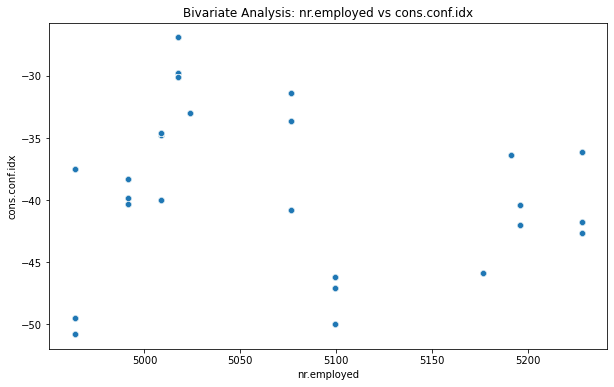

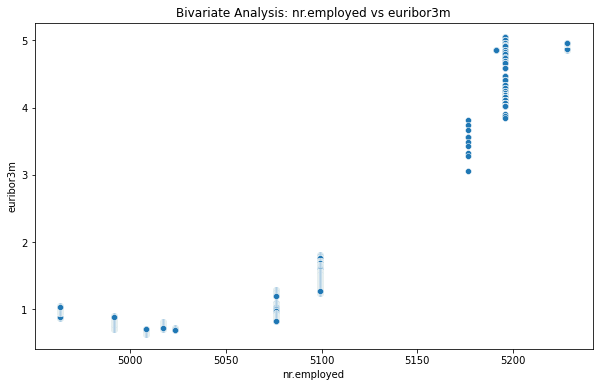

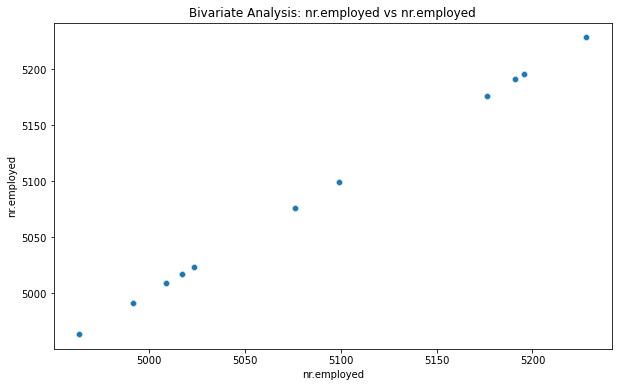

In [27]:
for i, num_col1 in enumerate(numerical_variables):
    for num_col2 in numerical_variables[i+1:]:
        plt.figure(figsize=(10, 6))
        sns.scatterplot(x=num_col1, y=num_col2, data=df)
        plt.title(f'Bivariate Analysis: {num_col1} vs {num_col2}')
        plt.xlabel(num_col1)
        plt.ylabel(num_col2)
        plt.show()

# Age vs campaign(num vs num)

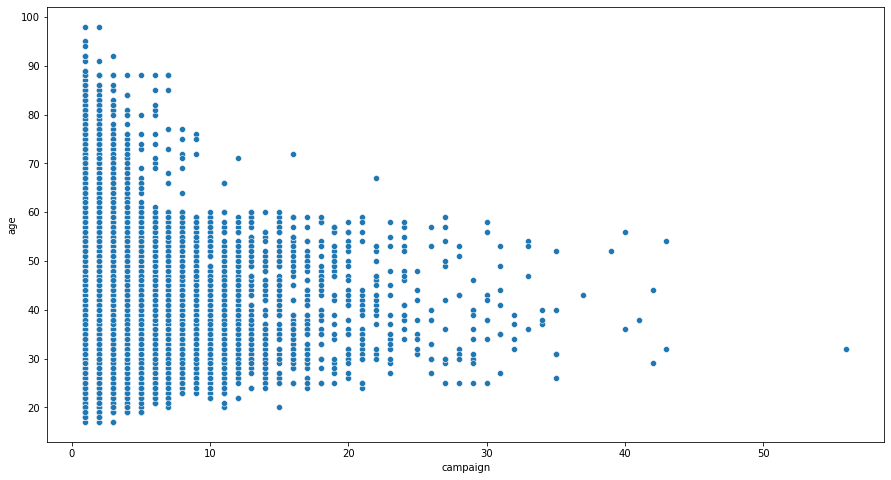

In [28]:
sns.scatterplot(x='campaign', y='age', data=df)
plt.show()

>* Older clients generally required fewer campaign contacts to respond positively, suggesting that targeting older demographics with more concise campaigns can improve efficiency and outcomes.

# Categorical columns vs Target Variable

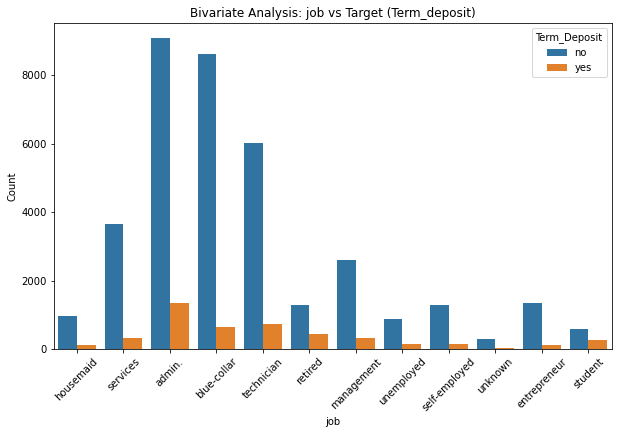

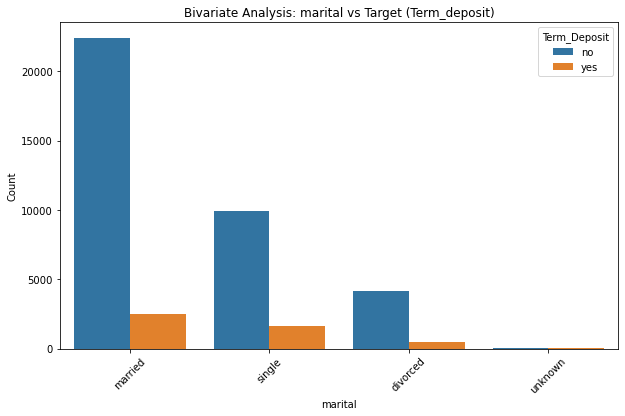

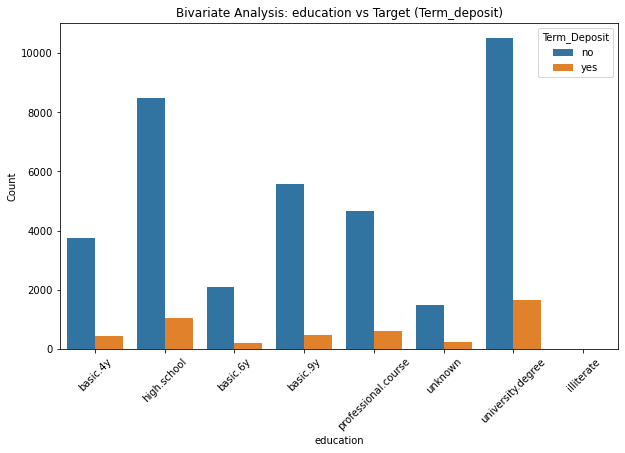

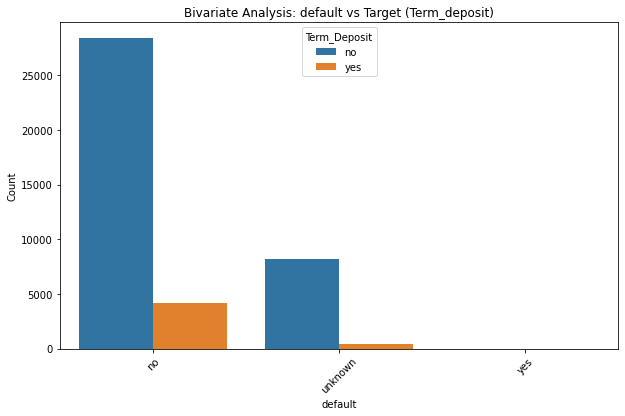

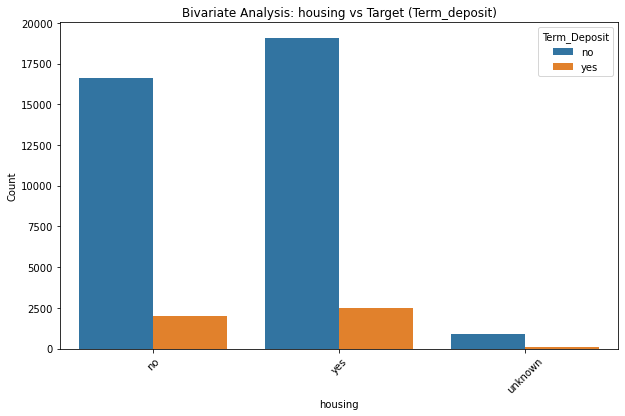

...

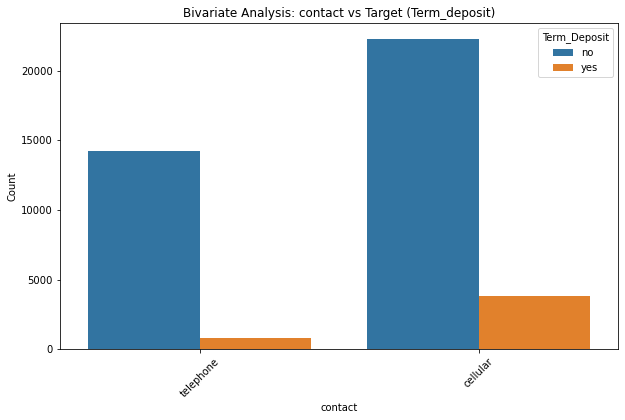

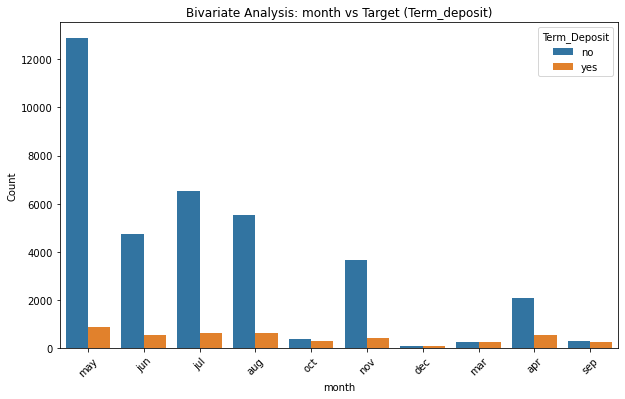

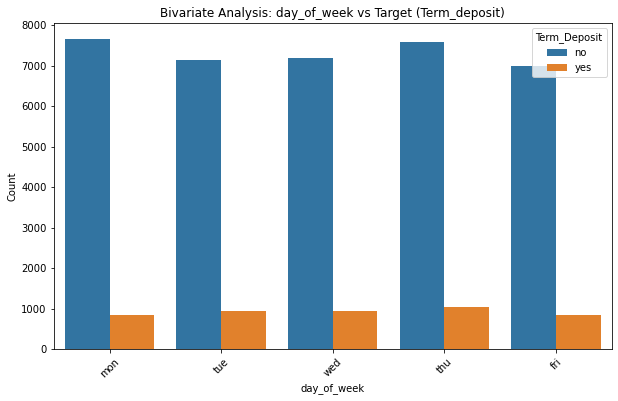

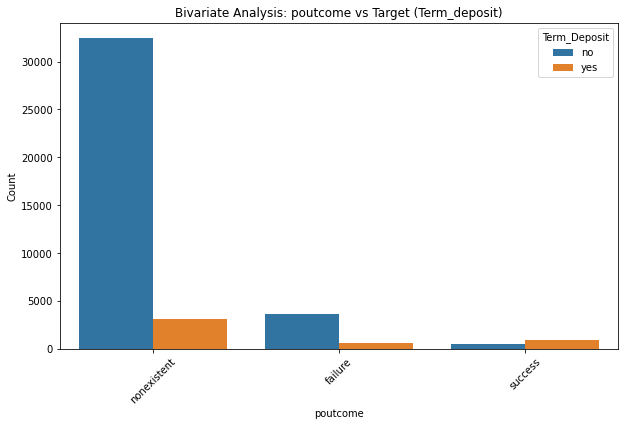

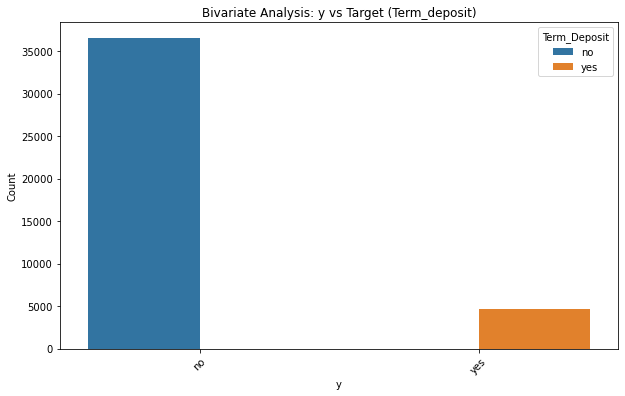

In [29]:
for cat_col in categorical_variables:
    plt.figure(figsize=(10, 6))
    sns.countplot(x=cat_col, hue=df['y'], data=df)
    plt.title(f'Bivariate Analysis: {cat_col} vs Target (Term_deposit)')
    plt.xlabel(cat_col)
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Term_Deposit')
    plt.show()

# Job vs term_deposit(cat vs target)

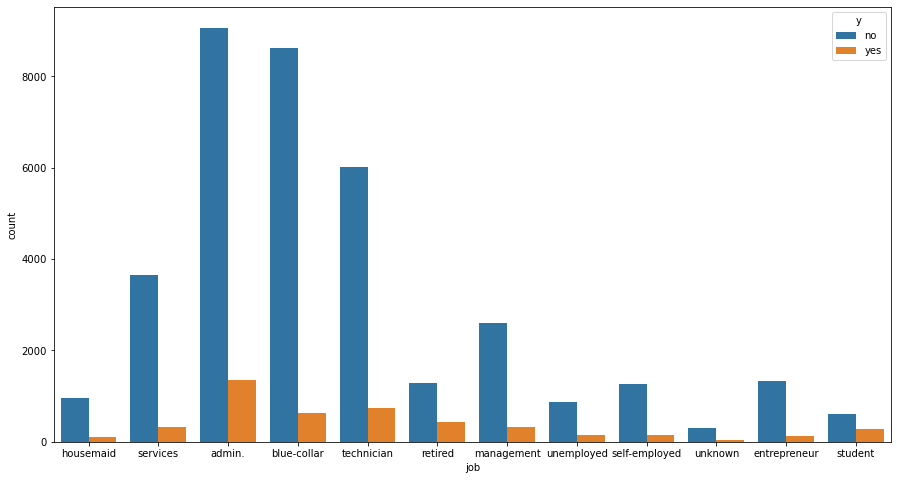

In [30]:
sns.countplot(x='job', hue=df['y'], data=df)
plt.show()

>* Clients in 'admin.' and 'blue-collar' jobs show higher 'no' responses, while 'admin' and 'technicians' clients have more 'yes' responses. 
>* Tailoring messages to address the specific concerns of 'admin.' and 'technicians' workers, while highlighting benefits relevant to 'blue-collar' and 'retired' clients, can optimize campaign success.

# Marital vs term_deposit(cat vs target)

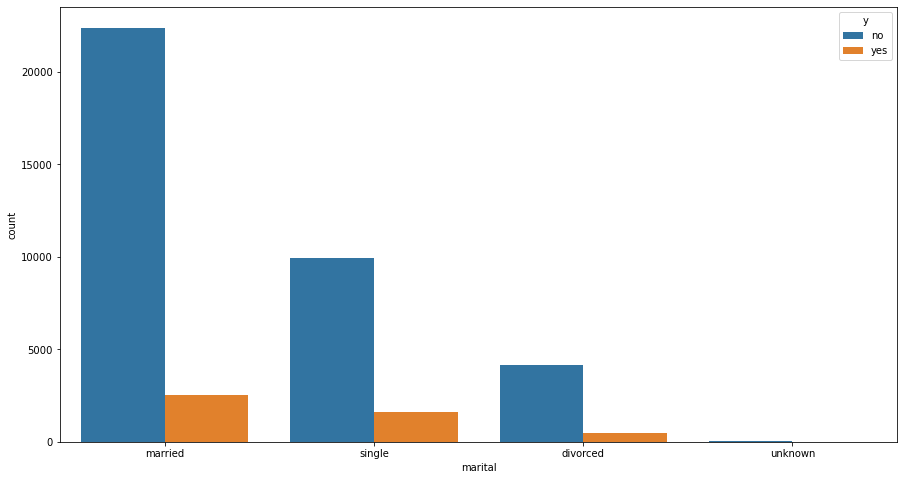

In [31]:
sns.countplot(x='marital', hue=df['y'], data=df)
plt.show()

>* Married clients have a higher number of 'no' responses, whereas single clients have a relatively higher proportion of 'yes' responses. 
>* Campaigns designed to appeal to single clients’ needs and lifestyles might achieve better results.

# Education vs Term_deposit(cat vs Target)

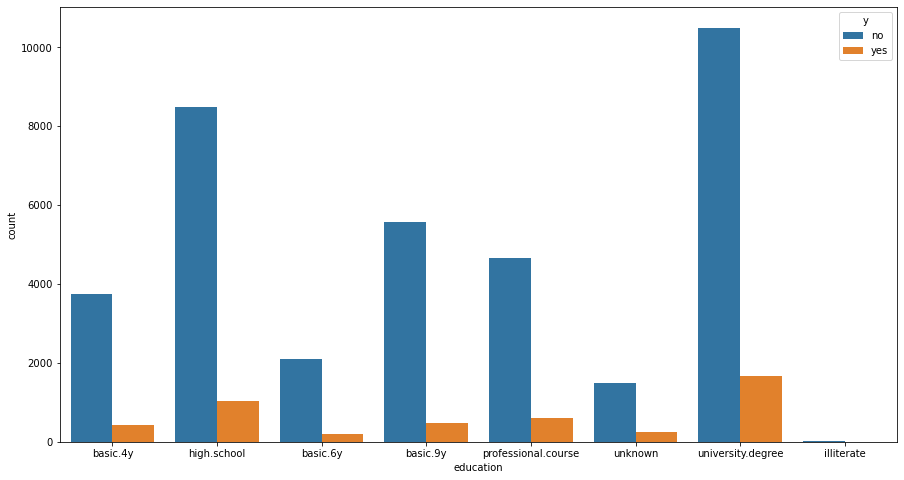

In [32]:
sns.countplot(x='education', hue=df['y'], data=df)
plt.show()

>* Clients with a 'university.degree' show more 'yes' responses compared to those with only 'basic.4y' education.
>*  Marketing efforts should emphasize educational and professional development benefits to attract this more responsive segment.

# Housing vs Term_deposit(cat vs target)

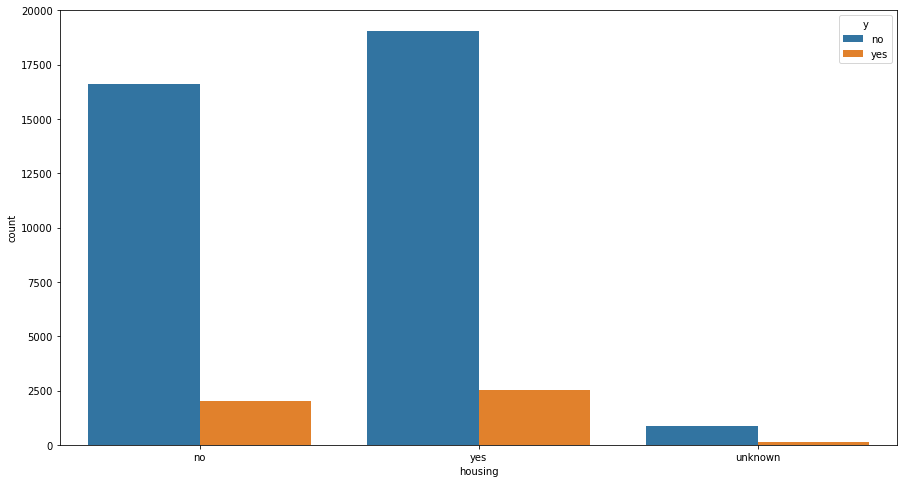

In [33]:
sns.countplot(x='housing', hue=df['y'], data=df)
plt.show()

>* Clients with housing loans have a higher proportion of 'yes' responses compared to those without housing loans. 
>* Highlighting the financial flexibility and advantages of term deposits to clients without existing housing loans can improve conversion rates.

# poutcome vs term_deposit(cat vs target)

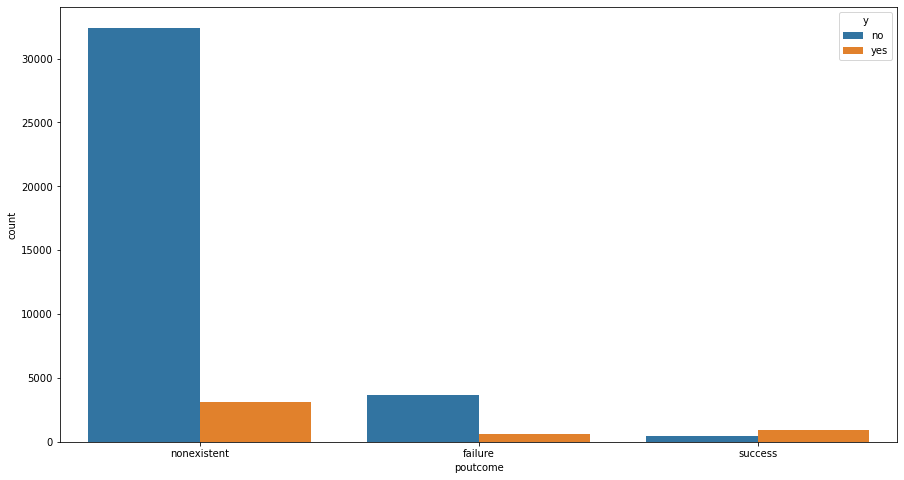

In [34]:
sns.countplot(x='poutcome', hue=df['y'], data=df)
plt.show()

>* Clients with previous non-existent outcomes have significantly higher 'yes' responses, demonstrating the effectiveness of prior campaigns.
>* Focusing on these clients with personalized follow-up offers can capitalize on past successes.

# Numerical vs Target (term_deposit)

# Age vs Term_deposit(num vs target)

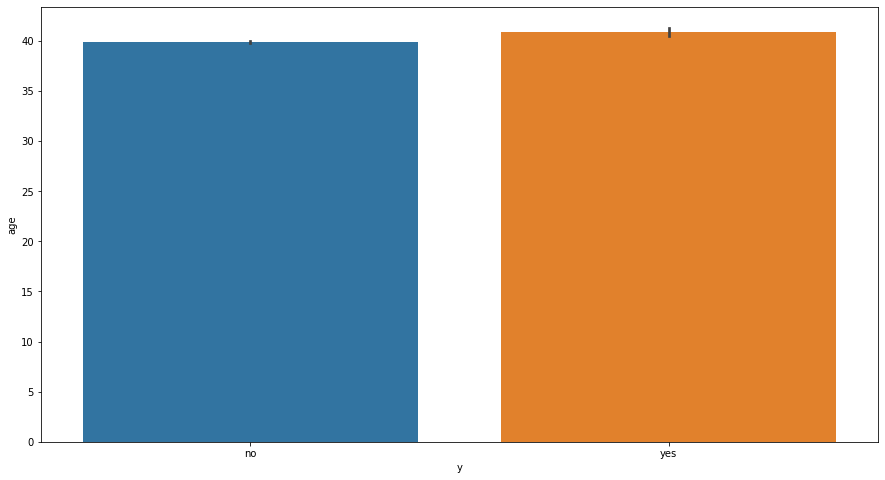

In [35]:
sns.barplot(x='y', y='age', data=df)
plt.show()

>* Younger clients are less likely to subscribe to term deposits compared to older clients. 
>* Targeting marketing strategies towards older demographics, who show higher interest, can increase subscription rates.

# campaign vs term_deposit(num vs target) 

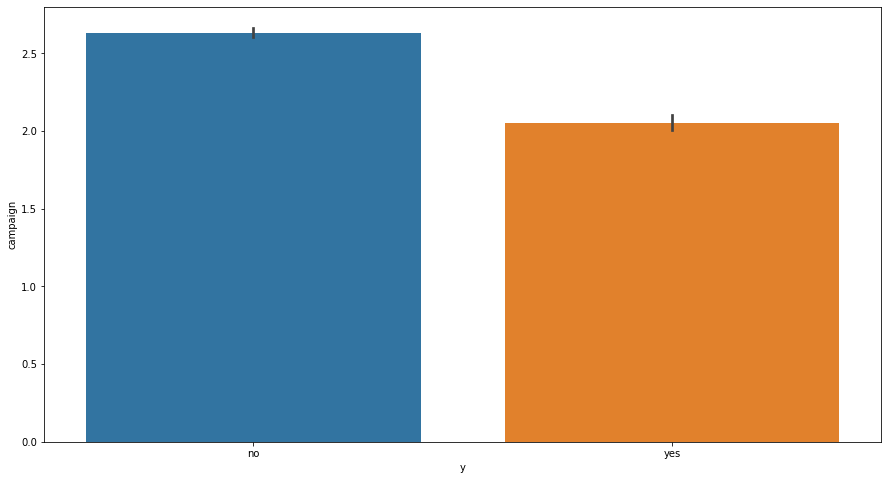

In [36]:
sns.barplot(x='y', y='campaign', data=df)
plt.show()

>* Clients who subscribed to term deposits required fewer campaign contacts, indicating that effective messaging early in the campaign can lead to higher conversions. 
>* Prioritizing quality over quantity in contacts can enhance campaign efficiency. 

# pdays vs Term_deposit(num vs target)

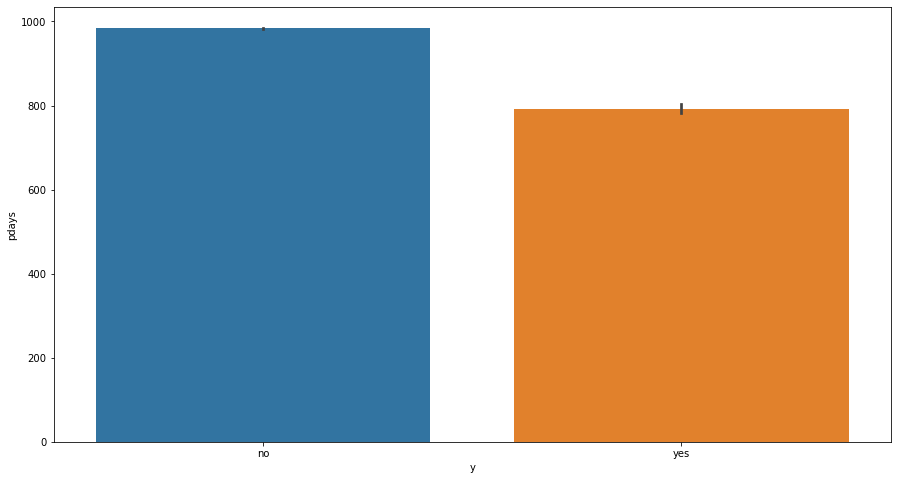

In [37]:
sns.barplot(x='y', y='pdays', data=df)
plt.show()

>* Clients with no previous contact history (999 pdays) are less likely to subscribe.
>* Developing initial contact strategies that effectively engage new clients can improve conversion rates for first-time contacts.

# previous contacts vs term_deposit(num vs target)

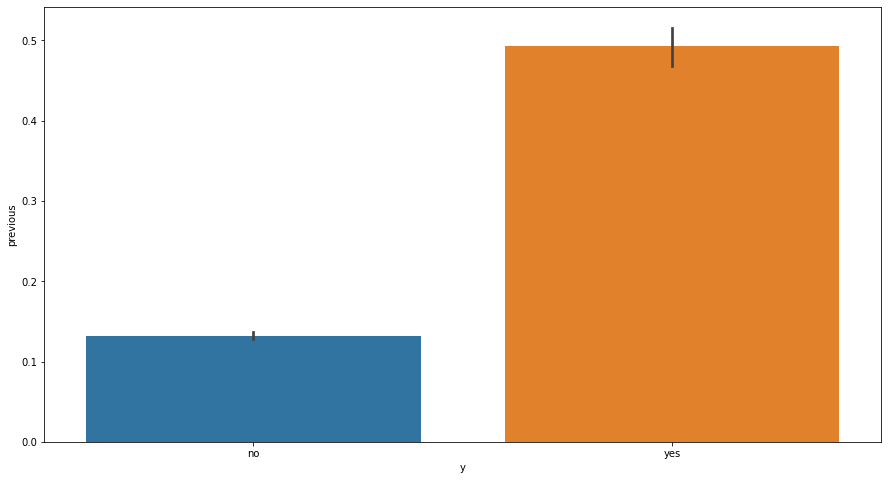

In [38]:
sns.barplot(x='y', y='previous', data=df)
plt.show()

>* A higher number of previous contacts correlates with higher subscription rates.
>* Ensuring consistent and meaningful follow-up can boost conversion rates, especially for clients with prior interactions.


# Multivariate Analysis

# Grouped Bar Plot ( Numeric vs Categoric vs Target)

In [39]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 20 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  campaign        41188 non-null  int64  
 11  pdays           41188 non-null  int64  
 12  previous        41188 non-null  int64  
 13  poutcome        41188 non-null  object 
 14  emp.var.rate    41188 non-null  float64
 15  cons.price.idx  41188 non-null  float64
 16  cons.conf.idx   41188 non-null  float64
 17  euribor3m       41188 non-null 

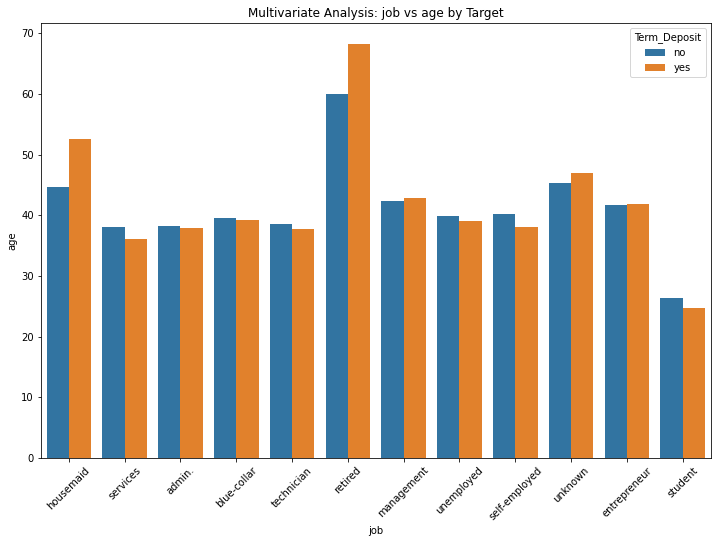

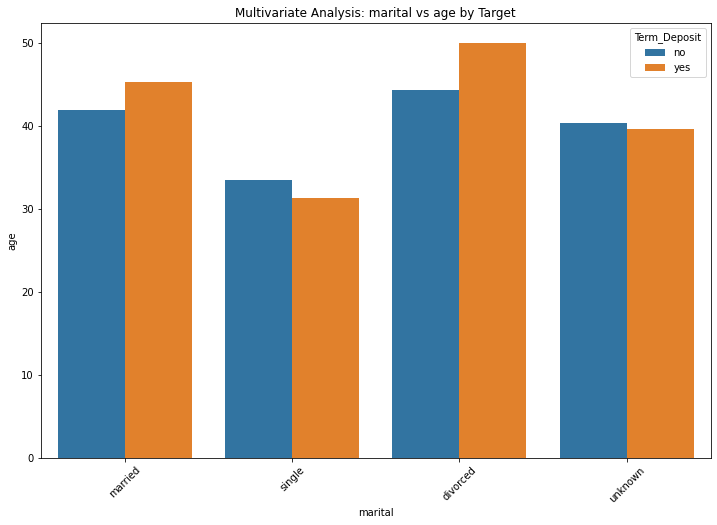

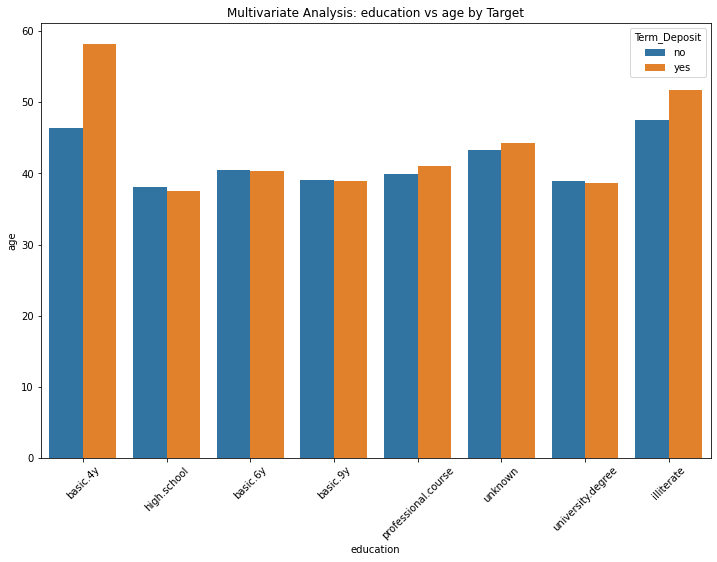

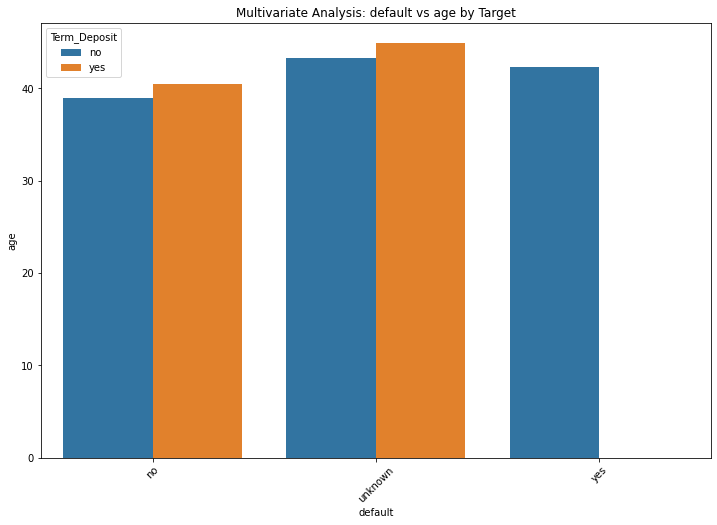

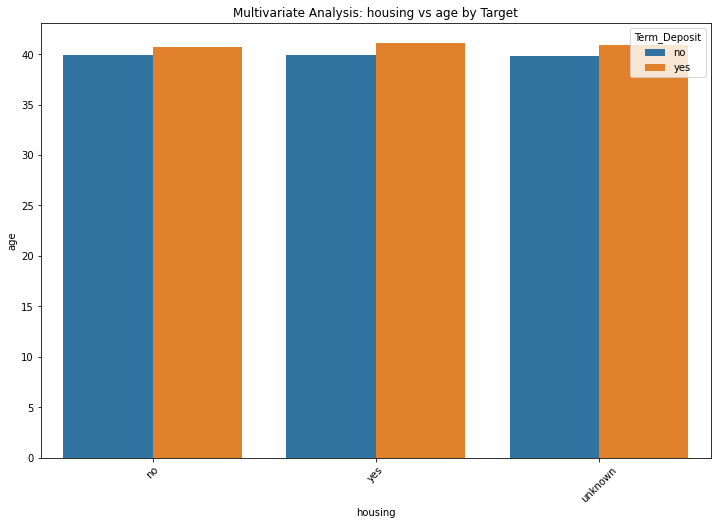

...

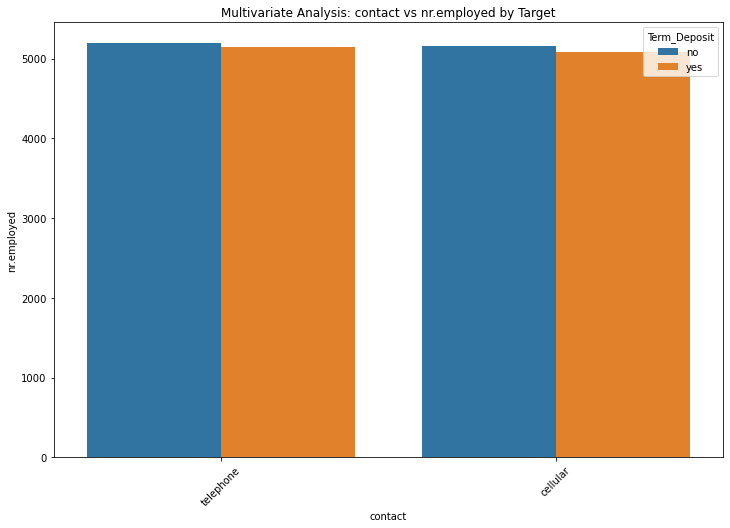

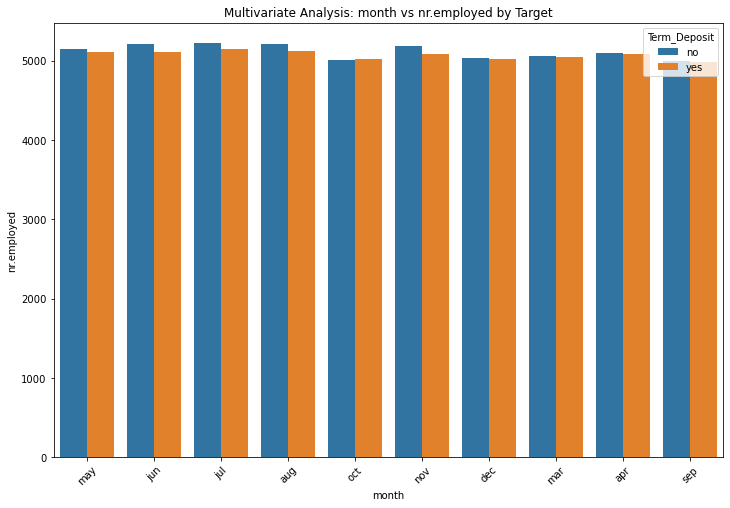

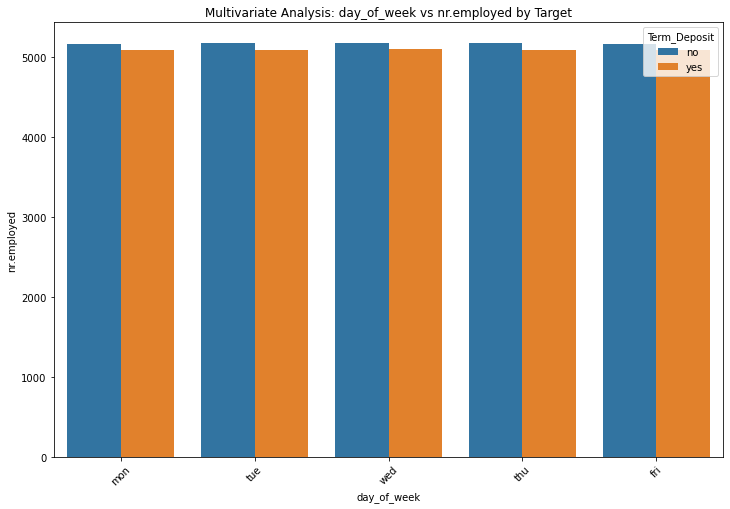

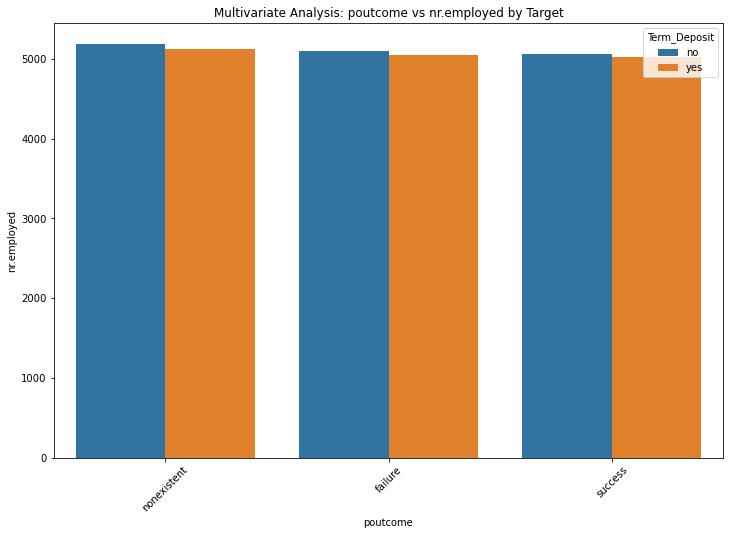

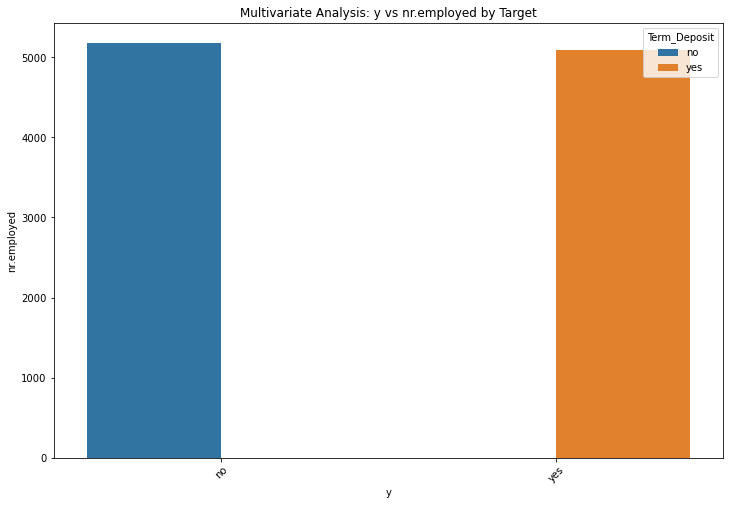

In [40]:
for num_col in numerical_variables:
    for cat_col in categorical_variables:
        plt.figure(figsize=(12, 8))
        sns.barplot(x=cat_col, y=num_col, hue=df['y'], data=df, ci=None)
        plt.title(f'Multivariate Analysis: {cat_col} vs {num_col} by Target')
        plt.xlabel(cat_col)
        plt.ylabel(num_col)
        plt.xticks(rotation=45)
        plt.legend(title='Term_Deposit')
        plt.show()

# Job vs Age vs Target

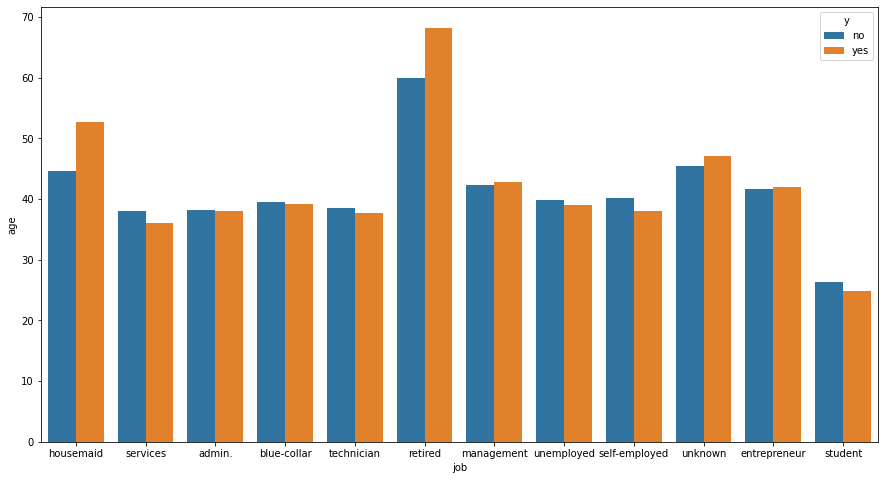

In [41]:
sns.barplot(x='job', y='age', hue=df['y'], data=df, ci=None)
plt.show()

>* 'Retired' and 'housemaid' clients, who tend to be older, have higher positive response rates. 
>* Focusing on these segments can increase campaign success.

# Martial vs campaign vs target

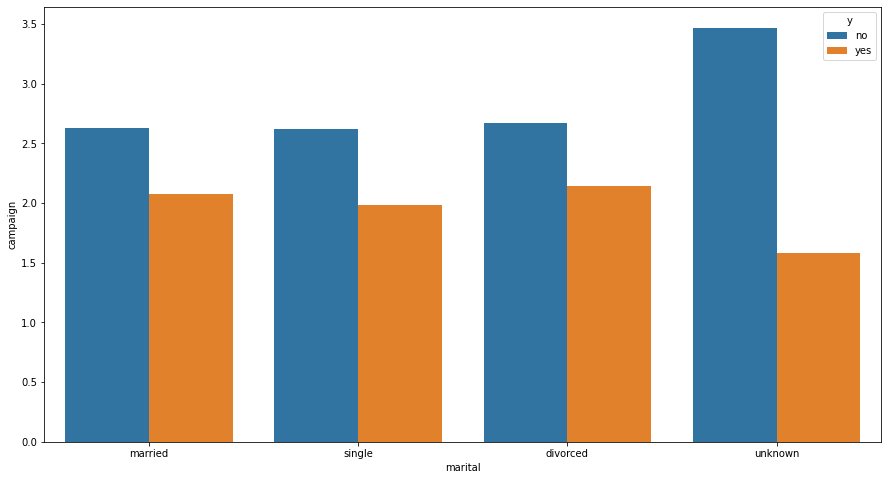

In [42]:
sns.barplot(x='marital', y='campaign', hue=df['y'], data=df, ci=None)
plt.show()

>* Single clients require fewer contacts for a positive response.
>*  Strategies targeting single clients could be more cost-effective.

# Education vs previous vs target

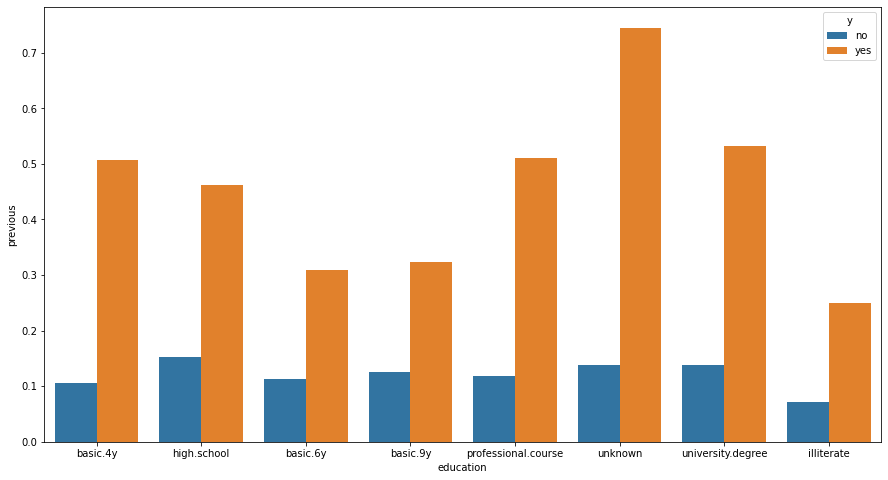

In [43]:
sns.barplot(x='education', y='previous', hue=df['y'], data=df, ci=None)
plt.show()

>* Clients with 'high school' show higher positive response rates and more previous contacts.
>*  Prior successful engagement strategies should be replicated for educated clients.

# Housing vs Pdays by Target:

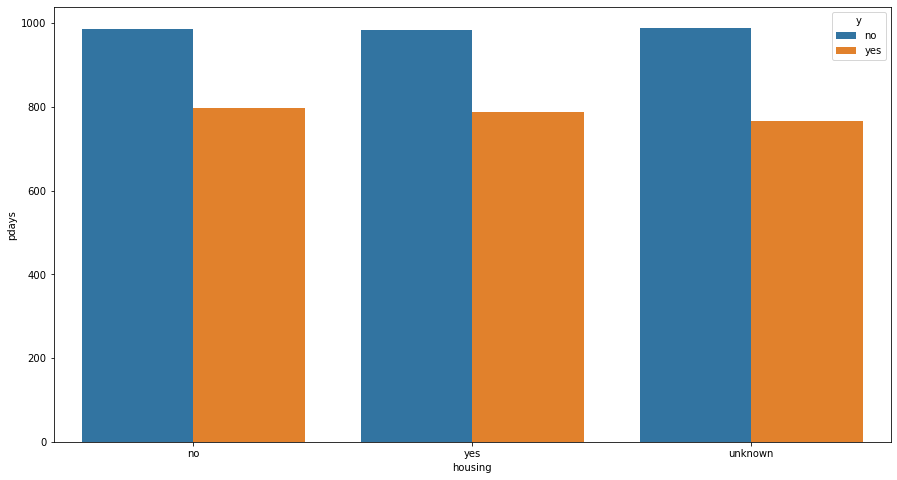

In [44]:
sns.barplot(x='housing', y='pdays', hue=df['y'], data=df, ci=None)
plt.show()

>* Clients with housing loans have higher positive responses and more recent contacts.
>* Targeting these clients shortly after their last contact can boost success.

# Correlation Matrix

In [45]:
df.select_dtypes(np.number).corr()

,age,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
age,1.000000,0.004594,-0.034369,0.024365,-0.000371,0.000857,0.129372,0.010767,-0.017725
campaign,0.004594,1.000000,0.052584,-0.079141,0.150754,0.127836,-0.013733,0.135133,0.144095
pdays,-0.034369,0.052584,1.000000,-0.587514,0.271004,0.078889,-0.091342,0.296899,0.372605
previous,0.024365,-0.079141,-0.587514,1.000000,-0.420489,-0.203130,-0.050936,-0.454494,-0.501333
emp.var.rate,-0.000371,0.150754,0.271004,-0.420489,1.000000,0.775334,0.196041,0.972245,0.906970
cons.price.idx,0.000857,0.127836,0.078889,-0.203130,0.775334,1.000000,0.058986,0.688230,0.522034
cons.conf.idx,0.129372,-0.013733,-0.091342,-0.050936,0.196041,0.058986,1.000000,0.277686,0.100513
euribor3m,0.010767,0.135133,0.296899,-0.454494,0.972245,0.688230,0.277686,1.000000,0.945154
nr.employed,-0.017725,0.144095,0.372605,-0.501333,0.906970,0.522034,0.100513,0.945154,1.000000


We also notice a few strong
negative and strong positive
correlations.

<AxesSubplot:>

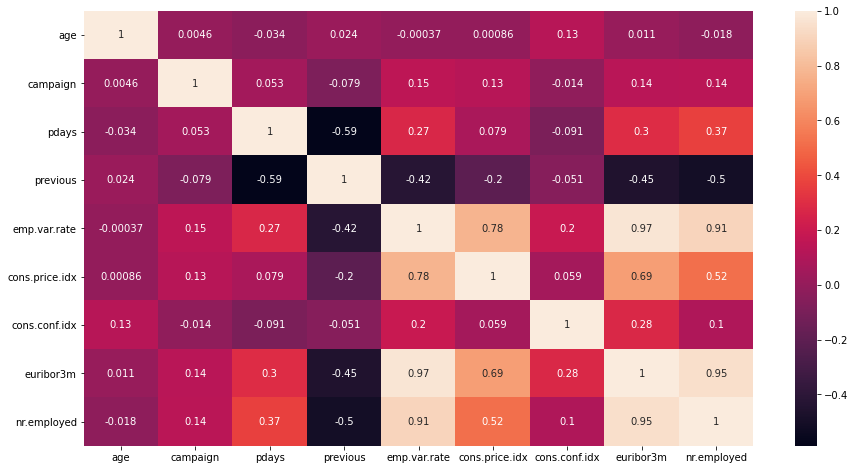

In [46]:
sns.heatmap(df.select_dtypes(np.number).corr(), annot= True)

>* From the heatmap we observed that emp.var.rate & euribor3m, nr.employed & emp.var.rate
emp.var.rate & cons.price.idx, euribor3m & nr.employed are highly correlated

# Step 2 - Pre-processing which includes identification of missing values, treatment of missing values,identification of errors, correction of the same

## Checking for Missing Values

In [47]:
df.isnull().sum()

age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
campaign          0
pdays             0
previous          0
poutcome          0
emp.var.rate      0
cons.price.idx    0
cons.conf.idx     0
euribor3m         0
nr.employed       0
y                 0
dtype: int64

>* We see that there are no null values in our dataset
>* But the search does not stop here as we've only cross-verified for our numeric columns
>* For the cateogorical columns, there are high chances of null values to be equivalent to 'unknown' so we shall convert 'unknown' to NA to finally count the total number of missing values in our categoric columns

In [48]:
df = df.replace(to_replace='unknown', value=np.nan)

df.isnull().sum() / len(df) *100

age               0.000000
job               0.801204
marital           0.194231
education         4.202680
default          20.872584
housing           2.403613
loan              2.403613
contact           0.000000
month             0.000000
day_of_week       0.000000
campaign          0.000000
pdays             0.000000
previous          0.000000
poutcome          0.000000
emp.var.rate      0.000000
cons.price.idx    0.000000
cons.conf.idx     0.000000
euribor3m         0.000000
nr.employed       0.000000
y                 0.000000
dtype: float64

>* We see that 6 columns (job,marital,education,housing,loan,default) have a considerate number of missing value percentage and hence we shall perform mode imputation to treat these variables

In [49]:
a=['job', 'marital', 'education', 'housing', 'loan', 'default']

for i in a:
    df[i]=df[i].replace(to_replace=np.nan, value=df[i].mode()[0])
    
df.isnull().sum()

age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
campaign          0
pdays             0
previous          0
poutcome          0
emp.var.rate      0
cons.price.idx    0
cons.conf.idx     0
euribor3m         0
nr.employed       0
y                 0
dtype: int64

>* We have now successfully treated the null values in our dataset

In [50]:
df['Term_Deposit']=df['y']
df['Term_Deposit'].value_counts(normalize = True)*100

no    88.734583
yes   11.265417
Name: Term_Deposit, dtype: float64

* Target is imbalanced 

In [51]:
df=df.drop('y', axis=1)

# Checking duplicates

In [52]:
df.duplicated().sum()

2109

In [53]:
df = df.drop_duplicates()

In [54]:
df.shape

(39079, 20)

# Pdays modification

>* Here We have numeric attribute named pdays means that number of days that passed by after the client was last contacted 
from a previous campaign (There are 999 and other numeric values inside of this column.
>* 999 means client was not previously contacted. 
>* We converted the ‘pdays’ column numeric to categorical 
which as two classes. 
>* If the value is equal to 999, we put the 0 instead of 999, otherwise we put 1. 
so we changed the pdays column 

In [55]:
df['pdays'] = [0 if i == 999 else 1 for i in df['pdays']]
df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,Term_Deposit
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,1,0,0,nonexistent,1.100000,93.994000,-36.400000,4.857000,5191.000000,no
1,57,services,married,high.school,no,no,no,telephone,may,mon,1,0,0,nonexistent,1.100000,93.994000,-36.400000,4.857000,5191.000000,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,1,0,0,nonexistent,1.100000,93.994000,-36.400000,4.857000,5191.000000,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,1,0,0,nonexistent,1.100000,93.994000,-36.400000,4.857000,5191.000000,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,1,0,0,nonexistent,1.100000,93.994000,-36.400000,4.857000,5191.000000,no


In [56]:
df.pdays.value_counts()

0    37565
1     1514
Name: pdays, dtype: int64

In [57]:
df['pdays']=df['pdays'].astype('object')

In [58]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 39079 entries, 0 to 41187
Data columns (total 20 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             39079 non-null  int64  
 1   job             39079 non-null  object 
 2   marital         39079 non-null  object 
 3   education       39079 non-null  object 
 4   default         39079 non-null  object 
 5   housing         39079 non-null  object 
 6   loan            39079 non-null  object 
 7   contact         39079 non-null  object 
 8   month           39079 non-null  object 
 9   day_of_week     39079 non-null  object 
 10  campaign        39079 non-null  int64  
 11  pdays           39079 non-null  object 
 12  previous        39079 non-null  int64  
 13  poutcome        39079 non-null  object 
 14  emp.var.rate    39079 non-null  float64
 15  cons.price.idx  39079 non-null  float64
 16  cons.conf.idx   39079 non-null  float64
 17  euribor3m       39079 non-null 

# If the value in the target variable is 'yes' then replace it with 1 else with 0

In [59]:
df['Term_Deposit_en'] = df['Term_Deposit'].map(lambda x: 1 if x=='yes' else 0)

In [60]:
df['Term_Deposit_en']=df['Term_Deposit_en'].astype('int64')

In [61]:
df_num = df.select_dtypes(np.number)

df_num.columns

Index(['age', 'campaign', 'previous', 'emp.var.rate', 'cons.price.idx',
       'cons.conf.idx', 'euribor3m', 'nr.employed', 'Term_Deposit_en'],
      dtype='object')

In [62]:
df_num=df_num.drop('Term_Deposit_en', axis=1)

In [63]:
df_cat = df.select_dtypes(['object','category'])

df_cat.columns

Index(['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact',
       'month', 'day_of_week', 'pdays', 'poutcome', 'Term_Deposit'],
      dtype='object')

In [64]:
df_cat=df_cat.drop('Term_Deposit', axis=1)

# Identification of errors

### Making the target Variable readable

In [65]:
df['Term_Deposit_en'].value_counts(normalize= True)* 100

0   88.241767
1   11.758233
Name: Term_Deposit_en, dtype: float64

>* Our target variable is highly imbalanced hence accuracy score would not be very reliant here
>* Hence, we shall look at the F1 score to derive inferences for the perfermance of the model

In [66]:
df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,Term_Deposit,Term_Deposit_en
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,1,0,0,nonexistent,1.100000,93.994000,-36.400000,4.857000,5191.000000,no,0
1,57,services,married,high.school,no,no,no,telephone,may,mon,1,0,0,nonexistent,1.100000,93.994000,-36.400000,4.857000,5191.000000,no,0
2,37,services,married,high.school,no,yes,no,telephone,may,mon,1,0,0,nonexistent,1.100000,93.994000,-36.400000,4.857000,5191.000000,no,0
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,1,0,0,nonexistent,1.100000,93.994000,-36.400000,4.857000,5191.000000,no,0
4,56,services,married,high.school,no,no,yes,telephone,may,mon,1,0,0,nonexistent,1.100000,93.994000,-36.400000,4.857000,5191.000000,no,0


# Step 3 - Finding out the distribution of every numeric variable and identify what kind of transformation techniques needs to be used, finding out the level distribution of each categorical variable and understand how same needs to be corrected if required

Skewness of each column is as follows :  
 age                0.773057
campaign           4.680198
previous           3.752162
emp.var.rate      -0.698537
cons.price.idx    -0.229963
cons.conf.idx      0.313303
euribor3m         -0.678770
nr.employed       -1.019163
Term_Deposit_en    2.374524
dtype: float64


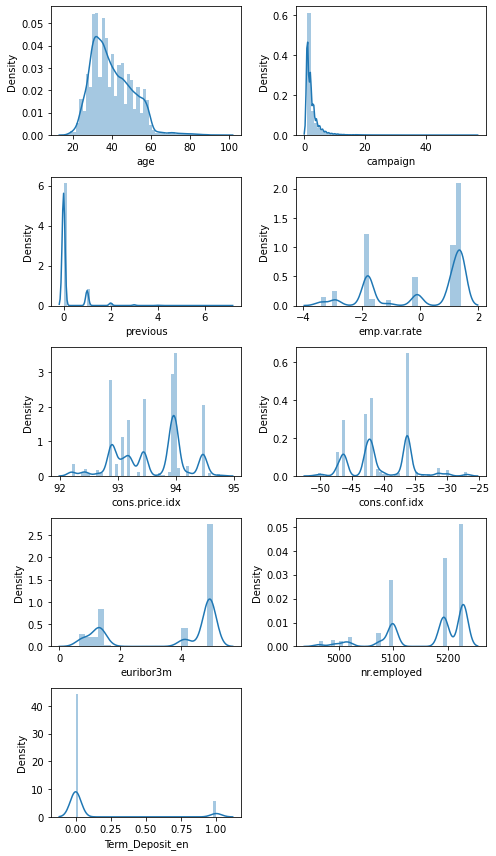

In [67]:
numerical_variables = df.select_dtypes(np.number)
print('Skewness of each column is as follows : ','\n', numerical_variables.skew())
plt.figure(figsize=(7,12))
columns = numerical_variables.columns
for i in list(enumerate(columns)):
    plt.subplot(5,2,i[0]+1)
    sns.distplot(numerical_variables[i[1]])
    plt.tight_layout()

From the understanding of our data only 2 features age and campaign are columns where data is spread continously
all other columns are numeric type but more of categorical in nature having values in each subcategories.
so transformation wolud make sense for only age and campaign column - however these 2 aren't also very highly skewed
overall doing transformation is not required at all.


# Step 4 - performing statistical test of every feature to find significance

In [68]:
from scipy import stats
from scipy.stats import shapiro

Statistical test for normality for every numeric column using Shapiro test.

In [69]:
for i in list(df_num.columns):
    print(shapiro(df_num[i]))   
# all p values are less than 0.05. all are normally distributed.

ShapiroResult(statistic=0.9582342505455017, pvalue=0.0)
ShapiroResult(statistic=0.5647687911987305, pvalue=0.0)
ShapiroResult(statistic=0.399774432182312, pvalue=0.0)
ShapiroResult(statistic=0.7658635973930359, pvalue=0.0)
ShapiroResult(statistic=0.9311832785606384, pvalue=0.0)
ShapiroResult(statistic=0.925634503364563, pvalue=0.0)
ShapiroResult(statistic=0.6896268129348755, pvalue=0.0)
ShapiroResult(statistic=0.7912653088569641, pvalue=0.0)


All p values are less than 0.05. all are normally distributed.

In [70]:
crosstabs = {}
features_cat = df_cat.columns

for i in range(len(df_cat.columns)):
    for j in range(i + 1, len(df_cat.columns)):
        col1 = features_cat[i]
        col2 = features_cat[j]
        crosstab = pd.crosstab(df[col1], df[col2])
        crosstabs[(col1, col2)] = crosstab
        
for key, crosstab in crosstabs.items():
    print(f"Crosstab between {key[0]} and {key[1]}:\n", crosstab, "\n")
    print('\n')

Crosstab between job and marital:
 marital        divorced  married  single
job                                     
admin.             1250     5196    3660
blue-collar         702     6274    1741
entrepreneur        172     1034     196
housemaid           159      750     119
management          324     1998     484
retired             337     1249      90
self-employed       132      878     371
services            509     2182    1076
student               9       42     800
technician          733     3464    2160
unemployed          121      626     241 



Crosstab between job and education:
 education      basic.4y  basic.6y  basic.9y  high.school  illiterate  \
job                                                                    
admin.              126       164       518         3185           1   
blue-collar        2156      1369      3362          856           8   
entrepreneur        132        71       205          221           2   
housemaid           451        

In [71]:
import pandas as pd
import numpy as np
from scipy.stats import pearsonr
import statsmodels.api as sm


# Pearson Correlation for numerical feature vs numerical target

for i in list(df_num.columns):
    pearson_corr, p_value = pearsonr(df_num[i], df['Term_Deposit_en'])
    print(f"Pearson Correlation for {i}: {pearson_corr}, p-value: {p_value}")
    
    if p_value < 0.05 :
        print(f'{i} is significantly related to Target variable')
    else : 
        print('Not significantly related to Target variable')
    print('')

# Null hypothesis - numerical feature is not significantly correlated with the numerical target.
# Alternative hypothesis - numerical feature is significantly correlated with the numerical target.

# A high correlation coefficient and a low p-value (typically < 0.05) 
# suggest that the numerical feature is significantly correlated with the numerical target.

Pearson Correlation for age: 0.028049085291230482, p-value: 2.92660627735226e-08
age is significantly related to Target variable

Pearson Correlation for campaign: -0.07354603251440603, p-value: 5.185469310382746e-48
campaign is significantly related to Target variable

Pearson Correlation for previous: 0.22920900401436461, p-value: 0.0
previous is significantly related to Target variable

Pearson Correlation for emp.var.rate: -0.2978822933278055, p-value: 0.0
emp.var.rate is significantly related to Target variable

Pearson Correlation for cons.price.idx: -0.13683890105561797, p-value: 1.184260702622688e-162
cons.price.idx is significantly related to Target variable

Pearson Correlation for cons.conf.idx: 0.05818855652357087, p-value: 1.1433520976591828e-30
cons.conf.idx is significantly related to Target variable

Pearson Correlation for euribor3m: -0.3076909973482342, p-value: 0.0
euribor3m is significantly related to Target variable

Pearson Correlation for nr.employed: -0.35405055

In [72]:
df.columns

Index(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'campaign', 'pdays', 'previous',
       'poutcome', 'emp.var.rate', 'cons.price.idx', 'cons.conf.idx',
       'euribor3m', 'nr.employed', 'Term_Deposit', 'Term_Deposit_en'],
      dtype='object')

In [73]:
# ANOVA for categorical feature vs numerical target
from scipy.stats import pearsonr, chi2_contingency, f_oneway

for i in list(df_cat.columns):
    groups = [df[df[i] == category]['Term_Deposit_en'] for category in df_cat[i].unique()]
    anova_result = f_oneway(*groups)
    print(f"ANOVA for {i} : F-statistic: {anova_result.statistic}, p-value: {anova_result.pvalue}", sep='  ')
    if anova_result.pvalue < 0.05 :
        print('Reject null - means are different')
    else :
        print('Means are same')
    print('')

# Null Hypothesis - means of the target variable are same across all categories of the categorical feature.
# Alternative Hypothesis - means of the target variable are different across the categories of the categorical feature.
    
# A significant F-statistic and a low p-value indicate that 
# the means of the target variable are significantly different across the categories of the categorical feature.

ANOVA for job : F-statistic: 92.90579658256864, p-value: 7.413366918260916e-191
Reject null - means are different

ANOVA for marital : F-statistic: 59.699090351547255, p-value: 1.2958192283654688e-26
Reject null - means are different

ANOVA for education : F-statistic: 32.28352561167793, p-value: 5.225884741410034e-39
Reject null - means are different

ANOVA for default : F-statistic: 0.3997649286853823, p-value: 0.5272143816364695
Means are same

ANOVA for housing : F-statistic: 5.759892057394752, p-value: 0.016400728342722028
Reject null - means are different

ANOVA for loan : F-statistic: 3.4337198022983078, p-value: 0.063885606832147
Means are same

ANOVA for contact : F-statistic: 929.147196000253, p-value: 1.052212050964353e-201
Reject null - means are different

ANOVA for month : F-statistic: 348.2741332368062, p-value: 0.0
Reject null - means are different

ANOVA for day_of_week : F-statistic: 7.263664262520789, p-value: 7.655977077850013e-06
Reject null - means are different



In [74]:
# Chi-Square contingency Test for categorical feature vs categorical target
for i in list(df_cat.columns):
    contingency_table = pd.crosstab(df[i], data['y'])
    chi2, p, dof, ex = chi2_contingency(contingency_table)
    print(f"Chi-Square for {i}: Chi2: {chi2}, p-value: {p}")
    if p < 0.05 :
        print('We reject null - Features are not associated ')
    else :
        print('Features are associated')
    print('')
        
# Null Hypothesis - proportions of Features are same
# Alternative Hypothesis - proportions of Features are different
        
# A significant Chi-Square statistic and a low p-value suggest a significant association between the categorical feature 
# and the categorical target.


Chi-Square for job: Chi2: 907.7331707127846, p-value: 1.3790626203754682e-188
We reject null - Features are not associated 

Chi-Square for marital: Chi2: 119.04360512386378, p-value: 1.4125687506963004e-26
We reject null - Features are not associated 

Chi-Square for education: Chi2: 192.7801404754759, p-value: 6.521830896219545e-39
We reject null - Features are not associated 

Chi-Square for default: Chi2: 0.06966652094052214, p-value: 0.791822945110442
Features are associated

Chi-Square for housing: Chi2: 5.683891954681657, p-value: 0.017121347927528913
We reject null - Features are not associated 

Chi-Square for loan: Chi2: 3.354230303965751, p-value: 0.06703254095034286
Features are associated

Chi-Square for contact: Chi2: 906.6361419605003, p-value: 3.5416779713316803e-199
We reject null - Features are not associated 

Chi-Square for month: Chi2: 2902.411858648708, p-value: 0.0
We reject null - Features are not associated 

Chi-Square for day_of_week: Chi2: 29.036783770944787

# Step 5: Building a basemodel

# Encoding

In [75]:
df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,Term_Deposit,Term_Deposit_en
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,1,0,0,nonexistent,1.100000,93.994000,-36.400000,4.857000,5191.000000,no,0
1,57,services,married,high.school,no,no,no,telephone,may,mon,1,0,0,nonexistent,1.100000,93.994000,-36.400000,4.857000,5191.000000,no,0
2,37,services,married,high.school,no,yes,no,telephone,may,mon,1,0,0,nonexistent,1.100000,93.994000,-36.400000,4.857000,5191.000000,no,0
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,1,0,0,nonexistent,1.100000,93.994000,-36.400000,4.857000,5191.000000,no,0
4,56,services,married,high.school,no,no,yes,telephone,may,mon,1,0,0,nonexistent,1.100000,93.994000,-36.400000,4.857000,5191.000000,no,0


In [76]:
df=df.drop('Term_Deposit', axis=1)
df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,Term_Deposit_en
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,1,0,0,nonexistent,1.100000,93.994000,-36.400000,4.857000,5191.000000,0
1,57,services,married,high.school,no,no,no,telephone,may,mon,1,0,0,nonexistent,1.100000,93.994000,-36.400000,4.857000,5191.000000,0
2,37,services,married,high.school,no,yes,no,telephone,may,mon,1,0,0,nonexistent,1.100000,93.994000,-36.400000,4.857000,5191.000000,0
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,1,0,0,nonexistent,1.100000,93.994000,-36.400000,4.857000,5191.000000,0
4,56,services,married,high.school,no,no,yes,telephone,may,mon,1,0,0,nonexistent,1.100000,93.994000,-36.400000,4.857000,5191.000000,0


In [77]:
encoding_df= df.drop('Term_Deposit_en', axis=1)
encoding_df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,1,0,0,nonexistent,1.100000,93.994000,-36.400000,4.857000,5191.000000
1,57,services,married,high.school,no,no,no,telephone,may,mon,1,0,0,nonexistent,1.100000,93.994000,-36.400000,4.857000,5191.000000
2,37,services,married,high.school,no,yes,no,telephone,may,mon,1,0,0,nonexistent,1.100000,93.994000,-36.400000,4.857000,5191.000000
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,1,0,0,nonexistent,1.100000,93.994000,-36.400000,4.857000,5191.000000
4,56,services,married,high.school,no,no,yes,telephone,may,mon,1,0,0,nonexistent,1.100000,93.994000,-36.400000,4.857000,5191.000000


In [78]:
columns=encoding_df.select_dtypes(include=object).columns
df_en= pd.concat([encoding_df,pd.get_dummies(encoding_df[columns], drop_first=True,dtype=int)],axis=1)

In [79]:
df_en.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,job_blue-collar,job_entrepreneur,job_housemaid,job_management,job_retired,job_self-employed,job_services,job_student,job_technician,job_unemployed,marital_married,marital_single,education_basic.6y,education_basic.9y,education_high.school,education_illiterate,education_professional.course,education_university.degree,default_yes,housing_yes,loan_yes,contact_telephone,month_aug,month_dec,month_jul,month_jun,month_mar,month_may,month_nov,month_oct,month_sep,day_of_week_mon,day_of_week_thu,day_of_week_tue,day_of_week_wed,pdays_1,poutcome_nonexistent,poutcome_success
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,1,0,0,nonexistent,1.100000,93.994000,-36.400000,4.857000,5191.000000,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0
1,57,services,married,high.school,no,no,no,telephone,may,mon,1,0,0,nonexistent,1.100000,93.994000,-36.400000,4.857000,5191.000000,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0
2,37,services,married,high.school,no,yes,no,telephone,may,mon,1,0,0,nonexistent,1.100000,93.994000,-36.400000,4.857000,5191.000000,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,1,0,0,nonexistent,1.100000,93.994000,-36.400000,4.857000,5191.000000,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0
4,56,services,married,high.school,no,no,yes,telephone,may,mon,1,0,0,nonexistent,1.100000,93.994000,-36.400000,4.857000,5191.000000,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0


Here we used one-hot encoding(get_dummies) encoding technique for converting categorical to numerical

In [80]:
columns

Index(['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact',
       'month', 'day_of_week', 'pdays', 'poutcome'],
      dtype='object')

In [81]:
df_en=df_en.drop(['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact',
       'month', 'day_of_week','pdays', 'poutcome'], axis=1)

In [82]:
df_en.head()

,age,campaign,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,job_blue-collar,job_entrepreneur,job_housemaid,job_management,job_retired,job_self-employed,job_services,job_student,job_technician,job_unemployed,marital_married,marital_single,education_basic.6y,education_basic.9y,education_high.school,education_illiterate,education_professional.course,education_university.degree,default_yes,housing_yes,loan_yes,contact_telephone,month_aug,month_dec,month_jul,month_jun,month_mar,month_may,month_nov,month_oct,month_sep,day_of_week_mon,day_of_week_thu,day_of_week_tue,day_of_week_wed,pdays_1,poutcome_nonexistent,poutcome_success
0,56,1,0,1.100000,93.994000,-36.400000,4.857000,5191.000000,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0
1,57,1,0,1.100000,93.994000,-36.400000,4.857000,5191.000000,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0
2,37,1,0,1.100000,93.994000,-36.400000,4.857000,5191.000000,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0
3,40,1,0,1.100000,93.994000,-36.400000,4.857000,5191.000000,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0
4,56,1,0,1.100000,93.994000,-36.400000,4.857000,5191.000000,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0


In [83]:
df_en['Target']= df['Term_Deposit_en']

In [84]:
df_en.head()

,age,campaign,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,job_blue-collar,job_entrepreneur,job_housemaid,job_management,job_retired,job_self-employed,job_services,job_student,job_technician,job_unemployed,marital_married,marital_single,education_basic.6y,education_basic.9y,education_high.school,education_illiterate,education_professional.course,education_university.degree,default_yes,housing_yes,loan_yes,contact_telephone,month_aug,month_dec,month_jul,month_jun,month_mar,month_may,month_nov,month_oct,month_sep,day_of_week_mon,day_of_week_thu,day_of_week_tue,day_of_week_wed,pdays_1,poutcome_nonexistent,poutcome_success,Target
0,56,1,0,1.100000,93.994000,-36.400000,4.857000,5191.000000,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0
1,57,1,0,1.100000,93.994000,-36.400000,4.857000,5191.000000,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0
2,37,1,0,1.100000,93.994000,-36.400000,4.857000,5191.000000,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0
3,40,1,0,1.100000,93.994000,-36.400000,4.857000,5191.000000,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0
4,56,1,0,1.100000,93.994000,-36.400000,4.857000,5191.000000,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0


In [85]:
df_final= df_en

In [86]:
df_final.shape

(39079, 47)

In [87]:
df_final

,age,campaign,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,job_blue-collar,job_entrepreneur,job_housemaid,job_management,job_retired,job_self-employed,job_services,job_student,job_technician,job_unemployed,marital_married,marital_single,education_basic.6y,education_basic.9y,education_high.school,education_illiterate,education_professional.course,education_university.degree,default_yes,housing_yes,loan_yes,contact_telephone,month_aug,month_dec,month_jul,month_jun,month_mar,month_may,month_nov,month_oct,month_sep,day_of_week_mon,day_of_week_thu,day_of_week_tue,day_of_week_wed,pdays_1,poutcome_nonexistent,poutcome_success,Target
0,56,1,0,1.100000,93.994000,-36.400000,4.857000,5191.000000,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0
1,57,1,0,1.100000,93.994000,-36.400000,4.857000,5191.000000,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0
2,37,1,0,1.100000,93.994000,-36.400000,4.857000,5191.000000,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0
3,40,1,0,1.100000,93.994000,-36.400000,4.857000,5191.000000,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0
4,56,1,0,1.100000,93.994000,-36.400000,4.857000,5191.000000,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,73,1,0,-1.100000,94.767000,-50.800000,1.028000,4963.600000,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1
41184,46,1,0,-1.100000,94.767000,-50.800000,1.028000,4963.600000,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0
41185,56,2,0,-1.100000,94.767000,-50.800000,1.028000,4963.600000,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0
41186,44,1,0,-1.100000,94.767000,-50.800000,1.028000,4963.600000,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1


# Splitting the data

In [88]:
x=df_final.drop('Target', axis=1)
y= df_final['Target']

In [89]:
xtrain, xtest, ytrain, ytest = train_test_split(x, y, test_size=0.2, random_state=100)

We have splitted the whole dat into 80% for train and 20% for testing

In [90]:
xtrain.shape

(31263, 46)

In [91]:
ytrain.shape

(31263,)

In [92]:
xtest.shape

(7816, 46)

In [93]:
ytest.shape

(7816,)

In [94]:
lr= LogisticRegression(random_state=100)
lr.fit(xtrain,ytrain)
train_pred=lr.predict(xtrain)
test_pred=lr.predict(xtest)

Base model we have built using logistic regression

Training data report

In [95]:
print(classification_report(ytrain,train_pred))

              precision    recall  f1-score   support

           0       0.90      0.98      0.94     27597
           1       0.59      0.22      0.32      3666

    accuracy                           0.89     31263
   macro avg       0.75      0.60      0.63     31263
weighted avg       0.87      0.89      0.87     31263



Testing data report

In [96]:
print(classification_report(ytest,test_pred))

              precision    recall  f1-score   support

           0       0.90      0.98      0.94      6887
           1       0.61      0.22      0.33       929

    accuracy                           0.89      7816
   macro avg       0.76      0.60      0.63      7816
weighted avg       0.87      0.89      0.87      7816



Training f1 score for class 1 is less as compared to testing f1 score

In [97]:
confusion_matrix(ytest,test_pred)

array([[6758,  129],
       [ 723,  206]], dtype=int64)

In [98]:
from matplotlib.colors import ListedColormap

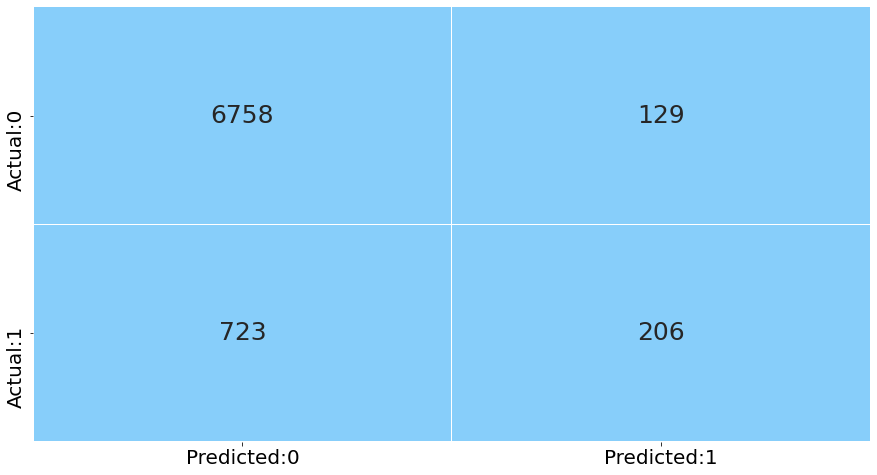

In [99]:
# create a confusion matrix
# pass the actual and predicted target values to the confusion_matrix()
cm = confusion_matrix(ytest,test_pred)
conf_matrix = pd.DataFrame(data = cm,columns = ['Predicted:0','Predicted:1'], index = ['Actual:0','Actual:1'])

# plot a heatmap to visualize the confusion matrix
# 'annot' prints the value of each grid 
# 'fmt = d' returns the integer value in each grid
# 'cmap' assigns color to each grid
# as we do not require different colors for each grid in the heatmap,
# use 'ListedColormap' to assign the specified color to the grid
# 'cbar = False' will not return the color bar to the right side of the heatmap
# 'linewidths' assigns the width to the line that divides each grid
# 'annot_kws = {'size':25})' assigns the font size of the annotated text 
sns.heatmap(conf_matrix, annot = True, fmt = 'd', cmap = ListedColormap(['lightskyblue']), cbar = False, 
            linewidths = 0.1, annot_kws = {'size':25})

# set the font size of x-axis ticks using 'fontsize'
plt.xticks(fontsize = 20)

# set the font size of y-axis ticks using 'fontsize'
plt.yticks(fontsize = 20)

# display the plot
plt.show()

we can say that TN and FN records are high from confusion matrix
TP and and FP counts are low

Text(0.5, 1.0, 'ROC-AUC-CURVE')

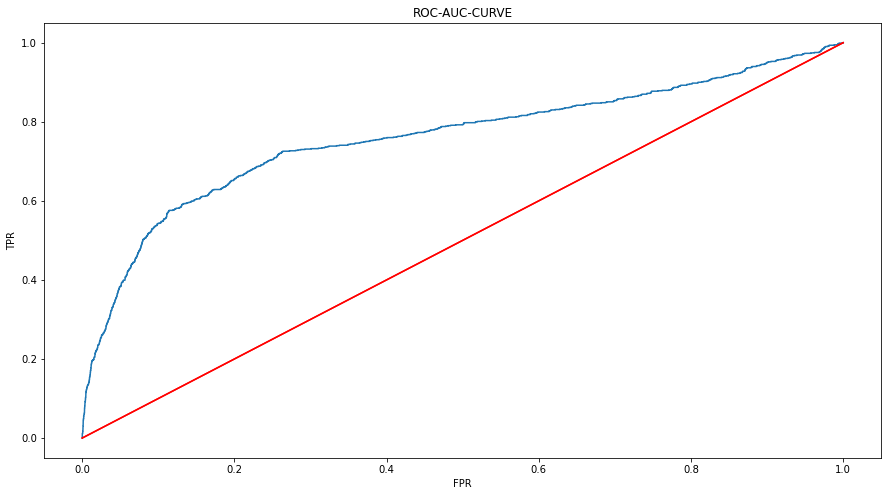

In [100]:
prob=lr.predict_proba(xtest)
req_prob=prob[:,1]
fpr,tpr,thresh=roc_curve(ytest,req_prob)
df1=pd.DataFrame({'FPR':fpr,'TPR':tpr,'Threshold':thresh})
plt.plot(fpr,tpr)
plt.plot([[0,0],[1,1]],color='red')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC-AUC-CURVE')

In [101]:
perf_score = pd.DataFrame(columns=["Model", "Accuracy","Recall","Precision","F1 Score", "AUC_Score"])

In [102]:
def per_measures(model,test,pred):
    accuracy    = accuracy_score(test,pred)
    f1score     = f1_score(test,pred)
    recall      = recall_score(test,pred)
    precision   = precision_score(test,pred)
    aucscore   = roc_auc_score(test,pred)
    return (accuracy,recall,precision,f1score,aucscore)

In [103]:
def update_performance (name, model,test,pred):

    # assign 'comp_perf' as global variable
    global perf_score


    # append the results to the dataframe 'score_card'
    # 'ignore_index = True' do not consider the index labels
    perf_score = perf_score.append({'Model'       : name,
                                    'Accuracy'    : per_measures(model,test,pred)[0],
                                    'Recall'      : per_measures(model,test,pred)[1],
                                    'Precision'   : per_measures(model,test,pred)[2],
                                    'F1 Score'    : per_measures(model,test,pred)[3],
                                    'AUC_Score'   : per_measures(model,test,pred)[4]
                                     },
                                   ignore_index = True)

In [104]:
update_performance(name = 'LogisticReg-Base', model = lr ,test = ytest, pred = test_pred)

# print the dataframe
perf_score

,Model,Accuracy,Recall,Precision,F1 Score,AUC_Score
0,LogisticReg-Base,0.890993,0.221744,0.614925,0.325949,0.601506


* F1 score for class 1 inn base model(logistic regression) is less around 0.32 
* Auc score also less around 0.60

# Scaling

In [105]:
xtrain.head()

,age,campaign,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,job_blue-collar,job_entrepreneur,job_housemaid,job_management,job_retired,job_self-employed,job_services,job_student,job_technician,job_unemployed,marital_married,marital_single,education_basic.6y,education_basic.9y,education_high.school,education_illiterate,education_professional.course,education_university.degree,default_yes,housing_yes,loan_yes,contact_telephone,month_aug,month_dec,month_jul,month_jun,month_mar,month_may,month_nov,month_oct,month_sep,day_of_week_mon,day_of_week_thu,day_of_week_tue,day_of_week_wed,pdays_1,poutcome_nonexistent,poutcome_success
2602,40,2,0,1.100000,93.994000,-36.400000,4.856000,5191.000000,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0
34752,48,2,0,-1.800000,92.893000,-46.200000,1.266000,5099.100000,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0
31257,46,1,1,-1.800000,92.893000,-46.200000,1.334000,5099.100000,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0
7919,29,2,0,1.400000,94.465000,-41.800000,4.865000,5228.100000,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0
39618,44,2,1,-1.800000,93.876000,-40.000000,0.682000,5008.700000,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0


In [106]:
xtest.head()

,age,campaign,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,job_blue-collar,job_entrepreneur,job_housemaid,job_management,job_retired,job_self-employed,job_services,job_student,job_technician,job_unemployed,marital_married,marital_single,education_basic.6y,education_basic.9y,education_high.school,education_illiterate,education_professional.course,education_university.degree,default_yes,housing_yes,loan_yes,contact_telephone,month_aug,month_dec,month_jul,month_jun,month_mar,month_may,month_nov,month_oct,month_sep,day_of_week_mon,day_of_week_thu,day_of_week_tue,day_of_week_wed,pdays_1,poutcome_nonexistent,poutcome_success
30726,51,1,1,-1.800000,92.893000,-46.200000,1.344000,5099.100000,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0
18073,28,19,0,1.400000,93.918000,-42.700000,4.963000,5228.100000,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0
5359,35,7,0,1.100000,93.994000,-36.400000,4.857000,5191.000000,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
30396,38,1,0,-1.800000,93.075000,-47.100000,1.365000,5099.100000,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
29388,41,4,0,-1.800000,93.075000,-47.100000,1.405000,5099.100000,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0


In [107]:
ytrain.head()

2602     0
34752    0
31257    0
7919     0
39618    0
Name: Target, dtype: int64

In [108]:
ytest.head()

30726    0
18073    0
5359     0
30396    1
29388    0
Name: Target, dtype: int64

In [109]:
ss= StandardScaler()
scaled_xtrain=ss.fit_transform(xtrain)
scaled_xtest=ss.transform(xtest)

* We have performed standard scaling method
* fit_transform() computes the mean and standard deviation of xtrain and then scales xtrain accordingly. This standardizes the training data
* transform() uses the mean and standard deviation computed from the training data to scale xtest. This ensures that the test data is transformed using the same parameters as the training data

### Scaled Logistic Regression model

In [110]:
lr_scaled= LogisticRegression(random_state=100)
lr_scaled.fit(scaled_xtrain,ytrain)
train_pred_scaled_lr=lr.predict(scaled_xtrain)
test_pred_scaled_lr=lr.predict(scaled_xtest)

In [111]:
scaled_xtrain

array([[-0.01351516, -0.22080608, -0.35935109, ..., -0.20134347,
         0.4092    , -0.19132691],
       [ 0.74968118, -0.22080608, -0.35935109, ..., -0.20134347,
         0.4092    , -0.19132691],
       [ 0.55888209, -0.56825226,  1.61367196, ..., -0.20134347,
        -2.44379277, -0.19132691],
       ...,
       [ 1.41747798, -0.56825226, -0.35935109, ..., -0.20134347,
         0.4092    , -0.19132691],
       [-0.87211105, -0.56825226, -0.35935109, ..., -0.20134347,
         0.4092    , -0.19132691],
       [ 0.46348255, -0.56825226, -0.35935109, ..., -0.20134347,
         0.4092    , -0.19132691]])

### Training Report

In [112]:
print(classification_report(ytrain,train_pred_scaled_lr))

              precision    recall  f1-score   support

           0       0.94      0.62      0.74     27597
           1       0.19      0.70      0.30      3666

    accuracy                           0.63     31263
   macro avg       0.57      0.66      0.52     31263
weighted avg       0.85      0.63      0.69     31263



### Testing Report

In [113]:
print(classification_report(ytest,test_pred_scaled_lr))

              precision    recall  f1-score   support

           0       0.94      0.61      0.74      6887
           1       0.19      0.69      0.30       929

    accuracy                           0.62      7816
   macro avg       0.57      0.65      0.52      7816
weighted avg       0.85      0.62      0.69      7816



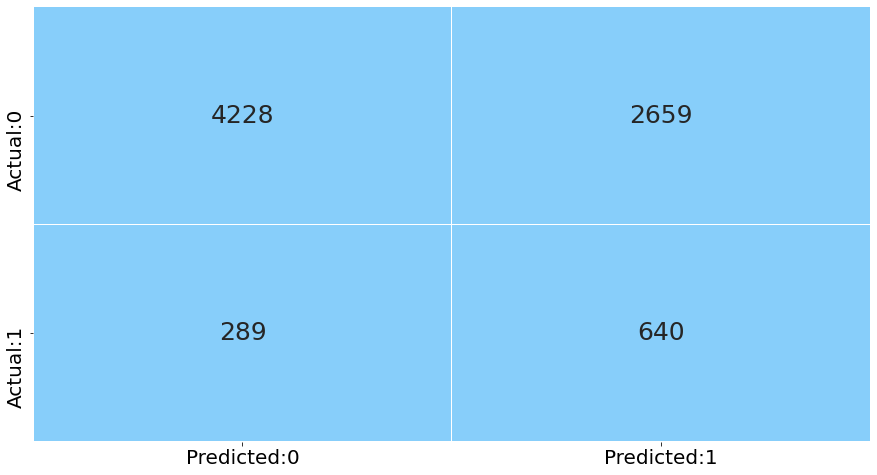

In [114]:
# create a confusion matrix
# pass the actual and predicted target values to the confusion_matrix()
cm_scaled_lr = confusion_matrix(ytest,test_pred_scaled_lr)
conf_matrix = pd.DataFrame(data = cm_scaled_lr,columns = ['Predicted:0','Predicted:1'], index = ['Actual:0','Actual:1'])

# plot a heatmap to visualize the confusion matrix
# 'annot' prints the value of each grid 
# 'fmt = d' returns the integer value in each grid
# 'cmap' assigns color to each grid
# as we do not require different colors for each grid in the heatmap,
# use 'ListedColormap' to assign the specified color to the grid
# 'cbar = False' will not return the color bar to the right side of the heatmap
# 'linewidths' assigns the width to the line that divides each grid
# 'annot_kws = {'size':25})' assigns the font size of the annotated text 
sns.heatmap(conf_matrix, annot = True, fmt = 'd', cmap = ListedColormap(['lightskyblue']), cbar = False, 
            linewidths = 0.1, annot_kws = {'size':25})

# set the font size of x-axis ticks using 'fontsize'
plt.xticks(fontsize = 20)

# set the font size of y-axis ticks using 'fontsize'
plt.yticks(fontsize = 20)

# display the plot
plt.show()

* We can say that after scaling, TN are decreased, TP records are increased but at the same time FP also increased as compared to previous model which is built without scaled data
* The values for precision, recall, f1 score and accuracy for class 1 also decreases

Text(0.5, 1.0, 'ROC-AUC-CURVE')

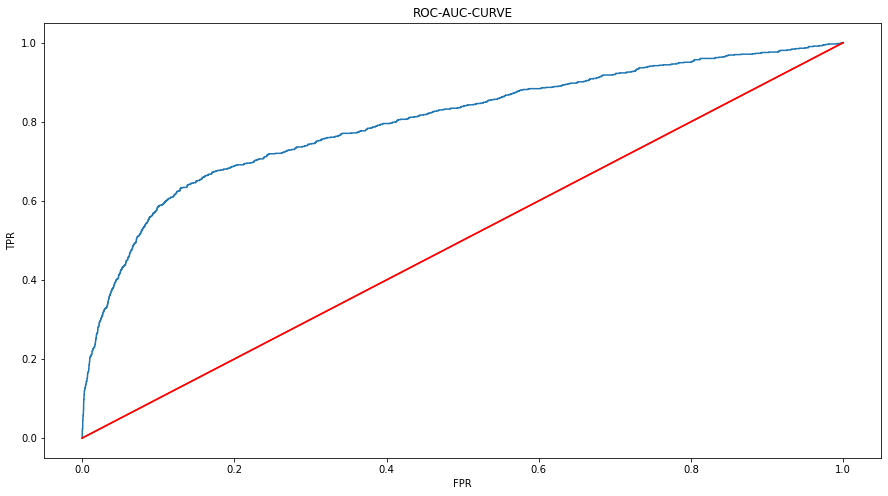

In [115]:
prob=lr_scaled.predict_proba(scaled_xtest)
req_prob=prob[:,1]
fpr,tpr,thresh=roc_curve(ytest,req_prob)
df1=pd.DataFrame({'FPR':fpr,'TPR':tpr,'Threshold':thresh})
plt.plot(fpr,tpr)
plt.plot([[0,0],[1,1]],color='red')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC-AUC-CURVE')

In [116]:
update_performance(name = 'LogisticReg-Scaled', model = lr_scaled,test=ytest,pred=test_pred_scaled_lr)

# print the dataframe
perf_score

,Model,Accuracy,Recall,Precision,F1 Score,AUC_Score
0,LogisticReg-Base,0.890993,0.221744,0.614925,0.325949,0.601506
1,LogisticReg-Scaled,0.622825,0.688913,0.193998,0.302744,0.651412


* In Logistic scaled model F1 score for class 1 slightly reduced than logistic regression without scaled data
* Auc scores for scaled model increased but it's not that good 

# Decision Tree 

#### xtrain,xtest,ytrain,ytest= train_test_split(x,y, test_size=0.2, random_state=100)

In [117]:
dt = DecisionTreeClassifier(random_state=100)
dt.fit(xtrain,ytrain)
train_ypred_dt= dt.predict(xtrain)
test_ypred_dt = dt.predict(xtest)

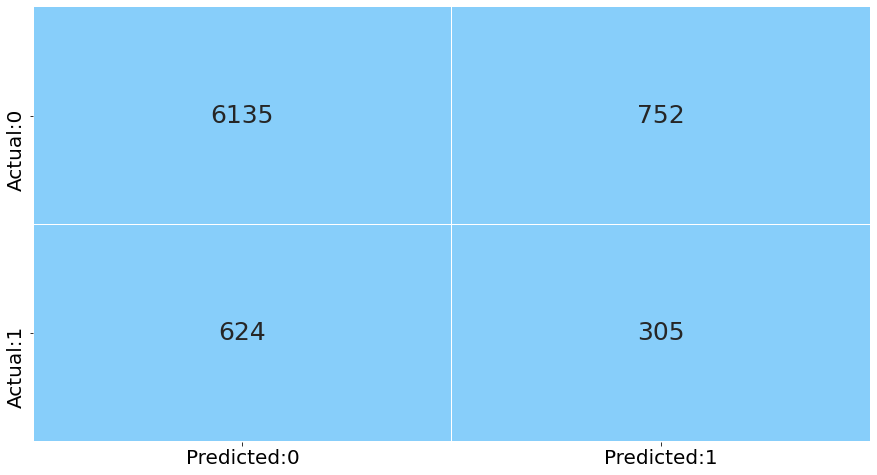

In [118]:
# create a confusion matrix
# pass the actual and predicted target values to the confusion_matrix()
cm_dt = confusion_matrix(ytest,test_ypred_dt)
conf_matrix = pd.DataFrame(data = cm_dt,columns = ['Predicted:0','Predicted:1'], index = ['Actual:0','Actual:1'])

# plot a heatmap to visualize the confusion matrix
# 'annot' prints the value of each grid 
# 'fmt = d' returns the integer value in each grid
# 'cmap' assigns color to each grid
# as we do not require different colors for each grid in the heatmap,
# use 'ListedColormap' to assign the specified color to the grid
# 'cbar = False' will not return the color bar to the right side of the heatmap
# 'linewidths' assigns the width to the line that divides each grid
# 'annot_kws = {'size':25})' assigns the font size of the annotated text 
sns.heatmap(conf_matrix, annot = True, fmt = 'd', cmap = ListedColormap(['lightskyblue']), cbar = False, 
            linewidths = 0.1, annot_kws = {'size':25})

# set the font size of x-axis ticks using 'fontsize'
plt.xticks(fontsize = 20)

# set the font size of y-axis ticks using 'fontsize'
plt.yticks(fontsize = 20)

# display the plot
plt.show()

* TN records are increased, TP records are decreased in decision tree 

Text(0.5, 1.0, 'ROC-AUC-CURVE')

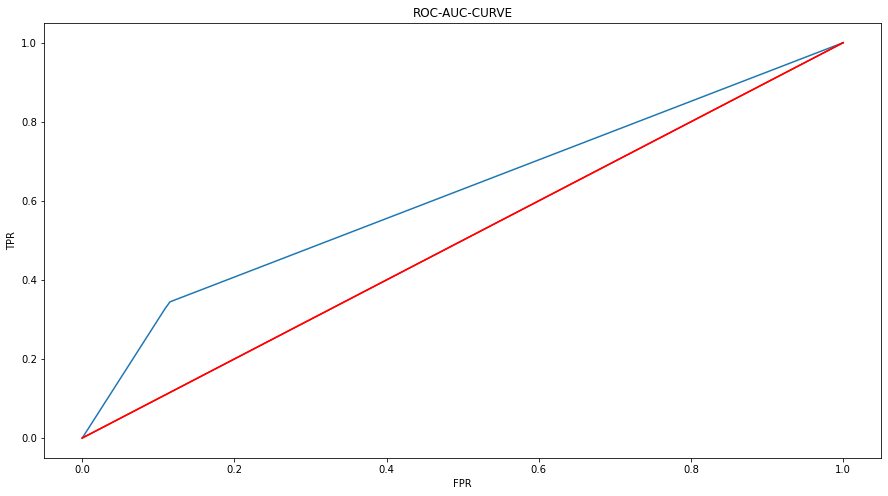

In [119]:
prob=dt.predict_proba(xtest)
req_prob=prob[:,1]
fpr,tpr,thresh=roc_curve(ytest,req_prob)
df1=pd.DataFrame({'FPR':fpr,'TPR':tpr,'Threshold':thresh})
plt.plot(fpr,tpr)
plt.plot([[0,0],[1,1]],color='red')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC-AUC-CURVE')

In [120]:
update_performance(name = 'Decision Tree-Gini', model = dt,test=ytest,pred=test_ypred_dt)

# print the dataframe
perf_score

,Model,Accuracy,Recall,Precision,F1 Score,AUC_Score
0,LogisticReg-Base,0.890993,0.221744,0.614925,0.325949,0.601506
1,LogisticReg-Scaled,0.622825,0.688913,0.193998,0.302744,0.651412
2,Decision Tree-Gini,0.823951,0.328310,0.288553,0.307150,0.609559


* In Decision tree algorithm since default criterion is gini we built a model which is giving f1 score less than logistic regression(unscaled model)
* AUC score for decision tree is less than logistic regression scaled model. It's around 0.609 more or less same to base model 

#### Decision Tree - Entropy

In [121]:
dt_e = DecisionTreeClassifier(criterion='entropy',random_state=10)
dt_e.fit(xtrain,ytrain)
ypred_dt_e = dt_e.predict(xtest)

print(accuracy_score(ytest,ypred_dt_e))
print(confusion_matrix(ytest,ypred_dt_e))
print(classification_report(ytest,ypred_dt_e))

0.8313715455475946
[[6174  713]
 [ 605  324]]
              precision    recall  f1-score   support

           0       0.91      0.90      0.90      6887
           1       0.31      0.35      0.33       929

    accuracy                           0.83      7816
   macro avg       0.61      0.62      0.62      7816
weighted avg       0.84      0.83      0.84      7816



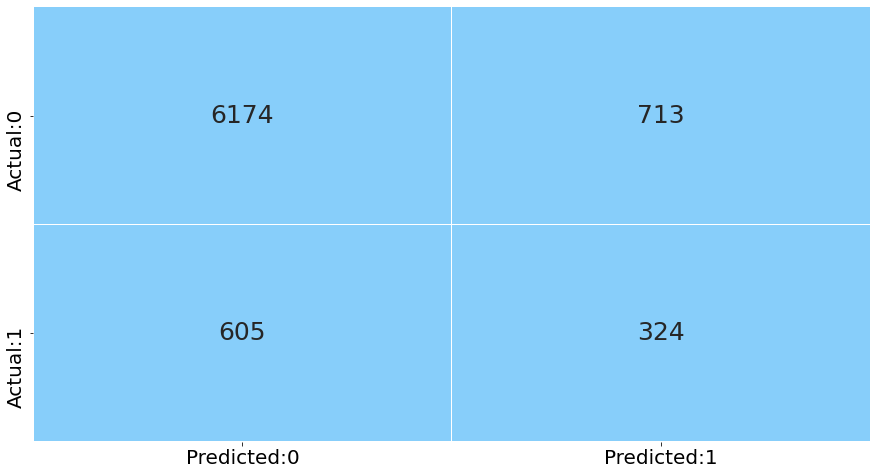

In [122]:
# create a confusion matrix
# pass the actual and predicted target values to the confusion_matrix()
cm_dt_e = confusion_matrix(ytest,ypred_dt_e)
conf_matrix = pd.DataFrame(data = cm_dt_e,columns = ['Predicted:0','Predicted:1'], index = ['Actual:0','Actual:1'])

# plot a heatmap to visualize the confusion matrix
# 'annot' prints the value of each grid 
# 'fmt = d' returns the integer value in each grid
# 'cmap' assigns color to each grid
# as we do not require different colors for each grid in the heatmap,
# use 'ListedColormap' to assign the specified color to the grid
# 'cbar = False' will not return the color bar to the right side of the heatmap
# 'linewidths' assigns the width to the line that divides each grid
# 'annot_kws = {'size':25})' assigns the font size of the annotated text 
sns.heatmap(conf_matrix, annot = True, fmt = 'd', cmap = ListedColormap(['lightskyblue']), cbar = False, 
            linewidths = 0.1, annot_kws = {'size':25})

# set the font size of x-axis ticks using 'fontsize'
plt.xticks(fontsize = 20)

# set the font size of y-axis ticks using 'fontsize'
plt.yticks(fontsize = 20)

# display the plot
plt.show()

Text(0.5, 1.0, 'ROC-AUC-CURVE')

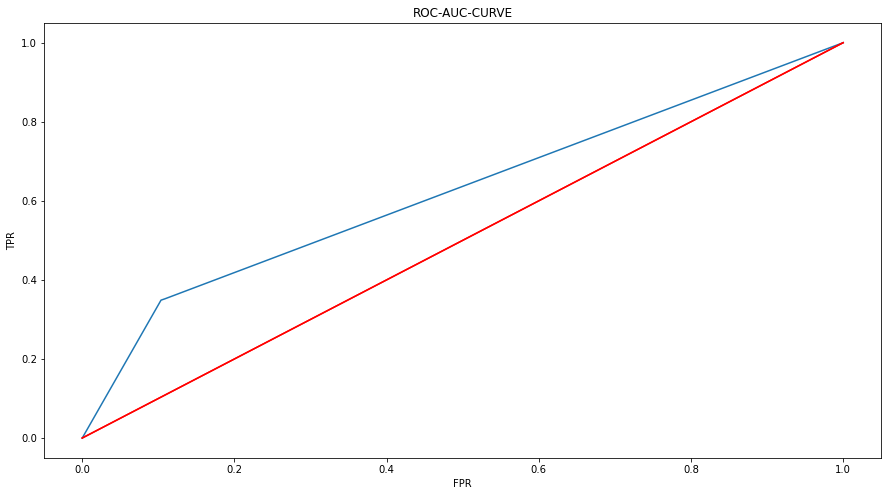

In [123]:
prob=dt_e.predict_proba(xtest)
req_prob=prob[:,1]
fpr,tpr,thresh=roc_curve(ytest,req_prob)
df1=pd.DataFrame({'FPR':fpr,'TPR':tpr,'Threshold':thresh})
plt.plot(fpr,tpr)
plt.plot([[0,0],[1,1]],color='red')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC-AUC-CURVE')

In [124]:
update_performance(name = 'Decision Tree-Entropy', model = dt_e,test=ytest,pred=ypred_dt_e)

# print the dataframe
perf_score

,Model,Accuracy,Recall,Precision,F1 Score,AUC_Score
0,LogisticReg-Base,0.890993,0.221744,0.614925,0.325949,0.601506
1,LogisticReg-Scaled,0.622825,0.688913,0.193998,0.302744,0.651412
2,Decision Tree-Gini,0.823951,0.328310,0.288553,0.307150,0.609559
3,Decision Tree-Entropy,0.831372,0.348762,0.312440,0.329603,0.622617


* Here we changed the criterion to entropy then we observed that our model is giving f1 score little bit higher than gini model and logistic regression model
* AUC score is slightly increased to 0.622 from decision tree-gini model. But it's less than logistic reg-scaled model

# Feature importances

In [125]:
# feature_imp = pd.DataFrame()
# feature_imp['Feature']=scaled_xtrain.columns
# feature_imp['Importance']=dt.feature_importances_

### Tuning of Decision Tree

In [126]:
from sklearn.model_selection import GridSearchCV

In [127]:
tuned_paramaters = [{'criterion': ['entropy','gini'],
                     'max_depth': [2,3,5,6,7,8,9,10],
}]

In [128]:
dt = DecisionTreeClassifier(random_state = 100)

tree_grid = GridSearchCV(estimator = dt, # The estimator can be logistic, Linear reg, decision tree
                         param_grid = tuned_paramaters)

In [129]:
tree_grid_model = tree_grid.fit(xtrain, ytrain)
print('Best parameters for decision tree classifier: ', tree_grid_model.best_params_, '\n')
# Tree grid directly utilizing the best parameters

Best parameters for decision tree classifier:  {'criterion': 'entropy', 'max_depth': 5} 



* We have given certain parameters to grid search for finding best parameters among them which improves model performance
* Here we got criterion as 'entropy' and max_depth = 5 among we passed these are the best parameters which we can feed to the model and check the performnce

In [130]:
dt_grid_model = DecisionTreeClassifier(criterion = 'entropy',max_depth = 5,random_state = 100)

In [131]:
dt_grid_model= dt_grid_model.fit(xtrain,ytrain)

In [132]:
ypred_dt_tp = dt_grid_model.predict(xtest)

print(accuracy_score(ytest,ypred_dt_tp))
print(confusion_matrix(ytest,ypred_dt_tp))
print(classification_report(ytest,ypred_dt_tp))

0.8963664278403275
[[6760  127]
 [ 683  246]]
              precision    recall  f1-score   support

           0       0.91      0.98      0.94      6887
           1       0.66      0.26      0.38       929

    accuracy                           0.90      7816
   macro avg       0.78      0.62      0.66      7816
weighted avg       0.88      0.90      0.88      7816



### More Parameters tuning

In [133]:
tuned_paramaters = [{'criterion': ['entropy','gini'],
                     'max_depth': [7,8,9], 
                     'max_features': ["sqrt", "log2"],
                     'min_samples_split': [8,9,10], 
                     'min_samples_leaf': [5,6,7],
                     'max_leaf_nodes': [8,9,10]}]

In [134]:
dt = DecisionTreeClassifier(random_state = 100)

tree_grid = GridSearchCV(estimator = dt, # The estimator can be is logistic, Linear reg, decision tree
                         param_grid = tuned_paramaters)

In [135]:
tree_grid_model = tree_grid.fit(xtrain,ytrain)
print('Best parameters for decision tree classifier: ', tree_grid_model.best_params_, '\n')

Best parameters for decision tree classifier:  {'criterion': 'gini', 'max_depth': 7, 'max_features': 'sqrt', 'max_leaf_nodes': 10, 'min_samples_leaf': 5, 'min_samples_split': 8} 



* Here we have given some more parameters and check the best from them
* We got the best using gridsearch

In [136]:
dt_grid_model1 = DecisionTreeClassifier(criterion = 'gini',max_depth = 7,max_features = 'sqrt',max_leaf_nodes = 10,
                            min_samples_leaf = 5,min_samples_split = 8, random_state = 100)

In [137]:
dt_grid_model1.fit(xtrain,ytrain)

DecisionTreeClassifier(max_depth=7, max_features='sqrt', max_leaf_nodes=10,
                       min_samples_leaf=5, min_samples_split=8,
                       random_state=100)

In [138]:
ypred_dt_tp_more = dt_grid_model1.predict(xtest)

print(accuracy_score(ytest,ypred_dt_tp_more))
print(confusion_matrix(ytest,ypred_dt_tp_more))
print(classification_report(ytest,ypred_dt_tp_more))

0.8953428863868986
[[6739  148]
 [ 670  259]]
              precision    recall  f1-score   support

           0       0.91      0.98      0.94      6887
           1       0.64      0.28      0.39       929

    accuracy                           0.90      7816
   macro avg       0.77      0.63      0.67      7816
weighted avg       0.88      0.90      0.88      7816



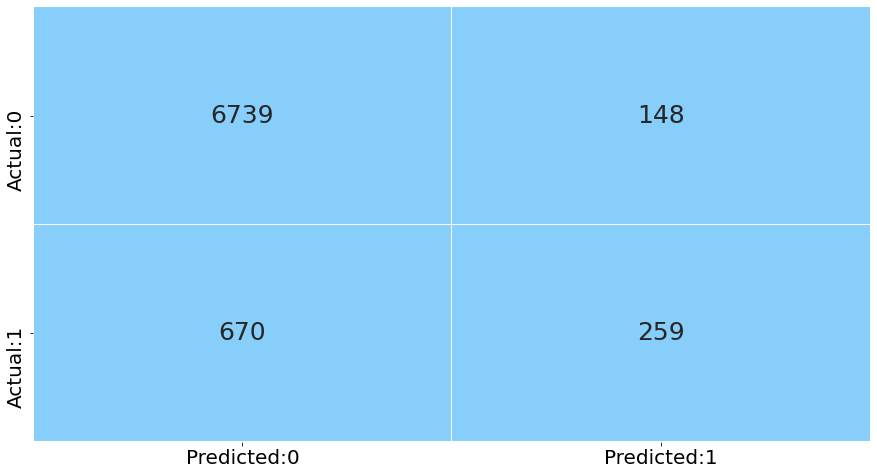

In [139]:
# create a confusion matrix
# pass the actual and predicted target values to the confusion_matrix()
cm_dt_tuned = confusion_matrix(ytest,ypred_dt_tp_more)
conf_matrix = pd.DataFrame(data = cm_dt_tuned,columns = ['Predicted:0','Predicted:1'], index = ['Actual:0','Actual:1'])
sns.heatmap(conf_matrix, annot = True, fmt = 'd', cmap = ListedColormap(['lightskyblue']), cbar = False, 
            linewidths = 0.1, annot_kws = {'size':25})

# set the font size of x-axis ticks using 'fontsize'
plt.xticks(fontsize = 20)

# set the font size of y-axis ticks using 'fontsize'
plt.yticks(fontsize = 20)

# display the plot
plt.show()

Text(0.5, 1.0, 'ROC-AUC-CURVE')

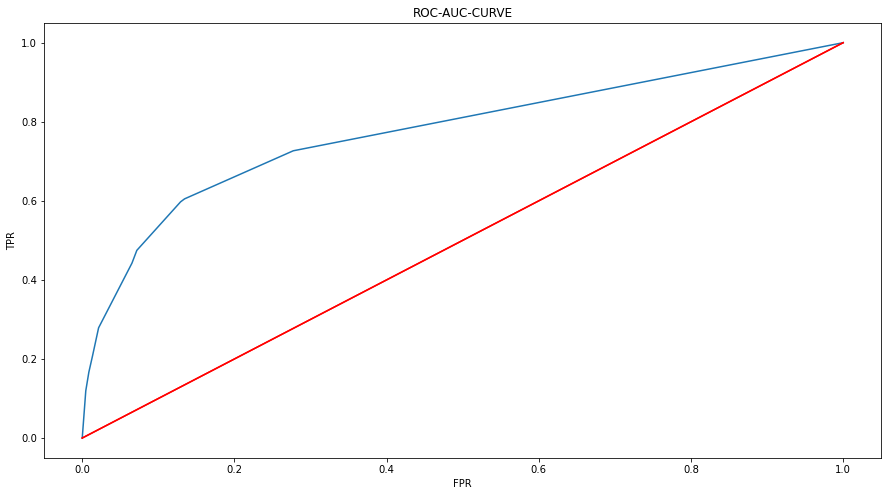

In [140]:
prob=dt_grid_model1.predict_proba(xtest)
req_prob=prob[:,1]
fpr,tpr,thresh=roc_curve(ytest,req_prob)
df1=pd.DataFrame({'FPR':fpr,'TPR':tpr,'Threshold':thresh})
plt.plot(fpr,tpr)
plt.plot([[0,0],[1,1]],color='red')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC-AUC-CURVE')

In [141]:
update_performance(name = 'Decision Tree-Tuned', model = dt_grid_model1,test=ytest,pred=ypred_dt_tp_more)

# print the dataframe
perf_score

,Model,Accuracy,Recall,Precision,F1 Score,AUC_Score
0,LogisticReg-Base,0.890993,0.221744,0.614925,0.325949,0.601506
1,LogisticReg-Scaled,0.622825,0.688913,0.193998,0.302744,0.651412
2,Decision Tree-Gini,0.823951,0.328310,0.288553,0.307150,0.609559
3,Decision Tree-Entropy,0.831372,0.348762,0.312440,0.329603,0.622617
4,Decision Tree-Tuned,0.895343,0.278794,0.636364,0.387725,0.628652


* After tuning some of the parameters in decision tree, we observed that f1 score has been increased little bit for class 1 
* AUC_Score also increased a bit which is around 0.628

# Random forest

In [142]:
rf = RandomForestClassifier(random_state=100)
rf.fit(xtrain,ytrain)

RandomForestClassifier(random_state=100)

In [143]:
ypred_rf = rf.predict(xtest)

print(accuracy_score(ytest,ypred_rf))
print(confusion_matrix(ytest,ypred_rf))
print(classification_report(ytest,ypred_rf))

0.8840839303991812
[[6646  241]
 [ 665  264]]
              precision    recall  f1-score   support

           0       0.91      0.97      0.94      6887
           1       0.52      0.28      0.37       929

    accuracy                           0.88      7816
   macro avg       0.72      0.62      0.65      7816
weighted avg       0.86      0.88      0.87      7816



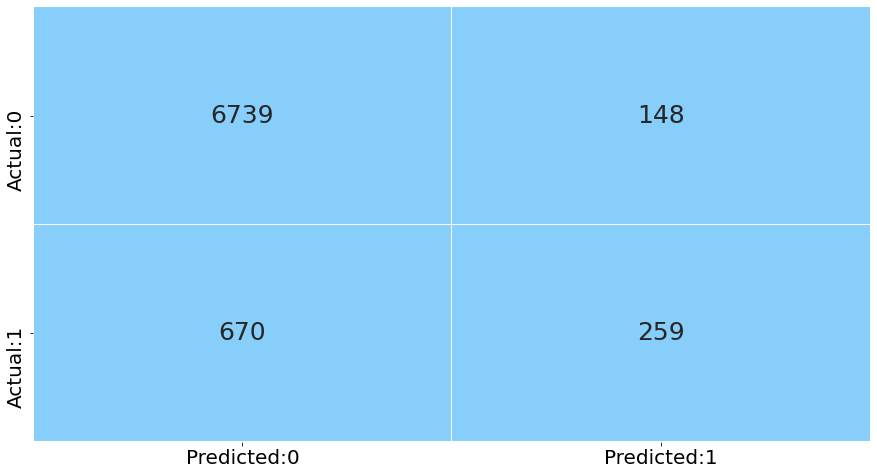

In [144]:
# create a confusion matrix
# pass the actual and predicted target values to the confusion_matrix()
cm_rf = confusion_matrix(ytest,ypred_rf)
conf_matrix = pd.DataFrame(data = cm_dt_tuned,columns = ['Predicted:0','Predicted:1'], index = ['Actual:0','Actual:1'])
sns.heatmap(conf_matrix, annot = True, fmt = 'd', cmap = ListedColormap(['lightskyblue']), cbar = False, 
            linewidths = 0.1, annot_kws = {'size':25})

# set the font size of x-axis ticks using 'fontsize'
plt.xticks(fontsize = 20)

# set the font size of y-axis ticks using 'fontsize'
plt.yticks(fontsize = 20)

# display the plot
plt.show()

Text(0.5, 1.0, 'ROC-AUC-CURVE')

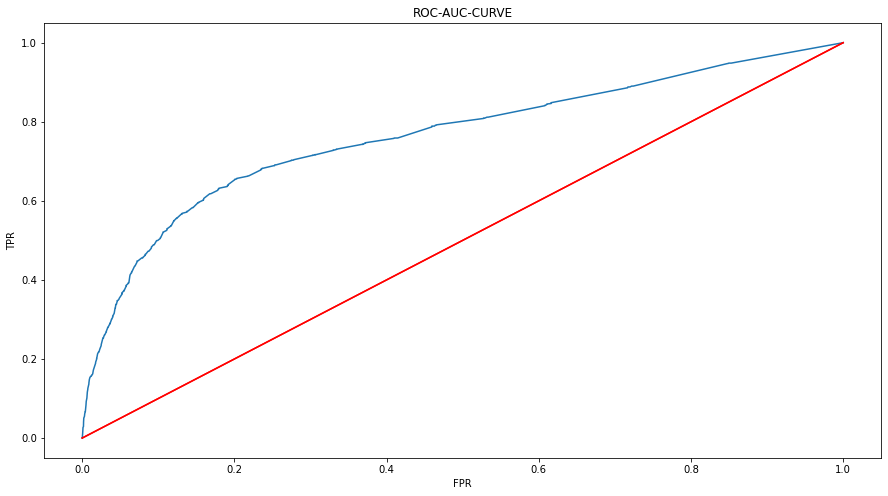

In [145]:
prob=rf.predict_proba(xtest)
req_prob=prob[:,1]
fpr,tpr,thresh=roc_curve(ytest,req_prob)
df1=pd.DataFrame({'FPR':fpr,'TPR':tpr,'Threshold':thresh})
plt.plot(fpr,tpr)
plt.plot([[0,0],[1,1]],color='red')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC-AUC-CURVE')

In [146]:
update_performance(name = 'Random Forest', model = rf,test=ytest,pred=ypred_rf)

# print the dataframe
perf_score

,Model,Accuracy,Recall,Precision,F1 Score,AUC_Score
0,LogisticReg-Base,0.890993,0.221744,0.614925,0.325949,0.601506
1,LogisticReg-Scaled,0.622825,0.688913,0.193998,0.302744,0.651412
2,Decision Tree-Gini,0.823951,0.328310,0.288553,0.307150,0.609559
3,Decision Tree-Entropy,0.831372,0.348762,0.312440,0.329603,0.622617
4,Decision Tree-Tuned,0.895343,0.278794,0.636364,0.387725,0.628652
5,Random Forest,0.884084,0.284177,0.522772,0.368201,0.624592


* By using random forest algorithm we are able to achieve around f1 score of 0.368 which is little bit lower than decision tree tuned model but more than logistic regression and decision tree untuned models
* AUC score is also around 0.624 which is close to previous model(decision tree tuned) 

### OOB sample performance

In [147]:
rf = RandomForestClassifier(oob_score=True, random_state=10)

rf.fit(xtrain,ytrain)

ypred_rf = rf.predict(xtest)
print(accuracy_score(ytest,ypred_rf))

print(rf.oob_score_)


0.8851074718526101
0.8852637302882002


* Here we tried our model with oob samples also which is out of bag samples which are left out from bootstramp sampling
* Advantage of OOB samples is we can use these samples as test data as these data are not seen by the model
* Since accuracy and oob score are more or less same so its shows that model reliability is consistent

### Tuning of Random Forest

In [148]:
params = [{'criterion': ['entropy', 'gini'],'n_estimators': [100],'max_depth': [10, 15],'max_features': ['sqrt', 'log2'],
           'min_samples_split': [2, 8],'min_samples_leaf': [5, 9],'max_leaf_nodes': [8, 11]}]

In [149]:
rf =RandomForestClassifier(random_state=10)

rf_cv = GridSearchCV(rf,params,scoring='accuracy')

rf_cv.fit(xtrain,ytrain)

rf_cv.best_params_

{'criterion': 'gini',
 'max_depth': 10,
 'max_features': 'sqrt',
 'max_leaf_nodes': 11,
 'min_samples_leaf': 9,
 'min_samples_split': 2,
 'n_estimators': 100}

In [150]:

rf_model = RandomForestClassifier(criterion ='gini',n_estimators =100, max_depth = 10, max_features = 'sqrt',
                                  max_leaf_nodes =11, min_samples_leaf =9, min_samples_split = 2, random_state = 100)


rf_model.fit(xtrain,ytrain)

ypred_rf_tp = rf_model.predict(xtest)

print(accuracy_score(ytest,ypred_rf_tp))
print(confusion_matrix(ytest,ypred_rf_tp))
print(classification_report(ytest,ypred_rf_tp))

0.8945752302968271
[[6822   65]
 [ 759  170]]
              precision    recall  f1-score   support

           0       0.90      0.99      0.94      6887
           1       0.72      0.18      0.29       929

    accuracy                           0.89      7816
   macro avg       0.81      0.59      0.62      7816
weighted avg       0.88      0.89      0.87      7816



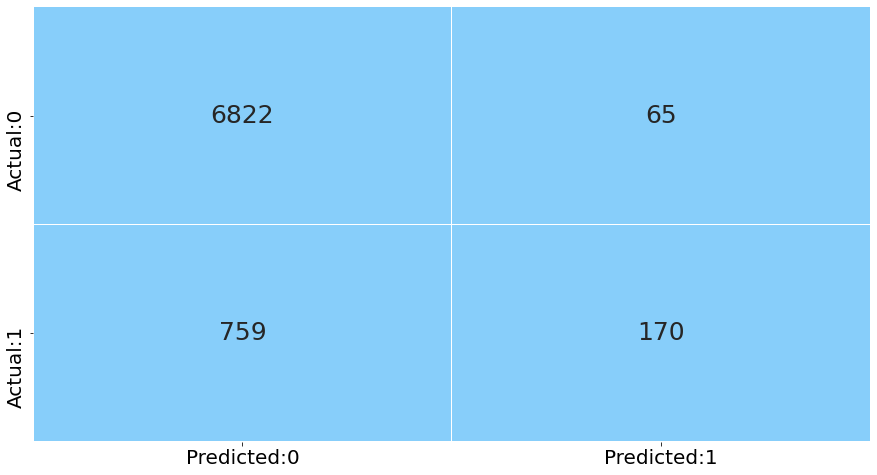

In [151]:
# create a confusion matrix
# pass the actual and predicted target values to the confusion_matrix()
cm_rf_tuned = confusion_matrix(ytest,ypred_rf_tp)
conf_matrix = pd.DataFrame(data = cm_rf_tuned,columns = ['Predicted:0','Predicted:1'], index = ['Actual:0','Actual:1'])
sns.heatmap(conf_matrix, annot = True, fmt = 'd', cmap = ListedColormap(['lightskyblue']), cbar = False, 
            linewidths = 0.1, annot_kws = {'size':25})

# set the font size of x-axis ticks using 'fontsize'
plt.xticks(fontsize = 20)

# set the font size of y-axis ticks using 'fontsize'
plt.yticks(fontsize = 20)

# display the plot
plt.show()

* After tuning random forest TN records are increased, FP records are decreased than untuned random forest model 

Text(0.5, 1.0, 'ROC-AUC-CURVE')

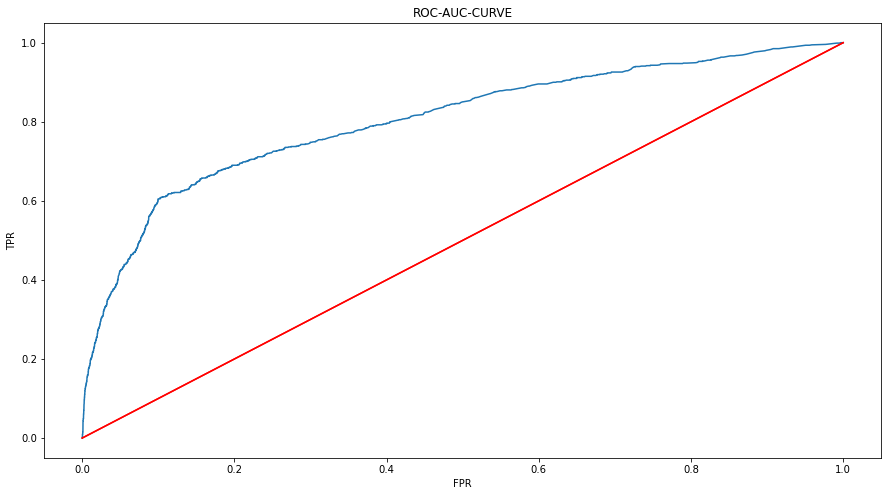

In [152]:
prob=rf_model.predict_proba(xtest)
req_prob=prob[:,1]
fpr,tpr,thresh=roc_curve(ytest,req_prob)
df1=pd.DataFrame({'FPR':fpr,'TPR':tpr,'Threshold':thresh})
plt.plot(fpr,tpr)
plt.plot([[0,0],[1,1]],color='red')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC-AUC-CURVE')

In [153]:
update_performance(name = 'Random Forest-Tuned', model = rf_model,test=ytest,pred=ypred_rf_tp)

# print the dataframe
perf_score

,Model,Accuracy,Recall,Precision,F1 Score,AUC_Score
0,LogisticReg-Base,0.890993,0.221744,0.614925,0.325949,0.601506
1,LogisticReg-Scaled,0.622825,0.688913,0.193998,0.302744,0.651412
2,Decision Tree-Gini,0.823951,0.328310,0.288553,0.307150,0.609559
3,Decision Tree-Entropy,0.831372,0.348762,0.312440,0.329603,0.622617
4,Decision Tree-Tuned,0.895343,0.278794,0.636364,0.387725,0.628652
5,Random Forest,0.884084,0.284177,0.522772,0.368201,0.624592
6,Random Forest-Tuned,0.894575,0.182992,0.723404,0.292096,0.586777


* But we found that our f1 score is reduced as compared to previous models after tuning
* AUC score also reduced. It's around 50% only 

### Bagging Classifier - Decision tree

In [154]:
from sklearn.ensemble import BaggingClassifier

dt=DecisionTreeClassifier(random_state=100)

bc=BaggingClassifier(dt) # by default the estimator is Decision Tree
bc.fit(xtrain,ytrain)

ypred_bc = bc.predict(xtest)

print(accuracy_score(ytest,ypred_bc))

0.8784544524053224


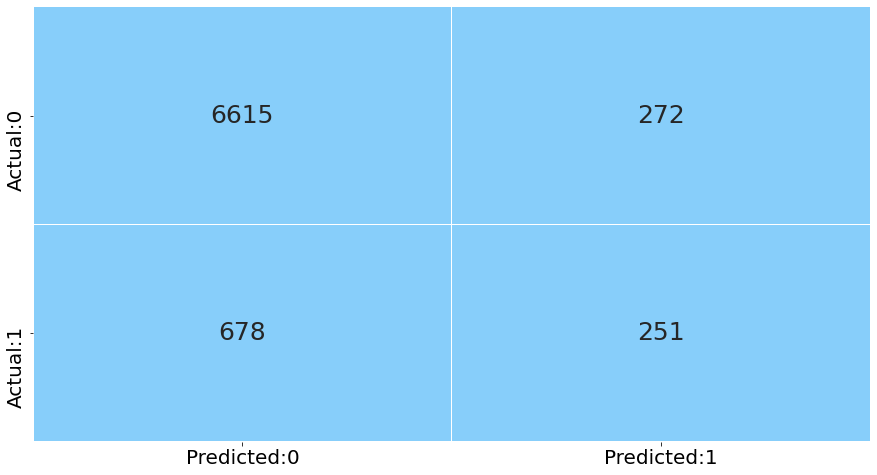

In [155]:
cm_bag_dt = confusion_matrix(ytest,ypred_bc)
conf_matrix = pd.DataFrame(data = cm_bag_dt,columns = ['Predicted:0','Predicted:1'], index = ['Actual:0','Actual:1'])
sns.heatmap(conf_matrix, annot = True, fmt = 'd', cmap = ListedColormap(['lightskyblue']), cbar = False, 
            linewidths = 0.1, annot_kws = {'size':25})

# set the font size of x-axis ticks using 'fontsize'
plt.xticks(fontsize = 20)

# set the font size of y-axis ticks using 'fontsize'
plt.yticks(fontsize = 20)

# display the plot
plt.show()

* In Bagging Classifier - Decision tree, TN records are less as compared to random forest tuned model, TP records are increased than the previous

Text(0.5, 1.0, 'ROC-AUC-CURVE')

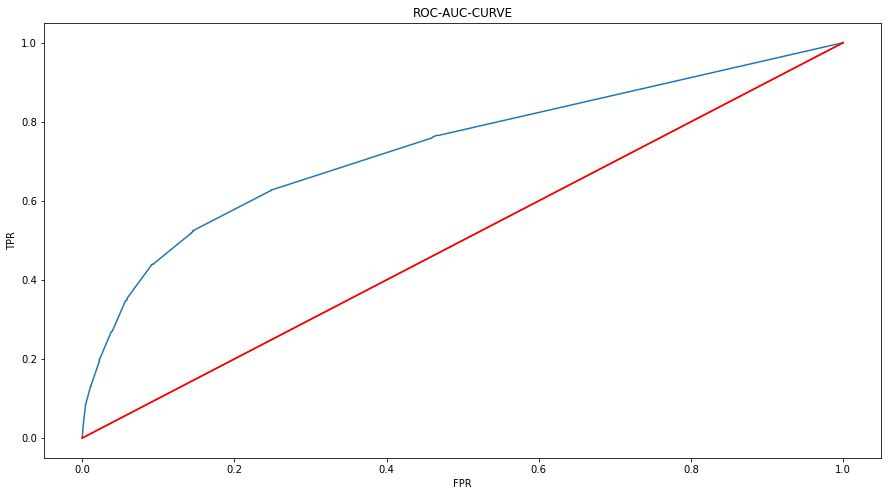

In [156]:
prob=bc.predict_proba(xtest)
req_prob=prob[:,1]
fpr,tpr,thresh=roc_curve(ytest,req_prob)
df1=pd.DataFrame({'FPR':fpr,'TPR':tpr,'Threshold':thresh})
plt.plot(fpr,tpr)
plt.plot([[0,0],[1,1]],color='red')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC-AUC-CURVE')

In [157]:
update_performance(name = 'Bagging Classifier-dt', model = bc,test=ytest,pred=ypred_bc)

# print the dataframe
perf_score

,Model,Accuracy,Recall,Precision,F1 Score,AUC_Score
0,LogisticReg-Base,0.890993,0.221744,0.614925,0.325949,0.601506
1,LogisticReg-Scaled,0.622825,0.688913,0.193998,0.302744,0.651412
2,Decision Tree-Gini,0.823951,0.328310,0.288553,0.307150,0.609559
3,Decision Tree-Entropy,0.831372,0.348762,0.312440,0.329603,0.622617
4,Decision Tree-Tuned,0.895343,0.278794,0.636364,0.387725,0.628652
5,Random Forest,0.884084,0.284177,0.522772,0.368201,0.624592
6,Random Forest-Tuned,0.894575,0.182992,0.723404,0.292096,0.586777
7,Bagging Classifier-dt,0.878454,0.270183,0.479924,0.345730,0.615344


* Here we observed that bagging classifier with decision tree our f1 score for class 1 is around 0.355 which is more than random forest tuned, logistic regression and normal decision tree 
* Auc Score also around 0.61 (60%) which is more than random forest tuned

### Bagging Classifier - KNN

In [158]:
from sklearn.ensemble import BaggingClassifier

knn=KNeighborsClassifier()

bag_knn=BaggingClassifier(knn,random_state=10) 
bag_knn.fit(scaled_xtrain,ytrain)

ypred_bag_knn = bag_knn.predict(scaled_xtest)

print(accuracy_score(ytest,ypred_bag_knn))

0.8863868986693961


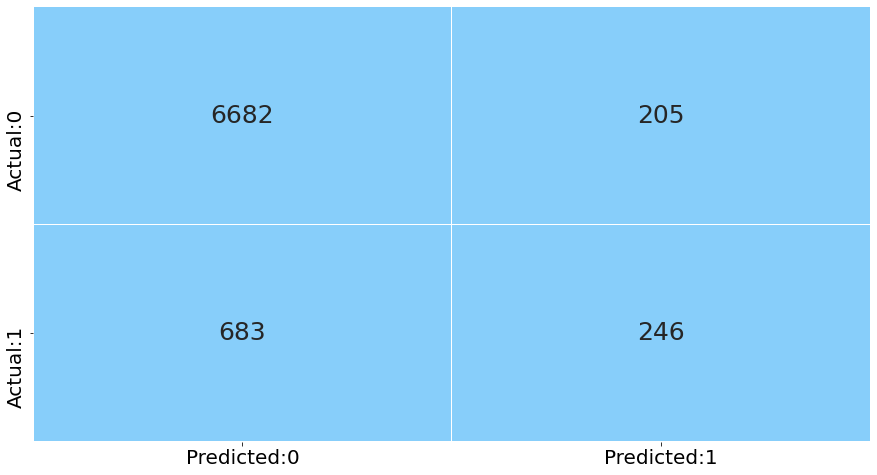

In [159]:
cm_bag_knn = confusion_matrix(ytest,ypred_bag_knn)
conf_matrix = pd.DataFrame(data = cm_bag_knn,columns = ['Predicted:0','Predicted:1'], index = ['Actual:0','Actual:1'])
sns.heatmap(conf_matrix, annot = True, fmt = 'd', cmap = ListedColormap(['lightskyblue']), cbar = False, 
            linewidths = 0.1, annot_kws = {'size':25})

# set the font size of x-axis ticks using 'fontsize'
plt.xticks(fontsize = 20)

# set the font size of y-axis ticks using 'fontsize'
plt.yticks(fontsize = 20)

# display the plot
plt.show()

* We observed that bagging classifier with KNN we passed scaled data since KNN is dealing with distance we need to scale the data before processing with model
* TP records are slightly reduced, TN records slightly increased as compared to Bagging classifier with decision tree

Text(0.5, 1.0, 'ROC-AUC-CURVE')

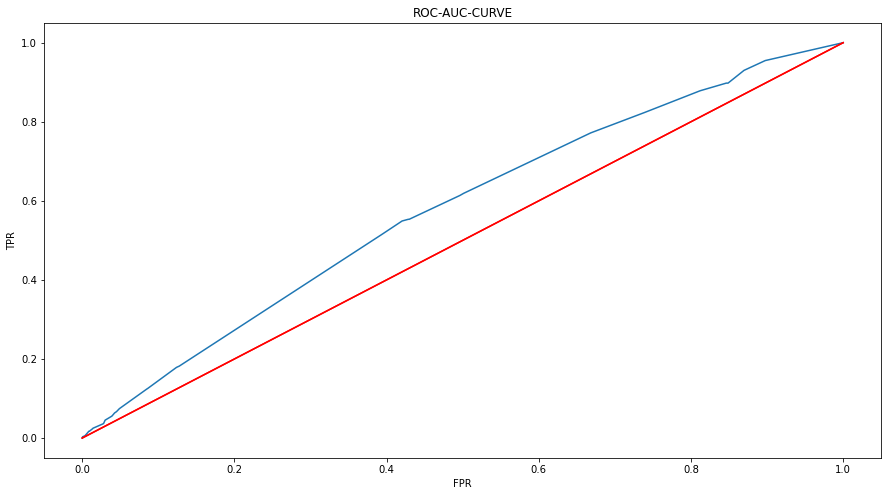

In [160]:
prob=bag_knn.predict_proba(xtest)
req_prob=prob[:,1]
fpr,tpr,thresh=roc_curve(ytest,req_prob)
df1=pd.DataFrame({'FPR':fpr,'TPR':tpr,'Threshold':thresh})
plt.plot(fpr,tpr)
plt.plot([[0,0],[1,1]],color='red')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC-AUC-CURVE')

In [161]:
update_performance(name = 'Bagging Classifier-knn', model = bag_knn,test=ytest,pred=ypred_bag_knn)

# print the dataframe
perf_score

,Model,Accuracy,Recall,Precision,F1 Score,AUC_Score
0,LogisticReg-Base,0.890993,0.221744,0.614925,0.325949,0.601506
1,LogisticReg-Scaled,0.622825,0.688913,0.193998,0.302744,0.651412
2,Decision Tree-Gini,0.823951,0.328310,0.288553,0.307150,0.609559
3,Decision Tree-Entropy,0.831372,0.348762,0.312440,0.329603,0.622617
4,Decision Tree-Tuned,0.895343,0.278794,0.636364,0.387725,0.628652
5,Random Forest,0.884084,0.284177,0.522772,0.368201,0.624592
6,Random Forest-Tuned,0.894575,0.182992,0.723404,0.292096,0.586777
7,Bagging Classifier-dt,0.878454,0.270183,0.479924,0.345730,0.615344
8,Bagging Classifier-knn,0.886387,0.264801,0.545455,0.356522,0.617517


* In bagging classifier with knn F1 score is more or less same with bagging classifier with decision tree
* Auc score is also similar to bagging with decision tree (0.617)

#### Bagging - Logistic Regression 

In [162]:
logr=LogisticRegression()

bag_logr=BaggingClassifier(logr,random_state=10)
bag_logr.fit(xtrain,ytrain)

ypred_bag_logr = bag_logr.predict(xtest)

print(accuracy_score(ytest,ypred_bag_logr))

0.8913766632548619


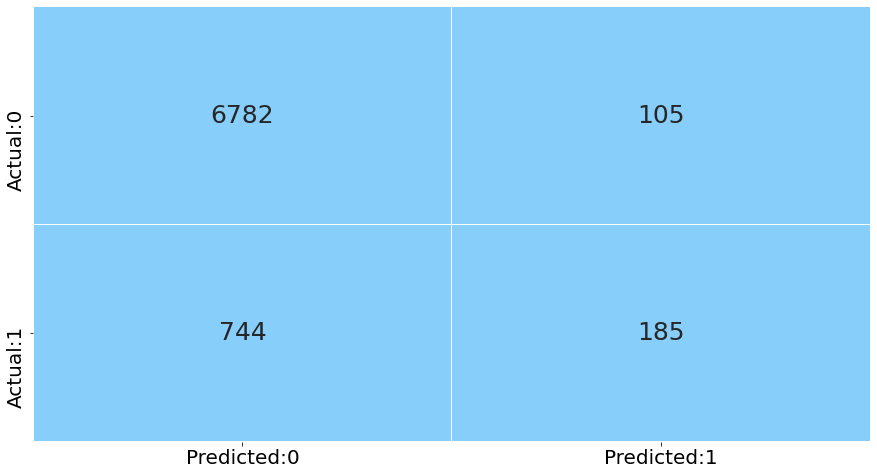

In [163]:
cm_bag_LR = confusion_matrix(ytest,ypred_bag_logr)
conf_matrix = pd.DataFrame(data = cm_bag_LR,columns = ['Predicted:0','Predicted:1'], index = ['Actual:0','Actual:1'])
sns.heatmap(conf_matrix, annot = True, fmt = 'd', cmap = ListedColormap(['lightskyblue']), cbar = False, 
            linewidths = 0.1, annot_kws = {'size':25})

# set the font size of x-axis ticks using 'fontsize'
plt.xticks(fontsize = 20)

# set the font size of y-axis ticks using 'fontsize'
plt.yticks(fontsize = 20)

# display the plot
plt.show()

* In Bagging classifier with logistic regression, TP records are slightly reduced and TN records are slightly increased as compared to bagging with KNN 

Text(0.5, 1.0, 'ROC-AUC-CURVE')

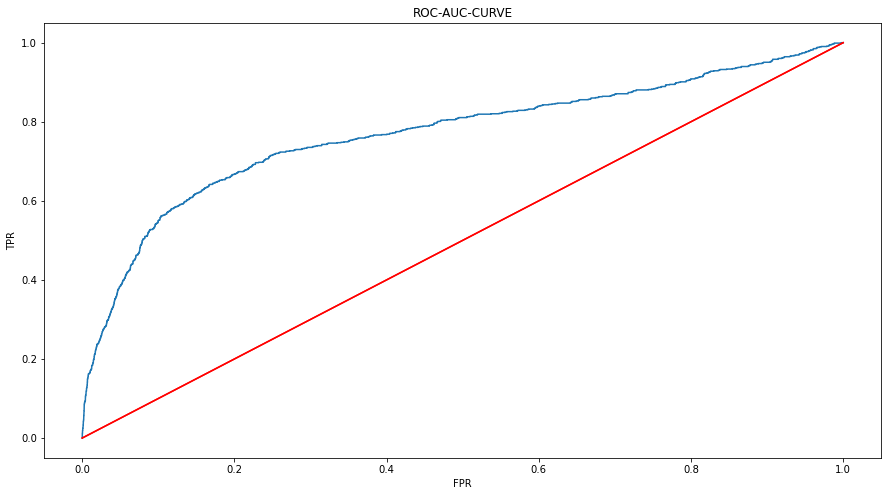

In [164]:
prob=bag_logr.predict_proba(xtest)
req_prob=prob[:,1]
fpr,tpr,thresh=roc_curve(ytest,req_prob)
df1=pd.DataFrame({'FPR':fpr,'TPR':tpr,'Threshold':thresh})
plt.plot(fpr,tpr)
plt.plot([[0,0],[1,1]],color='red')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC-AUC-CURVE')

In [165]:
update_performance(name = 'Bagging Classifier-Log', model = bag_logr,test=ytest,pred=ypred_bag_logr)

# print the dataframe
perf_score

,Model,Accuracy,Recall,Precision,F1 Score,AUC_Score
0,LogisticReg-Base,0.890993,0.221744,0.614925,0.325949,0.601506
1,LogisticReg-Scaled,0.622825,0.688913,0.193998,0.302744,0.651412
2,Decision Tree-Gini,0.823951,0.328310,0.288553,0.307150,0.609559
3,Decision Tree-Entropy,0.831372,0.348762,0.312440,0.329603,0.622617
4,Decision Tree-Tuned,0.895343,0.278794,0.636364,0.387725,0.628652
5,Random Forest,0.884084,0.284177,0.522772,0.368201,0.624592
6,Random Forest-Tuned,0.894575,0.182992,0.723404,0.292096,0.586777
7,Bagging Classifier-dt,0.878454,0.270183,0.479924,0.345730,0.615344
8,Bagging Classifier-knn,0.886387,0.264801,0.545455,0.356522,0.617517
9,Bagging Classifier-Log,0.891377,0.199139,0.637931,0.303527,0.591946


* In bagging classifier with logistic regression F1scoreis around 0.30 for class 1 
* Auc score is also less, it's around 0.59(approx 60%)

#### Ensemble Learning- AdaBoosting

In [166]:
from sklearn.ensemble  import AdaBoostClassifier

In [167]:
abcl = AdaBoostClassifier(dt,random_state=10)
abcl.fit(xtrain,ytrain)

ypred_abcl = abcl.predict(xtest)
print(accuracy_score(ytest,ypred_abcl))

0.8527379733879222


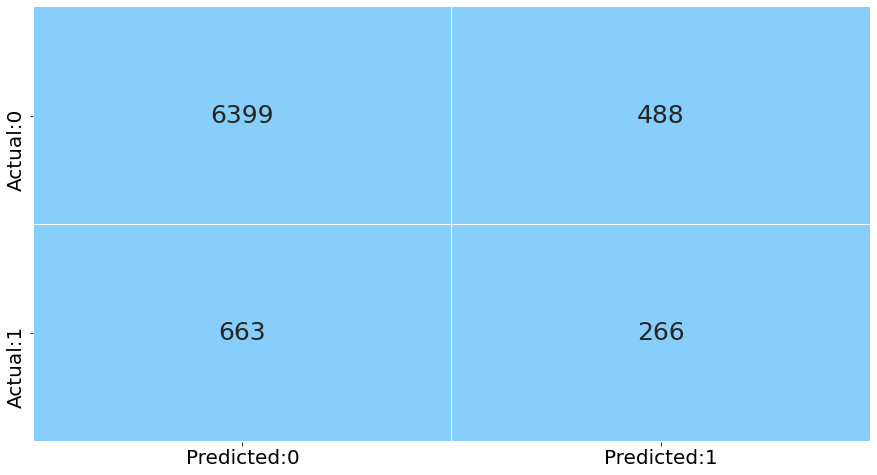

In [168]:
cm_bag_abcl = confusion_matrix(ytest,ypred_abcl)
conf_matrix = pd.DataFrame(data = cm_bag_abcl,columns = ['Predicted:0','Predicted:1'], index = ['Actual:0','Actual:1'])
sns.heatmap(conf_matrix, annot = True, fmt = 'd', cmap = ListedColormap(['lightskyblue']), cbar = False, 
            linewidths = 0.1, annot_kws = {'size':25})

# set the font size of x-axis ticks using 'fontsize'
plt.xticks(fontsize = 20)

# set the font size of y-axis ticks using 'fontsize'
plt.yticks(fontsize = 20)

# display the plot
plt.show()

* By using adaboosting classsifier, we found that TP records are slightly gone up TN records are gone down than Bagging with logistic regression 

Text(0.5, 1.0, 'ROC-AUC-CURVE')

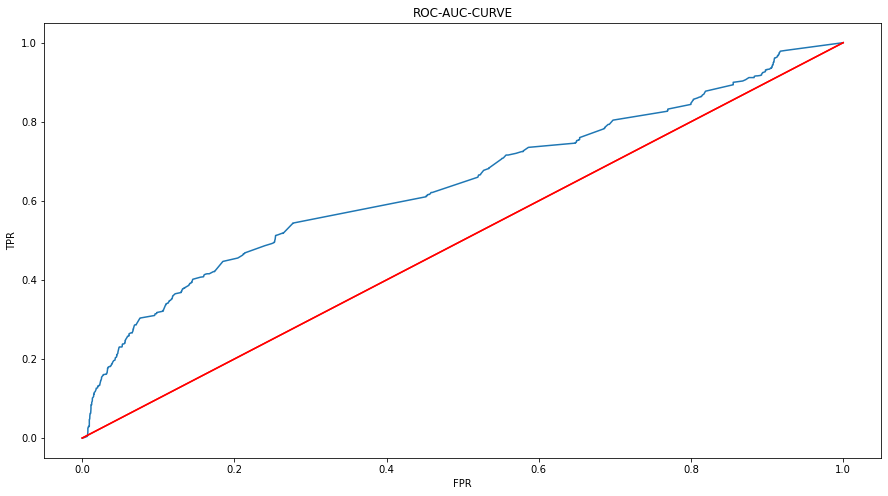

In [169]:
prob=abcl.predict_proba(xtest)
req_prob=prob[:,1]
fpr,tpr,thresh=roc_curve(ytest,req_prob)
df1=pd.DataFrame({'FPR':fpr,'TPR':tpr,'Threshold':thresh})
plt.plot(fpr,tpr)
plt.plot([[0,0],[1,1]],color='red')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC-AUC-CURVE')

In [170]:
update_performance(name = 'AdaBoost-dt', model = abcl,test=ytest,pred=ypred_abcl)

# print the dataframe
perf_score

,Model,Accuracy,Recall,Precision,F1 Score,AUC_Score
0,LogisticReg-Base,0.890993,0.221744,0.614925,0.325949,0.601506
1,LogisticReg-Scaled,0.622825,0.688913,0.193998,0.302744,0.651412
2,Decision Tree-Gini,0.823951,0.328310,0.288553,0.307150,0.609559
3,Decision Tree-Entropy,0.831372,0.348762,0.312440,0.329603,0.622617
4,Decision Tree-Tuned,0.895343,0.278794,0.636364,0.387725,0.628652
5,Random Forest,0.884084,0.284177,0.522772,0.368201,0.624592
6,Random Forest-Tuned,0.894575,0.182992,0.723404,0.292096,0.586777
7,Bagging Classifier-dt,0.878454,0.270183,0.479924,0.345730,0.615344
8,Bagging Classifier-knn,0.886387,0.264801,0.545455,0.356522,0.617517
9,Bagging Classifier-Log,0.891377,0.199139,0.637931,0.303527,0.591946


* In adaboost classifier with decision tree F1score is similar withbagging  with logistic regression for class 1 
* Auc score is also same to that, it's around 0.607(approx 61%)

#### Ensemble Learning- Gradient Boosting

In [171]:
from sklearn.ensemble import GradientBoostingClassifier
gbcl = GradientBoostingClassifier(n_estimators=50,random_state=100)
gbcl.fit(xtrain,ytrain)
ypred_gbcl = gbcl.predict(xtest)
print(accuracy_score(ytest,ypred_gbcl))

0.897517911975435


In [172]:
gbcl = GradientBoostingClassifier(n_estimators=50,learning_rate=0.5,random_state=100,max_depth=3)
gbcl.fit(xtrain,ytrain)
ypred_gbcl = gbcl.predict(xtest)
print(accuracy_score(ytest,ypred_gbcl))

0.8972620266120778


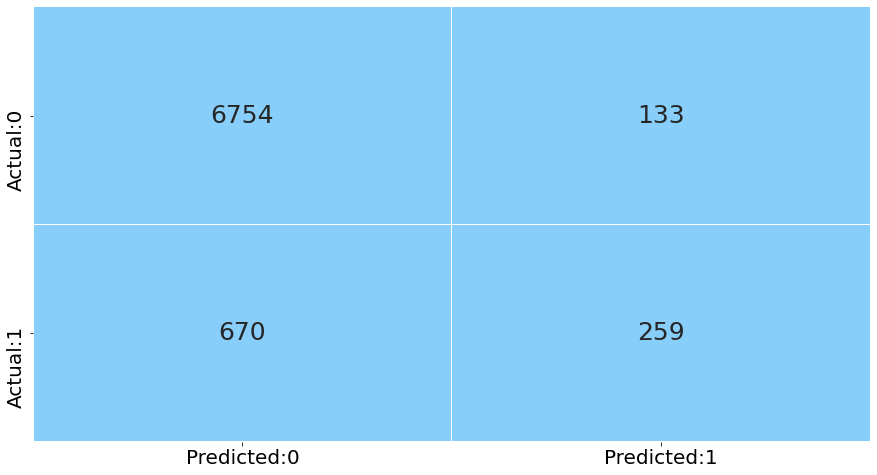

In [173]:
cm_bag_gr = confusion_matrix(ytest,ypred_gbcl)
conf_matrix = pd.DataFrame(data = cm_bag_gr,columns = ['Predicted:0','Predicted:1'], index = ['Actual:0','Actual:1'])
sns.heatmap(conf_matrix, annot = True, fmt = 'd', cmap = ListedColormap(['lightskyblue']), cbar = False, 
            linewidths = 0.1, annot_kws = {'size':25})

# set the font size of x-axis ticks using 'fontsize'
plt.xticks(fontsize = 20)

# set the font size of y-axis ticks using 'fontsize'
plt.yticks(fontsize = 20)

# display the plot
plt.show()

Text(0.5, 1.0, 'ROC-AUC-CURVE')

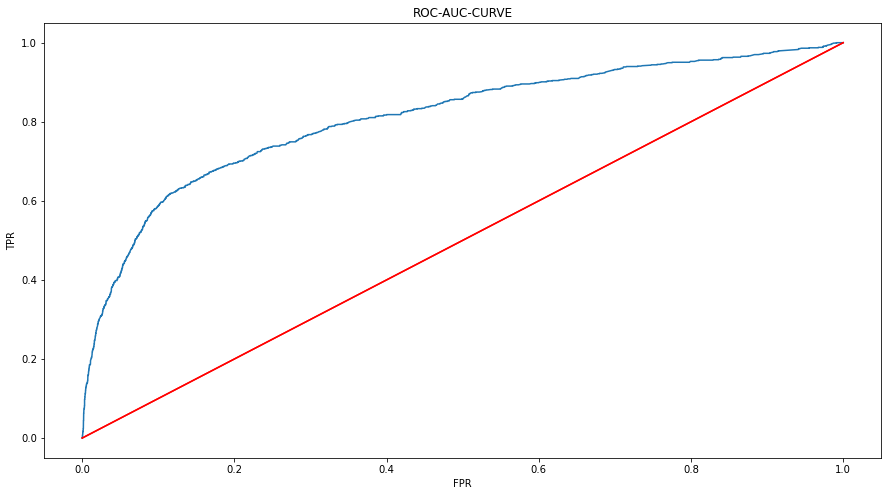

In [174]:
prob=gbcl.predict_proba(xtest)
req_prob=prob[:,1]
fpr,tpr,thresh=roc_curve(ytest,req_prob)
df1=pd.DataFrame({'FPR':fpr,'TPR':tpr,'Threshold':thresh})
plt.plot(fpr,tpr)
plt.plot([[0,0],[1,1]],color='red')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC-AUC-CURVE')

In [175]:
update_performance(name = 'Gradient Boosting', model = gbcl,test=ytest,pred=ypred_gbcl)

# print the dataframe
perf_score

,Model,Accuracy,Recall,Precision,F1 Score,AUC_Score
0,LogisticReg-Base,0.890993,0.221744,0.614925,0.325949,0.601506
1,LogisticReg-Scaled,0.622825,0.688913,0.193998,0.302744,0.651412
2,Decision Tree-Gini,0.823951,0.328310,0.288553,0.307150,0.609559
3,Decision Tree-Entropy,0.831372,0.348762,0.312440,0.329603,0.622617
4,Decision Tree-Tuned,0.895343,0.278794,0.636364,0.387725,0.628652
5,Random Forest,0.884084,0.284177,0.522772,0.368201,0.624592
6,Random Forest-Tuned,0.894575,0.182992,0.723404,0.292096,0.586777
7,Bagging Classifier-dt,0.878454,0.270183,0.479924,0.345730,0.615344
8,Bagging Classifier-knn,0.886387,0.264801,0.545455,0.356522,0.617517
9,Bagging Classifier-Log,0.891377,0.199139,0.637931,0.303527,0.591946


* In Gradient boosting classiifier algorihm F1cscoreis around 0.39 for class 1. Slightly increased as compared to all previous models for class 1
* Auc score is also increased to 0.629 but it's second highest from the models as first highest is logistic regression-scaled model

#### XGBOOST

In [176]:
from xgboost import XGBClassifier

In [177]:
xgb= XGBClassifier(random_state=100)
xgb.fit(xtrain,ytrain)
ypred_xgb= xgb.predict(xtest)
print(accuracy_score(ytest,ypred_xgb))

0.8931678607983623


In [178]:
xgb= XGBClassifier(booster='gbtree',gamma=3,max_depth=3, min_child_weight=3,
                   n_estimators=50, reg_lambda=1,random_state=100)
xgb.fit(xtrain,ytrain)


ypred_xgb= xgb.predict(xtest)
print(accuracy_score(ytest,ypred_xgb))

0.8962384851586489


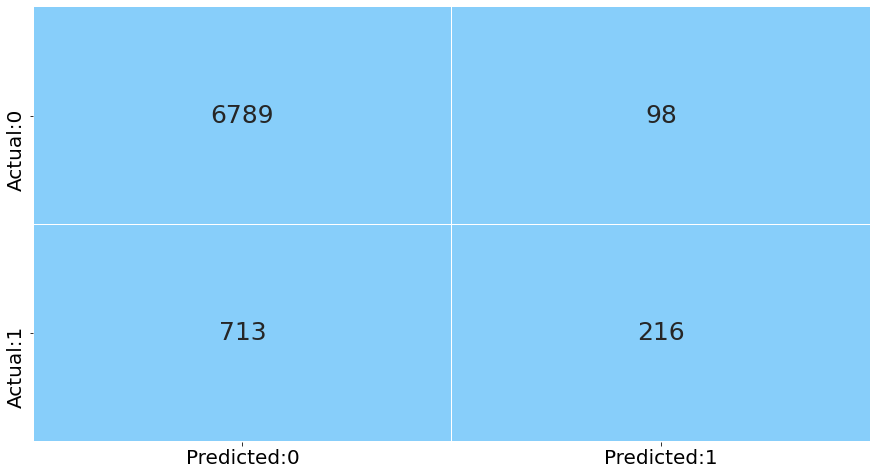

In [179]:
cm_bag_xg = confusion_matrix(ytest,ypred_xgb)
conf_matrix = pd.DataFrame(data = cm_bag_xg,columns = ['Predicted:0','Predicted:1'], index = ['Actual:0','Actual:1'])
sns.heatmap(conf_matrix, annot = True, fmt = 'd', cmap = ListedColormap(['lightskyblue']), cbar = False, 
            linewidths = 0.1, annot_kws = {'size':25})

# set the font size of x-axis ticks using 'fontsize'
plt.xticks(fontsize = 20)

# set the font size of y-axis ticks using 'fontsize'
plt.yticks(fontsize = 20)

# display the plot
plt.show()

Text(0.5, 1.0, 'ROC-AUC-CURVE')

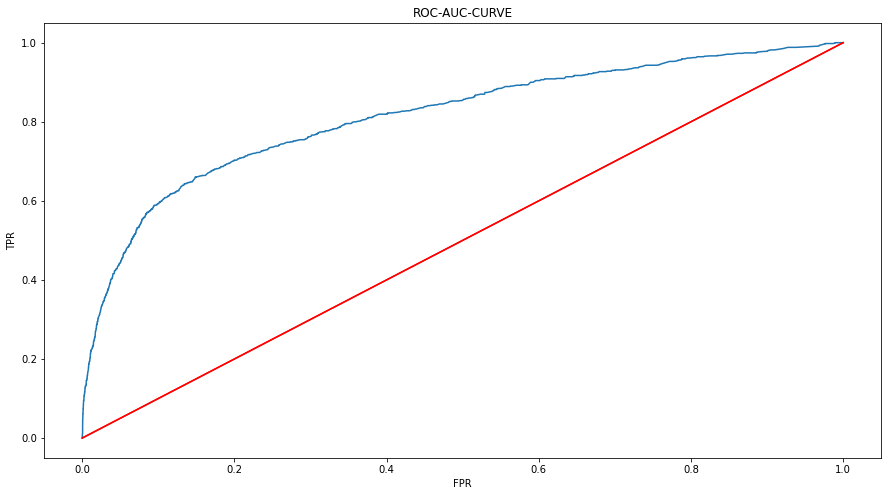

In [180]:
prob=xgb.predict_proba(xtest)
req_prob=prob[:,1]
fpr,tpr,thresh=roc_curve(ytest,req_prob)
df1=pd.DataFrame({'FPR':fpr,'TPR':tpr,'Threshold':thresh})
plt.plot(fpr,tpr)
plt.plot([[0,0],[1,1]],color='red')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC-AUC-CURVE')

In [181]:
update_performance(name = 'XGB', model = xgb,test=ytest,pred=ypred_xgb)

# print the dataframe
perf_score

,Model,Accuracy,Recall,Precision,F1 Score,AUC_Score
0,LogisticReg-Base,0.890993,0.221744,0.614925,0.325949,0.601506
1,LogisticReg-Scaled,0.622825,0.688913,0.193998,0.302744,0.651412
2,Decision Tree-Gini,0.823951,0.328310,0.288553,0.307150,0.609559
3,Decision Tree-Entropy,0.831372,0.348762,0.312440,0.329603,0.622617
4,Decision Tree-Tuned,0.895343,0.278794,0.636364,0.387725,0.628652
5,Random Forest,0.884084,0.284177,0.522772,0.368201,0.624592
6,Random Forest-Tuned,0.894575,0.182992,0.723404,0.292096,0.586777
7,Bagging Classifier-dt,0.878454,0.270183,0.479924,0.345730,0.615344
8,Bagging Classifier-knn,0.886387,0.264801,0.545455,0.356522,0.617517
9,Bagging Classifier-Log,0.891377,0.199139,0.637931,0.303527,0.591946


* Interestingly, F1 score for XGboosting classifier is around 0.34 which is less than gradient boosting and some other models too.
* Auc score is around 60% which is less than gradient boosting classifier

# Remodelling after Feature Selection

#### Based on statistical tests


* After doing statistical tests like ANOVA and Chisquare contingency test we found **Loan** and **Default** are the two features which are to be dropped. So we will check the f1-score after dropping them.

In [182]:
df_feat_select = df.drop(['loan','default'],axis=1)

In [183]:
df_feat_select

,age,job,marital,education,housing,contact,month,day_of_week,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,Term_Deposit_en
0,56,housemaid,married,basic.4y,no,telephone,may,mon,1,0,0,nonexistent,1.100000,93.994000,-36.400000,4.857000,5191.000000,0
1,57,services,married,high.school,no,telephone,may,mon,1,0,0,nonexistent,1.100000,93.994000,-36.400000,4.857000,5191.000000,0
2,37,services,married,high.school,yes,telephone,may,mon,1,0,0,nonexistent,1.100000,93.994000,-36.400000,4.857000,5191.000000,0
3,40,admin.,married,basic.6y,no,telephone,may,mon,1,0,0,nonexistent,1.100000,93.994000,-36.400000,4.857000,5191.000000,0
4,56,services,married,high.school,no,telephone,may,mon,1,0,0,nonexistent,1.100000,93.994000,-36.400000,4.857000,5191.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,73,retired,married,professional.course,yes,cellular,nov,fri,1,0,0,nonexistent,-1.100000,94.767000,-50.800000,1.028000,4963.600000,1
41184,46,blue-collar,married,professional.course,no,cellular,nov,fri,1,0,0,nonexistent,-1.100000,94.767000,-50.800000,1.028000,4963.600000,0
41185,56,retired,married,university.degree,yes,cellular,nov,fri,2,0,0,nonexistent,-1.100000,94.767000,-50.800000,1.028000,4963.600000,0
41186,44,technician,married,professional.course,no,cellular,nov,fri,1,0,0,nonexistent,-1.100000,94.767000,-50.800000,1.028000,4963.600000,1


In [184]:
# Encoding of this dataframe

df_select_cat = df_feat_select.select_dtypes(include=['object','category'])

In [185]:
dummy_select_cat = pd.get_dummies(data=df_select_cat,dtype=int,drop_first=True)

In [186]:
# concat with numerical dataframe

df_select_num = df_feat_select.select_dtypes(include=np.number)

df_select_final = pd.concat([df_select_num,dummy_select_cat],axis=1)

In [187]:
df_select_final

,age,campaign,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,Term_Deposit_en,job_blue-collar,job_entrepreneur,job_housemaid,job_management,job_retired,job_self-employed,job_services,job_student,job_technician,job_unemployed,marital_married,marital_single,education_basic.6y,education_basic.9y,education_high.school,education_illiterate,education_professional.course,education_university.degree,housing_yes,contact_telephone,month_aug,month_dec,month_jul,month_jun,month_mar,month_may,month_nov,month_oct,month_sep,day_of_week_mon,day_of_week_thu,day_of_week_tue,day_of_week_wed,pdays_1,poutcome_nonexistent,poutcome_success
0,56,1,0,1.100000,93.994000,-36.400000,4.857000,5191.000000,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0
1,57,1,0,1.100000,93.994000,-36.400000,4.857000,5191.000000,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0
2,37,1,0,1.100000,93.994000,-36.400000,4.857000,5191.000000,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0
3,40,1,0,1.100000,93.994000,-36.400000,4.857000,5191.000000,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0
4,56,1,0,1.100000,93.994000,-36.400000,4.857000,5191.000000,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,73,1,0,-1.100000,94.767000,-50.800000,1.028000,4963.600000,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0
41184,46,1,0,-1.100000,94.767000,-50.800000,1.028000,4963.600000,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0
41185,56,2,0,-1.100000,94.767000,-50.800000,1.028000,4963.600000,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0
41186,44,1,0,-1.100000,94.767000,-50.800000,1.028000,4963.600000,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0


In [188]:
# train test split
x_select = df_select_final
y= df_final['Target']

xtrain_select , xtest_select, ytrain_select, ytest_select = train_test_split(x,y,train_size=0.80,random_state=100)

In [189]:
xtrain_select

,age,campaign,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,job_blue-collar,job_entrepreneur,job_housemaid,job_management,job_retired,job_self-employed,job_services,job_student,job_technician,job_unemployed,marital_married,marital_single,education_basic.6y,education_basic.9y,education_high.school,education_illiterate,education_professional.course,education_university.degree,default_yes,housing_yes,loan_yes,contact_telephone,month_aug,month_dec,month_jul,month_jun,month_mar,month_may,month_nov,month_oct,month_sep,day_of_week_mon,day_of_week_thu,day_of_week_tue,day_of_week_wed,pdays_1,poutcome_nonexistent,poutcome_success
2602,40,2,0,1.100000,93.994000,-36.400000,4.856000,5191.000000,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0
34752,48,2,0,-1.800000,92.893000,-46.200000,1.266000,5099.100000,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0
31257,46,1,1,-1.800000,92.893000,-46.200000,1.334000,5099.100000,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0
7919,29,2,0,1.400000,94.465000,-41.800000,4.865000,5228.100000,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0
39618,44,2,1,-1.800000,93.876000,-40.000000,0.682000,5008.700000,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17192,51,1,0,1.400000,93.918000,-42.700000,4.962000,5228.100000,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0
83,49,1,0,1.100000,93.994000,-36.400000,4.857000,5191.000000,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0
12563,55,1,0,1.400000,93.918000,-42.700000,4.960000,5228.100000,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0
14829,31,1,0,1.400000,93.918000,-42.700000,4.957000,5228.100000,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0


In [190]:
lr_select = LogisticRegression(random_state=100)

lr_select.fit(xtrain_select,ytrain_select)

train_select_pred = lr_select.predict(xtrain_select)
test_select_pred = lr_select.predict(xtest_select)

In [191]:
print(classification_report(ytrain_select,train_select_pred))

              precision    recall  f1-score   support

           0       0.90      0.98      0.94     27597
           1       0.59      0.22      0.32      3666

    accuracy                           0.89     31263
   macro avg       0.75      0.60      0.63     31263
weighted avg       0.87      0.89      0.87     31263



In [192]:
print(classification_report(ytest_select,test_select_pred))

              precision    recall  f1-score   support

           0       0.90      0.98      0.94      6887
           1       0.61      0.22      0.33       929

    accuracy                           0.89      7816
   macro avg       0.76      0.60      0.63      7816
weighted avg       0.87      0.89      0.87      7816



In [193]:
 perf_score_feat = pd.DataFrame(columns=['Model', 'Accuracy', 'Recall', 'Precision', 'F1 Score', 'AUC_Score'])

In [194]:
def per_measures_feat(model,test,pred):
    accuracy    = accuracy_score(test,pred)
    f1score     = f1_score(test,pred)
    recall      = recall_score(test,pred)
    precision   = precision_score(test,pred)
    aucscore    = roc_auc_score(test,pred)
    return (accuracy,recall,precision,f1score,aucscore)


In [195]:
def update_performance_feat (name, model,test,pred):

    # assign 'comp_perf' as global variable
    global perf_score_feat
    perf_score_feat = perf_score_feat.append({'Model'       : name,
                                    'Accuracy'    : per_measures_feat(model,test,pred)[0],
                                    'Recall'      : per_measures_feat(model,test,pred)[1],
                                    'Precision'   : per_measures_feat(model,test,pred)[2],
                                    'F1 Score'    : per_measures_feat(model,test,pred)[3],
                                    'AUC_Score'   : per_measures_feat(model,test,pred)[4]
                                     },
                                   ignore_index = True)

Text(0.5, 1.0, 'ROC-AUC-CURVE')

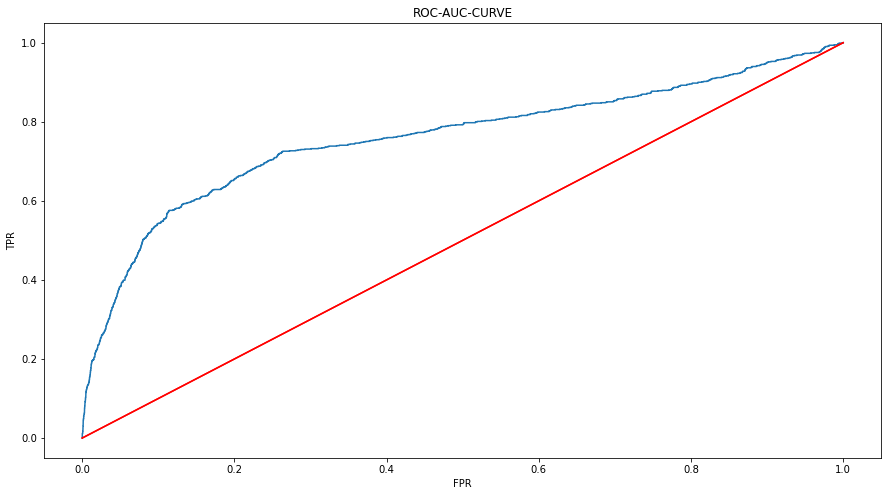

In [196]:
prob=lr_select.predict_proba(xtest_select)
req_prob=prob[:,1]
fpr,tpr,thresh=roc_curve(ytest,req_prob)
df1=pd.DataFrame({'FPR':fpr,'TPR':tpr,'Threshold':thresh})
plt.plot(fpr,tpr)
plt.plot([[0,0],[1,1]],color='red')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC-AUC-CURVE')

In [197]:
update_performance_feat(name = 'Logistic-feature_select', model = lr_select,test = ytest_select,pred = test_select_pred)

# print the dataframe
perf_score_feat

,Model,Accuracy,Recall,Precision,F1 Score,AUC_Score
0,Logistic-feature_select,0.890993,0.221744,0.614925,0.325949,0.601506


* After removing two features 'loan' and 'default' F1 score for logistic regression is same 
* Auc score also remains same after removing the 2 columns

# Decision Tree - Gini

In [198]:
dt_feat = DecisionTreeClassifier(random_state=100)
dt_feat.fit(xtrain_select,ytrain_select)

train_ypred_dt_select= dt_feat.predict(xtrain_select)
test_ypred_dt_select = dt_feat.predict(xtest_select)


Text(0.5, 1.0, 'ROC-AUC-CURVE')

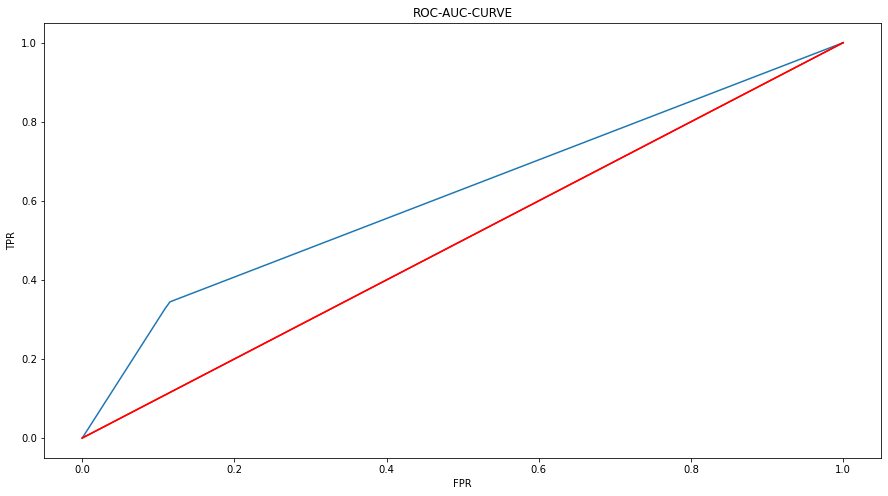

In [199]:
prob=dt_feat.predict_proba(xtest_select)
req_prob=prob[:,1]
fpr,tpr,thresh=roc_curve(ytest,req_prob)
df1=pd.DataFrame({'FPR':fpr,'TPR':tpr,'Threshold':thresh})
plt.plot(fpr,tpr)
plt.plot([[0,0],[1,1]],color='red')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC-AUC-CURVE')

In [200]:
update_performance_feat(name = 'Decision Tree-Gini_select', model = dt_feat, test=ytest_select, pred = test_ypred_dt_select)

# print the dataframe
perf_score_feat

,Model,Accuracy,Recall,Precision,F1 Score,AUC_Score
0,Logistic-feature_select,0.890993,0.221744,0.614925,0.325949,0.601506
1,Decision Tree-Gini_select,0.823951,0.328310,0.288553,0.307150,0.609559


* For decision tree gini also f1 score and auc score remains same after removing 2 features

# Decision Tree - Entropy

In [201]:
dt_e_feat = DecisionTreeClassifier(criterion='entropy',random_state=100)
dt_e_feat.fit(xtrain_select,ytrain_select)
test_ypred_dt_e_select = dt_e_feat.predict(xtest_select)

Text(0.5, 1.0, 'ROC-AUC-CURVE')

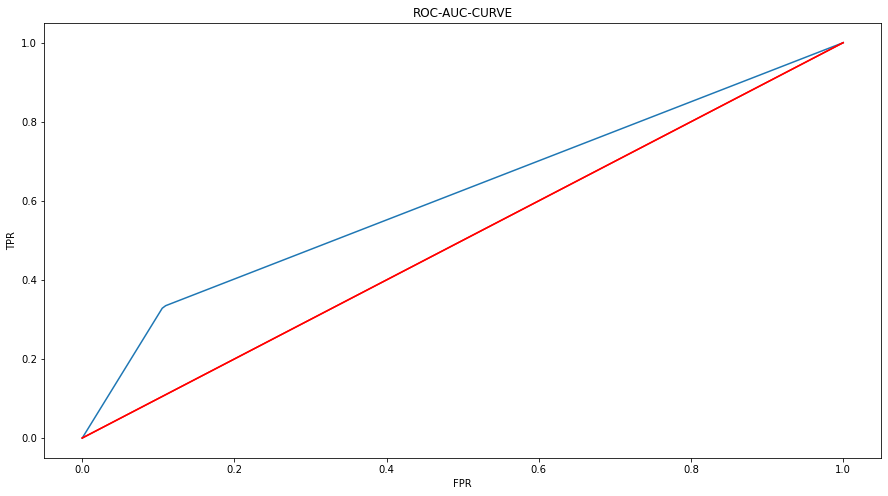

In [202]:
prob=dt_e_feat.predict_proba(xtest_select)
req_prob=prob[:,1]
fpr,tpr,thresh=roc_curve(ytest,req_prob)
df1=pd.DataFrame({'FPR':fpr,'TPR':tpr,'Threshold':thresh})
plt.plot(fpr,tpr)
plt.plot([[0,0],[1,1]],color='red')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC-AUC-CURVE')

In [203]:
update_performance_feat(name = 'Decision Tree-Entropy_select', model = dt_e_feat, test=ytest_select, pred = test_ypred_dt_e_select)

# print the dataframe
perf_score_feat

,Model,Accuracy,Recall,Precision,F1 Score,AUC_Score
0,Logistic-feature_select,0.890993,0.221744,0.614925,0.325949,0.601506
1,Decision Tree-Gini_select,0.823951,0.328310,0.288553,0.307150,0.609559
2,Decision Tree-Entropy_select,0.827533,0.328310,0.296404,0.311542,0.611592


* For decision tree wih entropy f1 score is slightly increased than decision tree with gini 
* Auc score also slightly increased than decision tree with gini 

# Tuning of Decision Tree

In [204]:
from sklearn.model_selection import GridSearchCV

In [205]:
tuned_paramaters = [{'criterion': ['entropy','gini'],
                     'max_depth': [10,11,12,13,14,15],
}]

In [206]:
dt_select_tune = DecisionTreeClassifier(random_state = 100)

tree_grid_select = GridSearchCV(estimator = dt_select_tune, # The estimator can be logistic, Linear reg, decision tree
                         param_grid = tuned_paramaters)

tree_grid_model_select = tree_grid_select.fit(xtrain_select, ytrain_select)
print('Best parameters for decision tree classifier: ', tree_grid_model_select.best_params_, '\n')

Best parameters for decision tree classifier:  {'criterion': 'entropy', 'max_depth': 10} 



In [207]:
# remodel

dt_grid_model_select = DecisionTreeClassifier(criterion = 'entropy',max_depth = 10,random_state = 10)

dt_grid_model_select = dt_grid_model_select.fit(xtrain_select,ytrain_select)

ypred_dt_tp_select = dt_grid_model_select.predict(xtest_select)

print(accuracy_score(ytest_select,ypred_dt_tp_select))
print(confusion_matrix(ytest_select,ypred_dt_tp_select))
print(classification_report(ytest_select,ypred_dt_tp_select))

0.8925281473899693
[[6721  166]
 [ 674  255]]
              precision    recall  f1-score   support

           0       0.91      0.98      0.94      6887
           1       0.61      0.27      0.38       929

    accuracy                           0.89      7816
   macro avg       0.76      0.63      0.66      7816
weighted avg       0.87      0.89      0.87      7816



Text(0.5, 1.0, 'ROC-AUC-CURVE')

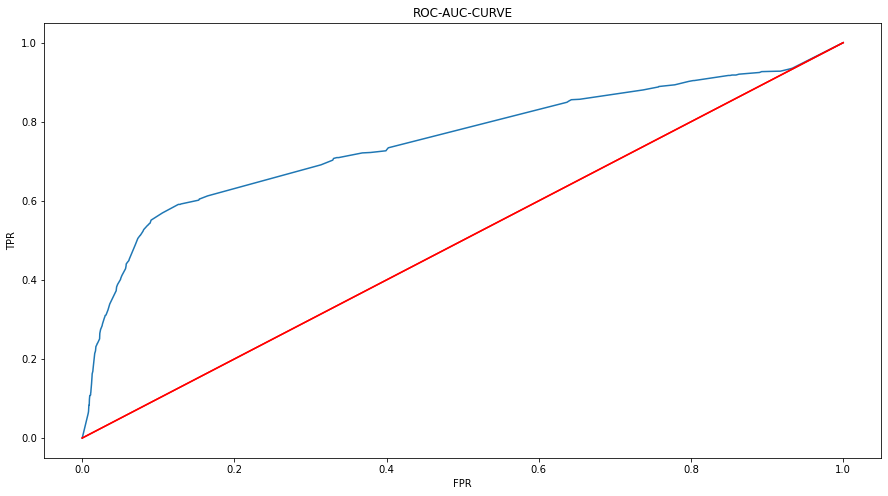

In [208]:
prob=dt_grid_model_select.predict_proba(xtest_select)
req_prob=prob[:,1]
fpr,tpr,thresh=roc_curve(ytest,req_prob)
df1=pd.DataFrame({'FPR':fpr,'TPR':tpr,'Threshold':thresh})
plt.plot(fpr,tpr)
plt.plot([[0,0],[1,1]],color='red')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC-AUC-CURVE')

In [209]:
update_performance_feat(name = 'Decision Tree-Tuned_select', model = dt_grid_model_select, test=ytest_select, pred=ypred_dt_tp_select)

# print the dataframe
perf_score_feat

,Model,Accuracy,Recall,Precision,F1 Score,AUC_Score
0,Logistic-feature_select,0.890993,0.221744,0.614925,0.325949,0.601506
1,Decision Tree-Gini_select,0.823951,0.328310,0.288553,0.307150,0.609559
2,Decision Tree-Entropy_select,0.827533,0.328310,0.296404,0.311542,0.611592
3,Decision Tree-Tuned_select,0.892528,0.274489,0.605701,0.377778,0.625193


* Decision tree tuned has f1 score more than previous models after removing loan and default columns
* Auc score is also increased as compared to previous models

# Random forest

In [210]:
rf_select = RandomForestClassifier(random_state=10)
rf_select.fit(xtrain_select,ytrain_select)

ypred_rf_select = rf_select.predict(xtest_select)

print(accuracy_score(ytest_select,ypred_rf_select))
print(confusion_matrix(ytest_select,ypred_rf_select))
print(classification_report(ytest_select,ypred_rf_select))


0.8851074718526101
[[6652  235]
 [ 663  266]]
              precision    recall  f1-score   support

           0       0.91      0.97      0.94      6887
           1       0.53      0.29      0.37       929

    accuracy                           0.89      7816
   macro avg       0.72      0.63      0.65      7816
weighted avg       0.86      0.89      0.87      7816



Text(0.5, 1.0, 'ROC-AUC-CURVE')

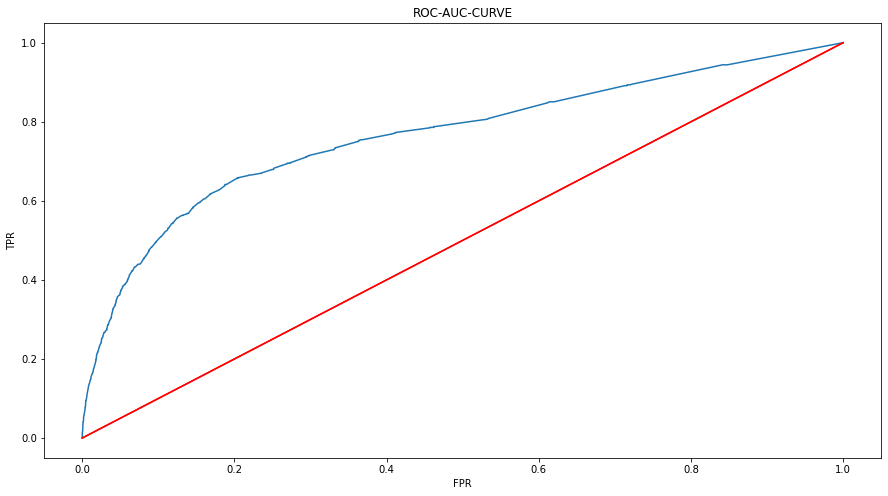

In [211]:
prob=rf_select.predict_proba(xtest_select)
req_prob=prob[:,1]
fpr,tpr,thresh=roc_curve(ytest,req_prob)
df1=pd.DataFrame({'FPR':fpr,'TPR':tpr,'Threshold':thresh})
plt.plot(fpr,tpr)
plt.plot([[0,0],[1,1]],color='red')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC-AUC-CURVE')

In [212]:
update_performance_feat(name = 'Random Forest_select', model = rf_select, test=ytest_select, pred=ypred_rf_select)

# print the dataframe
perf_score_feat

,Model,Accuracy,Recall,Precision,F1 Score,AUC_Score
0,Logistic-feature_select,0.890993,0.221744,0.614925,0.325949,0.601506
1,Decision Tree-Gini_select,0.823951,0.328310,0.288553,0.307150,0.609559
2,Decision Tree-Entropy_select,0.827533,0.328310,0.296404,0.311542,0.611592
3,Decision Tree-Tuned_select,0.892528,0.274489,0.605701,0.377778,0.625193
4,Random Forest_select,0.885107,0.286329,0.530938,0.372028,0.626104


* Random forest algorithm gives f1 score as 0.37 similar to decision tree tuned model 
* Auc score also similar to decision tree tuned model

### Tuning of Random Forest

In [213]:
params_select = [{'criterion': ['entropy', 'gini'],'n_estimators': [100],'max_depth': [10,15],'max_features': ['sqrt', 'log2'],
           'min_samples_split': [2,3],'min_samples_leaf': [5,6],'max_leaf_nodes': [8,9]}]

rf_select =RandomForestClassifier(random_state=10)

rf_cv_select = GridSearchCV(rf_select,params_select,scoring='accuracy')

rf_cv_select.fit(xtrain_select,ytrain_select)

rf_cv_select.best_params_



{'criterion': 'gini',
 'max_depth': 10,
 'max_features': 'sqrt',
 'max_leaf_nodes': 9,
 'min_samples_leaf': 5,
 'min_samples_split': 2,
 'n_estimators': 100}

In [214]:
rf_model_select = RandomForestClassifier(criterion ='gini',n_estimators =100, max_depth = 10, max_features = 'sqrt',
                                  max_leaf_nodes =9, min_samples_leaf =5, min_samples_split = 2, random_state = 100)


rf_model_select.fit(xtrain_select,ytrain_select)

ypred_rf_tp_select = rf_model_select.predict(xtest_select)

print(accuracy_score(ytest_select,ypred_rf_tp_select))
print(confusion_matrix(ytest_select,ypred_rf_tp_select))
print(classification_report(ytest_select,ypred_rf_tp_select))

0.8941914022517912
[[6822   65]
 [ 762  167]]
              precision    recall  f1-score   support

           0       0.90      0.99      0.94      6887
           1       0.72      0.18      0.29       929

    accuracy                           0.89      7816
   macro avg       0.81      0.59      0.62      7816
weighted avg       0.88      0.89      0.86      7816



Text(0.5, 1.0, 'ROC-AUC-CURVE')

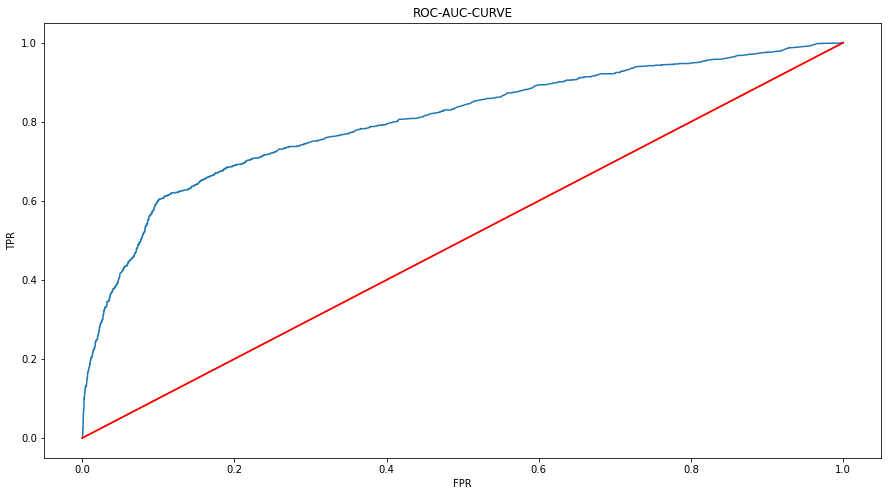

In [215]:
prob=rf_model_select.predict_proba(xtest_select)
req_prob=prob[:,1]
fpr,tpr,thresh=roc_curve(ytest,req_prob)
df1=pd.DataFrame({'FPR':fpr,'TPR':tpr,'Threshold':thresh})
plt.plot(fpr,tpr)
plt.plot([[0,0],[1,1]],color='red')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC-AUC-CURVE')

In [216]:
update_performance_feat(name = 'Random Forest-Tuned_select', model = rf_model_select,test = ytest_select, pred = ypred_rf_tp_select)

# print the dataframe
perf_score_feat

,Model,Accuracy,Recall,Precision,F1 Score,AUC_Score
0,Logistic-feature_select,0.890993,0.221744,0.614925,0.325949,0.601506
1,Decision Tree-Gini_select,0.823951,0.328310,0.288553,0.307150,0.609559
2,Decision Tree-Entropy_select,0.827533,0.328310,0.296404,0.311542,0.611592
3,Decision Tree-Tuned_select,0.892528,0.274489,0.605701,0.377778,0.625193
4,Random Forest_select,0.885107,0.286329,0.530938,0.372028,0.626104
5,Random Forest-Tuned_select,0.894191,0.179763,0.719828,0.287683,0.585163


* Random forest tuned model f1 score is less than previous models 
* Auc score also less as compared to previous models

# Before removing Loan and default column metrics

In [217]:
perf_score

,Model,Accuracy,Recall,Precision,F1 Score,AUC_Score
0,LogisticReg-Base,0.890993,0.221744,0.614925,0.325949,0.601506
1,LogisticReg-Scaled,0.622825,0.688913,0.193998,0.302744,0.651412
2,Decision Tree-Gini,0.823951,0.328310,0.288553,0.307150,0.609559
3,Decision Tree-Entropy,0.831372,0.348762,0.312440,0.329603,0.622617
4,Decision Tree-Tuned,0.895343,0.278794,0.636364,0.387725,0.628652
5,Random Forest,0.884084,0.284177,0.522772,0.368201,0.624592
6,Random Forest-Tuned,0.894575,0.182992,0.723404,0.292096,0.586777
7,Bagging Classifier-dt,0.878454,0.270183,0.479924,0.345730,0.615344
8,Bagging Classifier-knn,0.886387,0.264801,0.545455,0.356522,0.617517
9,Bagging Classifier-Log,0.891377,0.199139,0.637931,0.303527,0.591946


# After removing loan and default column metrics

In [218]:
perf_score_feat

,Model,Accuracy,Recall,Precision,F1 Score,AUC_Score
0,Logistic-feature_select,0.890993,0.221744,0.614925,0.325949,0.601506
1,Decision Tree-Gini_select,0.823951,0.328310,0.288553,0.307150,0.609559
2,Decision Tree-Entropy_select,0.827533,0.328310,0.296404,0.311542,0.611592
3,Decision Tree-Tuned_select,0.892528,0.274489,0.605701,0.377778,0.625193
4,Random Forest_select,0.885107,0.286329,0.530938,0.372028,0.626104
5,Random Forest-Tuned_select,0.894191,0.179763,0.719828,0.287683,0.585163
